# 01. Unsupervised Learning 

# Credit Card Dataset

https://www.kaggle.com/datasets/arjunbhasin2013/ccdata/data

Importing the necessary libraries

In [ ]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
from sklearn.compose import ColumnTransformer
from sklearn.preprocessing import StandardScaler, LabelEncoder, OneHotEncoder
from sklearn.experimental import enable_iterative_imputer
from sklearn.impute import IterativeImputer
from sklearn.cluster import KMeans
import random
import plotly.express as px
from sklearn.metrics import silhouette_score
from sklearn.decomposition import PCA
from sklearn.pipeline import Pipeline

In [ ]:
df = pd.read_csv(r"D:\User\University\Year 3\Machine Learning\Coursework\Unsupervised learning\credit card transactions\CC GENERAL.csv")

In [3]:
# Another copy
df_original = df

## Initial Data Preprocessing

In [4]:
df.shape

(8950, 18)

In [5]:
df.columns

Index(['CUST_ID', 'BALANCE', 'BALANCE_FREQUENCY', 'PURCHASES',
       'ONEOFF_PURCHASES', 'INSTALLMENTS_PURCHASES', 'CASH_ADVANCE',
       'PURCHASES_FREQUENCY', 'ONEOFF_PURCHASES_FREQUENCY',
       'PURCHASES_INSTALLMENTS_FREQUENCY', 'CASH_ADVANCE_FREQUENCY',
       'CASH_ADVANCE_TRX', 'PURCHASES_TRX', 'CREDIT_LIMIT', 'PAYMENTS',
       'MINIMUM_PAYMENTS', 'PRC_FULL_PAYMENT', 'TENURE'],
      dtype='object')

Column definitions

In [6]:
# CUST_ID : Identification of Credit Card holder (Categorical)
# BALANCE : The amount the customer owes and needs to pay
# BALANCE_FREQUENCY : How frequently the Balance is updated, score between 0 and 1 (1 = frequently updated, 0 = not frequently updated)
# PURCHASES : Amount of purchases made from account
# ONEOFF_PURCHASES : Maximum purchase amount done in one-go
# INSTALLMENTS_PURCHASES : Amount of purchase done in installment
# CASH_ADVANCE : Cash in advance given by the user
# PURCHASES_FREQUENCY : How frequently the Purchases are being made, score between 0 and 1 (1 = frequently purchased, 0 = not frequently purchased)
# ONEOFFPURCHASESFREQUENCY : How frequently Purchases are happening in one-go (1 = frequently purchased, 0 = not frequently purchased)
# PURCHASESINSTALLMENTSFREQUENCY : How frequently purchases in installments are being done (1 = frequently done, 0 = not frequently done)
# CASHADVANCEFREQUENCY : How frequently the cash in advance being paid
# CASHADVANCETRX : Number of Transactions made with "Cash in Advanced"
# PURCHASES_TRX : Numbe of purchase transactions made
# CREDIT_LIMIT : Limit of Credit Card for user
# PAYMENTS : Amount of Payment done by user
# MINIMUM_PAYMENTS : Minimum amount of payments made by user
# PRCFULLPAYMENT : Percent of full payment paid by user
# TENURE : Tenure of credit card service for user

In [7]:
# Changing the column names to lowercase
df.columns = df.columns.str.lower()

In [8]:
pd.set_option('display.max_columns', None)
df.head()

,cust_id,balance,balance_frequency,purchases,oneoff_purchases,installments_purchases,cash_advance,purchases_frequency,oneoff_purchases_frequency,purchases_installments_frequency,cash_advance_frequency,cash_advance_trx,purchases_trx,credit_limit,payments,minimum_payments,prc_full_payment,tenure
0,C10001,40.900749,0.818182,95.40,0.00,95.4,0.000000,0.166667,0.000000,0.083333,0.000000,0,2,1000.0,201.802084,139.509787,0.000000,12
1,C10002,3202.467416,0.909091,0.00,0.00,0.0,6442.945483,0.000000,0.000000,0.000000,0.250000,4,0,7000.0,4103.032597,1072.340217,0.222222,12
2,C10003,2495.148862,1.000000,773.17,773.17,0.0,0.000000,1.000000,1.000000,0.000000,0.000000,0,12,7500.0,622.066742,627.284787,0.000000,12
3,C10004,1666.670542,0.636364,1499.00,1499.00,0.0,205.788017,0.083333,0.083333,0.000000,0.083333,1,1,7500.0,0.000000,NaN,0.000000,12
4,C10005,817.714335,1.000000,16.00,16.00,0.0,0.000000,0.083333,0.083333,0.000000,0.000000,0,1,1200.0,678.334763,244.791237,0.000000,12


In [9]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 8950 entries, 0 to 8949
Data columns (total 18 columns):
 #   Column                            Non-Null Count  Dtype  
---  ------                            --------------  -----  
 0   cust_id                           8950 non-null   object 
 1   balance                           8950 non-null   float64
 2   balance_frequency                 8950 non-null   float64
 3   purchases                         8950 non-null   float64
 4   oneoff_purchases                  8950 non-null   float64
 5   installments_purchases            8950 non-null   float64
 6   cash_advance                      8950 non-null   float64
 7   purchases_frequency               8950 non-null   float64
 8   oneoff_purchases_frequency        8950 non-null   float64
 9   purchases_installments_frequency  8950 non-null   float64
 10  cash_advance_frequency            8950 non-null   float64
 11  cash_advance_trx                  8950 non-null   int64  
 12  purcha

In [10]:
# Checking for any duplicate values
df.duplicated('cust_id').sum()

np.int64(0)

Hence the dataset does not contain any duplicate records

In [11]:
# Descriptive statistics  for the numerical features

df.describe().transpose()

,count,mean,std,min,25%,50%,75%,max
balance,8950.0,1564.474828,2081.531879,0.000000,128.281915,873.385231,2054.140036,19043.13856
balance_frequency,8950.0,0.877271,0.236904,0.000000,0.888889,1.000000,1.000000,1.00000
purchases,8950.0,1003.204834,2136.634782,0.000000,39.635000,361.280000,1110.130000,49039.57000
oneoff_purchases,8950.0,592.437371,1659.887917,0.000000,0.000000,38.000000,577.405000,40761.25000
installments_purchases,8950.0,411.067645,904.338115,0.000000,0.000000,89.000000,468.637500,22500.00000
cash_advance,8950.0,978.871112,2097.163877,0.000000,0.000000,0.000000,1113.821139,47137.21176
purchases_frequency,8950.0,0.490351,0.401371,0.000000,0.083333,0.500000,0.916667,1.00000
oneoff_purchases_frequency,8950.0,0.202458,0.298336,0.000000,0.000000,0.083333,0.300000,1.00000
purchases_installments_frequency,8950.0,0.364437,0.397448,0.000000,0.000000,0.166667,0.750000,1.00000
cash_advance_frequency,8950.0,0.135144,0.200121,0.000000,0.000000,0.000000,0.222222,1.50000


## EDA (Exploratory Data Analysis)

In [12]:
correlations = df.corr(numeric_only=True)

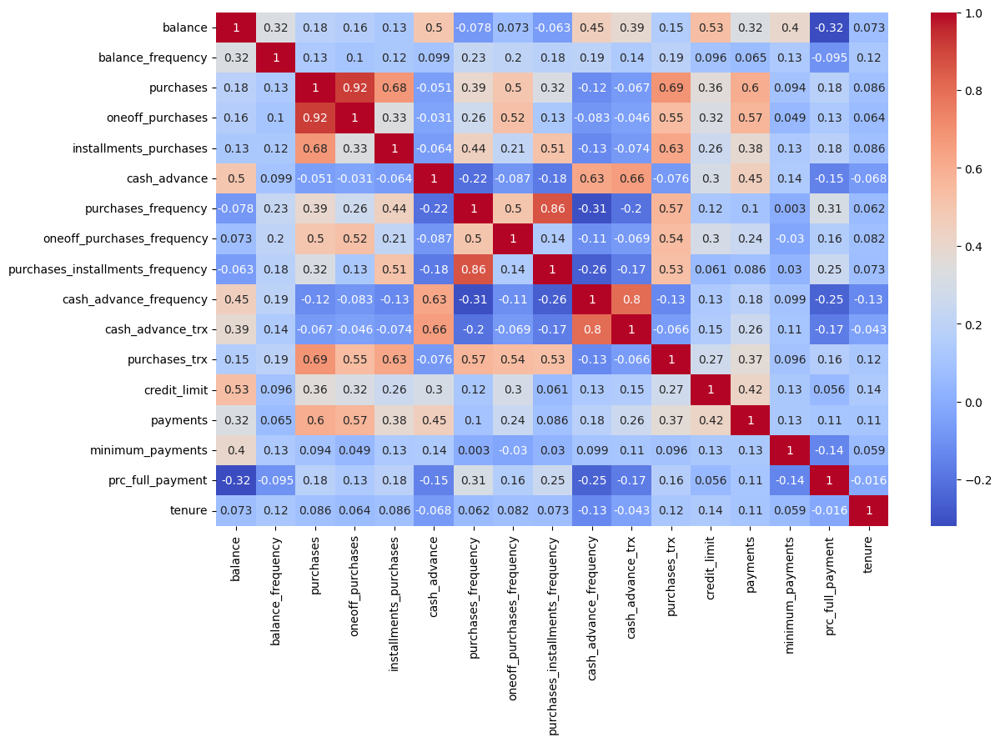

In [13]:
plt.figure(figsize=(13, 8))
sns.heatmap(data=correlations, annot=True, cmap='coolwarm');

<Figure size 1200x800 with 0 Axes>

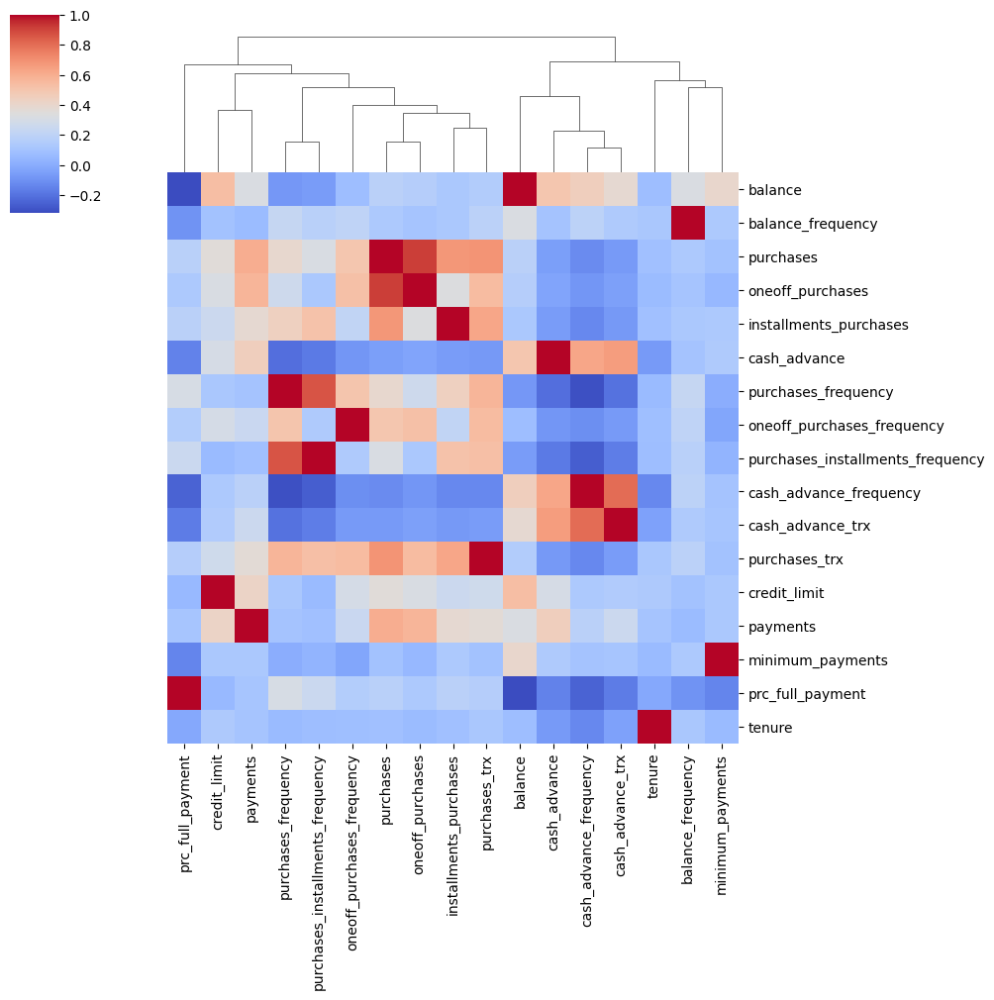

In [14]:
plt.figure(figsize=(12, 8))
sns.clustermap(data=correlations,
               row_cluster=False,
               cmap='coolwarm',
               cbar_pos=(0, 0.8, 0.05, 0.2),
               annot=False)
plt.show()

In [15]:
# sns.pairplot(data=df, corner=True)
# plt.show()

In [16]:
df.head()

,cust_id,balance,balance_frequency,purchases,oneoff_purchases,installments_purchases,cash_advance,purchases_frequency,oneoff_purchases_frequency,purchases_installments_frequency,cash_advance_frequency,cash_advance_trx,purchases_trx,credit_limit,payments,minimum_payments,prc_full_payment,tenure
0,C10001,40.900749,0.818182,95.40,0.00,95.4,0.000000,0.166667,0.000000,0.083333,0.000000,0,2,1000.0,201.802084,139.509787,0.000000,12
1,C10002,3202.467416,0.909091,0.00,0.00,0.0,6442.945483,0.000000,0.000000,0.000000,0.250000,4,0,7000.0,4103.032597,1072.340217,0.222222,12
2,C10003,2495.148862,1.000000,773.17,773.17,0.0,0.000000,1.000000,1.000000,0.000000,0.000000,0,12,7500.0,622.066742,627.284787,0.000000,12
3,C10004,1666.670542,0.636364,1499.00,1499.00,0.0,205.788017,0.083333,0.083333,0.000000,0.083333,1,1,7500.0,0.000000,NaN,0.000000,12
4,C10005,817.714335,1.000000,16.00,16.00,0.0,0.000000,0.083333,0.083333,0.000000,0.000000,0,1,1200.0,678.334763,244.791237,0.000000,12


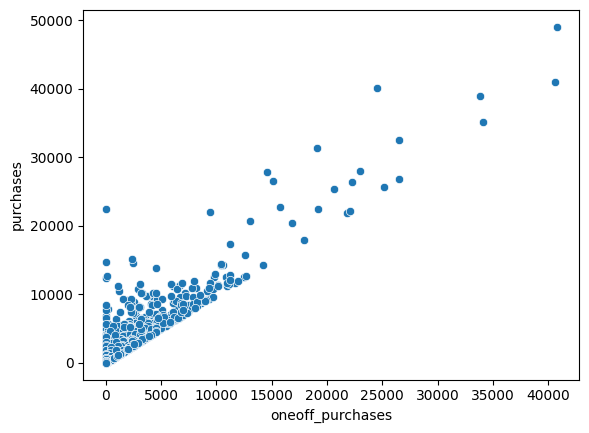

In [17]:
sns.scatterplot(data=df,
                x='oneoff_purchases',        # maximum purchase amount done in one go
                y='purchases',               # amount of purchases made
                )

plt.show()

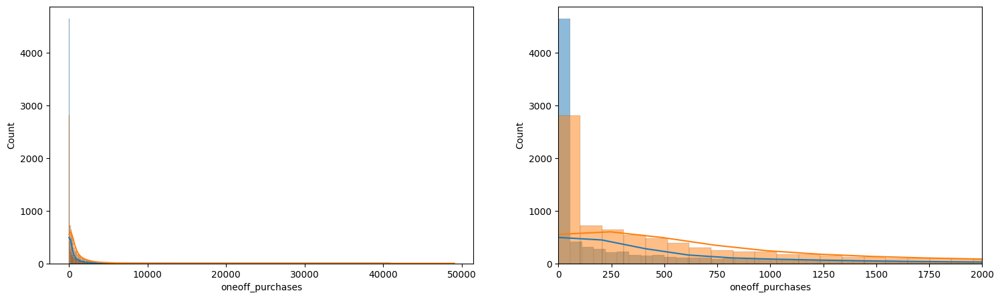

In [18]:
plt.figure(figsize=(18, 5))

plt.subplot(1, 2, 1)
sns.histplot(data=df,
             x = 'oneoff_purchases',
             kde=True)

sns.histplot(data=df,
             x = 'purchases',
             kde=True)


plt.subplot(1, 2, 2)
sns.histplot(data=df,
             x = 'oneoff_purchases',
             kde=True)

sns.histplot(data=df,
             x = 'purchases',
             kde=True)
plt.xlim(0, 2000)    # a closer look due to outliers

plt.show()

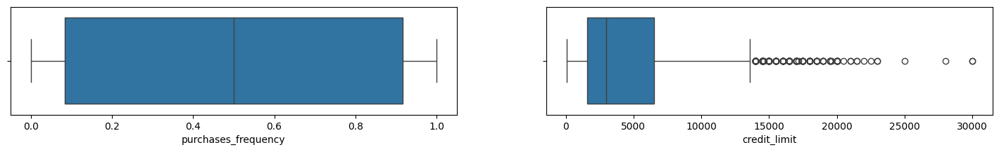

In [19]:
plt.figure(figsize=(18, 2))

plt.subplot(1, 2, 1)
sns.boxplot(data=df,
             x = 'purchases_frequency')


plt.subplot(1, 2, 2)
sns.boxplot(data=df,
             x = 'credit_limit')

plt.show()

**The frequency of purchasing is symmetrical but the presense of outliers indicate a mix of customers depending on the value**

In [20]:
def outlier_thresholds(df, col):

  # Calculate quantiles
  q1 = df[col].quantile(0.25)
  q3 = df[col].quantile(0.75)

  # Calculate IQR
  iqr = q3 - q1

  # Calculate outlier thresholds
  lower_threshold = q1 - 1.5 * iqr
  upper_threshold = q3 + 1.5 * iqr

  return lower_threshold, upper_threshold

In [21]:
outlier_thresholds(df, 'credit_limit')

(np.float64(-5750.0), np.float64(13850.0))

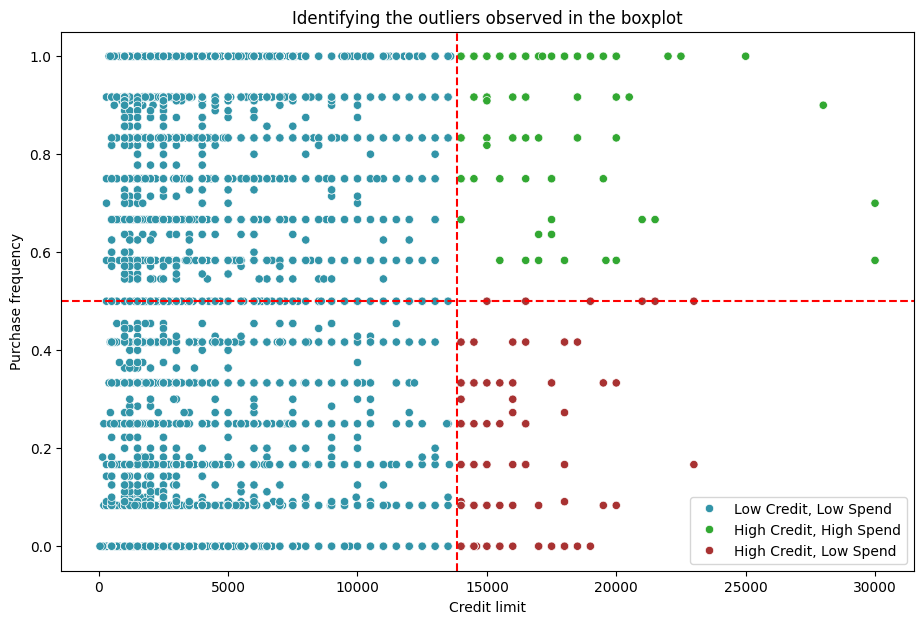

In [22]:
# Creating a categorical column
df["limit_freq_category"] = "Low Credit, Low Spend"
df.loc[(df['credit_limit'] > 13850) & (df['purchases_frequency'] > 0.5), 'limit_freq_category'] = "High Credit, High Spend"
df.loc[(df['credit_limit'] > 13850) & (df['purchases_frequency'] <= 0.5), 'limit_freq_category'] = "High Credit, Low Spend"


plt.figure(figsize=(11, 7))

sns.scatterplot(data=df,
             y='purchases_frequency',
             x='credit_limit',
             hue='limit_freq_category',
             palette = {'Low Credit, Low Spend':'#3294a8',
                        'High Credit, High Spend':'#32a832',
                        'High Credit, Low Spend':'#a83232'})


plt.axvline(x=13850, color='red', linestyle='--')
plt.axhline(y=0.5, color='red', linestyle='--')        # Assumption: Frequent customers if probablity > 0.5

plt.title('Identifying the outliers observed in the boxplot')
plt.xlabel('Credit limit')
plt.ylabel('Purchase frequency')
plt.legend()
plt.show()

In [23]:
df['limit_freq_category'].value_counts()

,count
limit_freq_category,
"Low Credit, Low Spend",8702
"High Credit, High Spend",151
"High Credit, Low Spend",97


**Identifying high risk customers**

In [24]:
# Credit utilization: Percentage of the available credit limit that is being using
# Recommended rate: Below 30% or 10%  but not 0
# Hence, it is good to keep the balance low

df['credit_utilization_ratio'] = df['balance'] / df['credit_limit']

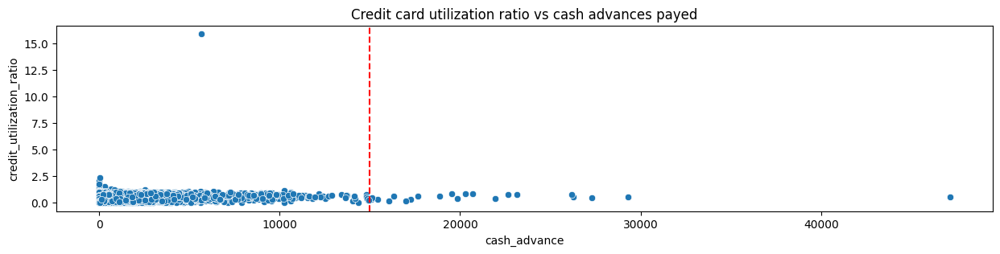

In [25]:
plt.figure(figsize=(15, 3))
sns.scatterplot(data=df,
                x='cash_advance',
                y='credit_utilization_ratio')

plt.title('Credit card utilization ratio vs cash advances payed')
plt.axvline(15000, color='red', linestyle='--')
plt.show()

<Axes: xlabel='credit_utilization_ratio'>

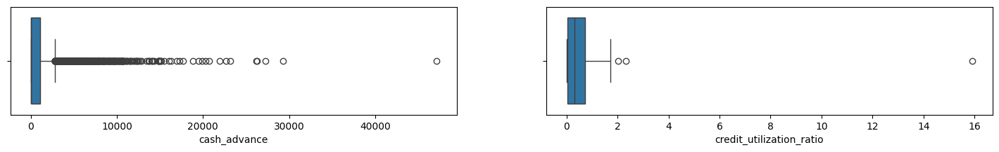

In [26]:
plt.figure(figsize=(18, 2))

plt.subplot(1, 2, 1)
sns.boxplot(data=df,
             x = 'cash_advance')

plt.subplot(1, 2, 2)
sns.boxplot(data=df,
             x = 'credit_utilization_ratio')

**As can be seen alot of ouliers in cash advance, suggests that alot of people take out very large cash advances**

**There are 3 outliers in the credit utlization ratio (risky behavior)**

In [27]:
# 3 outliers possibly suggesting risky behavior
df[df['credit_utilization_ratio'] > outlier_thresholds(df=df, col='credit_utilization_ratio')[1]]

,cust_id,balance,balance_frequency,purchases,oneoff_purchases,installments_purchases,cash_advance,purchases_frequency,oneoff_purchases_frequency,purchases_installments_frequency,cash_advance_frequency,cash_advance_trx,purchases_trx,credit_limit,payments,minimum_payments,prc_full_payment,tenure,limit_freq_category,credit_utilization_ratio
567,C10591,3457.086184,1.000000,2448.6,0.0,2448.6,0.000000,1.0,0.0,1.0,0.000000,0,12,1700.0,227.514473,38512.124770,0.000000,12,"Low Credit, Low Spend",2.033580
3469,C13566,348.813275,1.000000,0.0,0.0,0.0,27.740449,0.0,0.0,0.0,0.083333,1,0,150.0,804.063354,3727.643932,0.083333,12,"Low Credit, Low Spend",2.325422
6951,C17140,795.497557,0.909091,0.0,0.0,0.0,5676.779668,0.0,0.0,0.0,0.500000,6,0,50.0,7570.207782,410.260506,0.444444,12,"Low Credit, Low Spend",15.909951


In [28]:
# Checking if these outliers are also present in the cash advance outliers

df[(df['credit_utilization_ratio'] > outlier_thresholds(df=df, col='credit_utilization_ratio')[1]) & (df['cash_advance'] > outlier_thresholds(df=df, col='cash_advance')[1])]

,cust_id,balance,balance_frequency,purchases,oneoff_purchases,installments_purchases,cash_advance,purchases_frequency,oneoff_purchases_frequency,purchases_installments_frequency,cash_advance_frequency,cash_advance_trx,purchases_trx,credit_limit,payments,minimum_payments,prc_full_payment,tenure,limit_freq_category,credit_utilization_ratio
6951,C17140,795.497557,0.909091,0.0,0.0,0.0,5676.779668,0.0,0.0,0.0,0.5,6,0,50.0,7570.207782,410.260506,0.444444,12,"Low Credit, Low Spend",15.909951


***Customer C17140 could be possibly a risk ***

In [29]:
df.iloc[6951]

,6951
cust_id,C17140
balance,795.497557
balance_frequency,0.909091
purchases,0.0
oneoff_purchases,0.0
installments_purchases,0.0
cash_advance,5676.779668
purchases_frequency,0.0
oneoff_purchases_frequency,0.0
purchases_installments_frequency,0.0


***Even though an outlier, it is below the recommended rate of 30% ***

In [30]:
# Making a column to identify if a customer has made late payments of not
# If payments made are lesser than the minimum payment this should indicate that it is a late payment
# But need payment history to conclude this as this is an aggregrate

df['late_payments'] = 'On-time'
df.loc[df['payments'] < df['minimum_payments'], 'late_payments'] = 'Late'

In [31]:
df['late_payments'].value_counts()

,count
late_payments,
On-time,6585
Late,2365


In [32]:
# Ratio of cash advance to credit limit
# A high ratio can be problematic or a chance to offer to upgrade the customer's credit limit as they rely on credit limit alot comparatively

df['cash_advance_to_credit_limit_ratio'] = df['cash_advance'] / df['credit_limit']

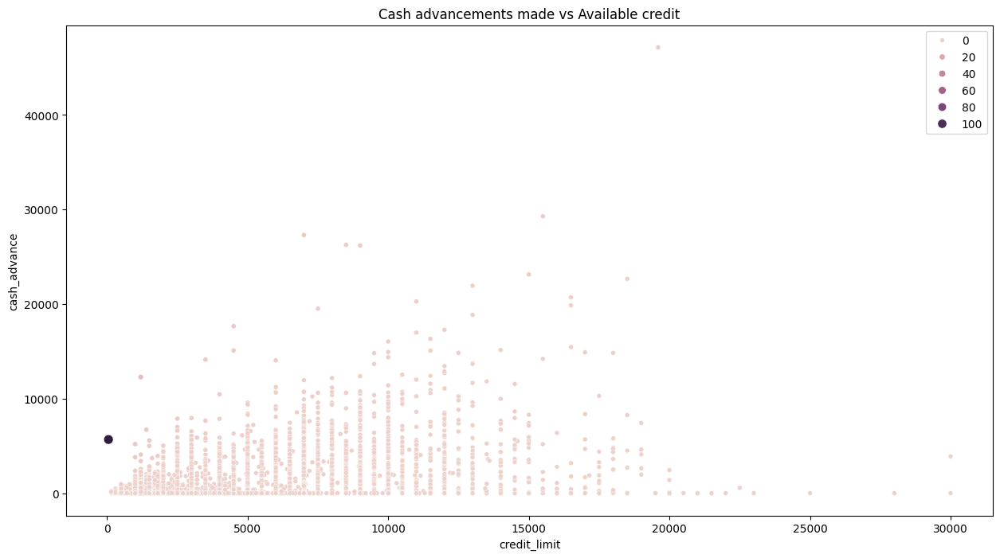

In [33]:
plt.figure(figsize=(15, 8))
sns.scatterplot(data=df,
                x='credit_limit',
                y='cash_advance',
                size='cash_advance_to_credit_limit_ratio',
                hue='cash_advance_to_credit_limit_ratio')
plt.title('Cash advancements made vs Available credit')
plt.legend()
plt.show()

Observations

*   Many customers have low credit limits due to the heavy clustering on the left
*   The darker big spot indicates a customer that has a very high credit usage **bold text**



In [34]:
df['credit_limit'].argmin()

np.int64(6951)

**Same customer as before with customer id: C17140**

In [35]:
df.columns

Index(['cust_id', 'balance', 'balance_frequency', 'purchases',
       'oneoff_purchases', 'installments_purchases', 'cash_advance',
       'purchases_frequency', 'oneoff_purchases_frequency',
       'purchases_installments_frequency', 'cash_advance_frequency',
       'cash_advance_trx', 'purchases_trx', 'credit_limit', 'payments',
       'minimum_payments', 'prc_full_payment', 'tenure', 'limit_freq_category',
       'credit_utilization_ratio', 'late_payments',
       'cash_advance_to_credit_limit_ratio'],
      dtype='object')

In [36]:
df = df.drop(['cust_id', 'limit_freq_category', 'credit_utilization_ratio', 'late_payments', 'cash_advance_to_credit_limit_ratio'], axis=1)

In [37]:
df_original.drop(['cust_id', 'limit_freq_category',
       'credit_utilization_ratio', 'late_payments',
       'cash_advance_to_credit_limit_ratio'], axis=1)

,balance,balance_frequency,purchases,oneoff_purchases,installments_purchases,cash_advance,purchases_frequency,oneoff_purchases_frequency,purchases_installments_frequency,cash_advance_frequency,cash_advance_trx,purchases_trx,credit_limit,payments,minimum_payments,prc_full_payment,tenure
0,40.900749,0.818182,95.40,0.00,95.40,0.000000,0.166667,0.000000,0.083333,0.000000,0,2,1000.0,201.802084,139.509787,0.000000,12
1,3202.467416,0.909091,0.00,0.00,0.00,6442.945483,0.000000,0.000000,0.000000,0.250000,4,0,7000.0,4103.032597,1072.340217,0.222222,12
2,2495.148862,1.000000,773.17,773.17,0.00,0.000000,1.000000,1.000000,0.000000,0.000000,0,12,7500.0,622.066742,627.284787,0.000000,12
3,1666.670542,0.636364,1499.00,1499.00,0.00,205.788017,0.083333,0.083333,0.000000,0.083333,1,1,7500.0,0.000000,NaN,0.000000,12
4,817.714335,1.000000,16.00,16.00,0.00,0.000000,0.083333,0.083333,0.000000,0.000000,0,1,1200.0,678.334763,244.791237,0.000000,12
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
8945,28.493517,1.000000,291.12,0.00,291.12,0.000000,1.000000,0.000000,0.833333,0.000000,0,6,1000.0,325.594462,48.886365,0.500000,6
8946,19.183215,1.000000,300.00,0.00,300.00,0.000000,1.000000,0.000000,0.833333,0.000000,0,6,1000.0,275.861322,NaN,0.000000,6
8947,23.398673,0.833333,144.40,0.00,144.40,0.000000,0.833333,0.000000,0.666667,0.000000,0,5,1000.0,81.270775,82.418369,0.250000,6
8948,13.457564,0.833333,0.00,0.00,0.00,36.558778,0.000000,0.000000,0.000000,0.166667,2,0,500.0,52.549959,55.755628,0.250000,6


Checking for the distributions of the columns

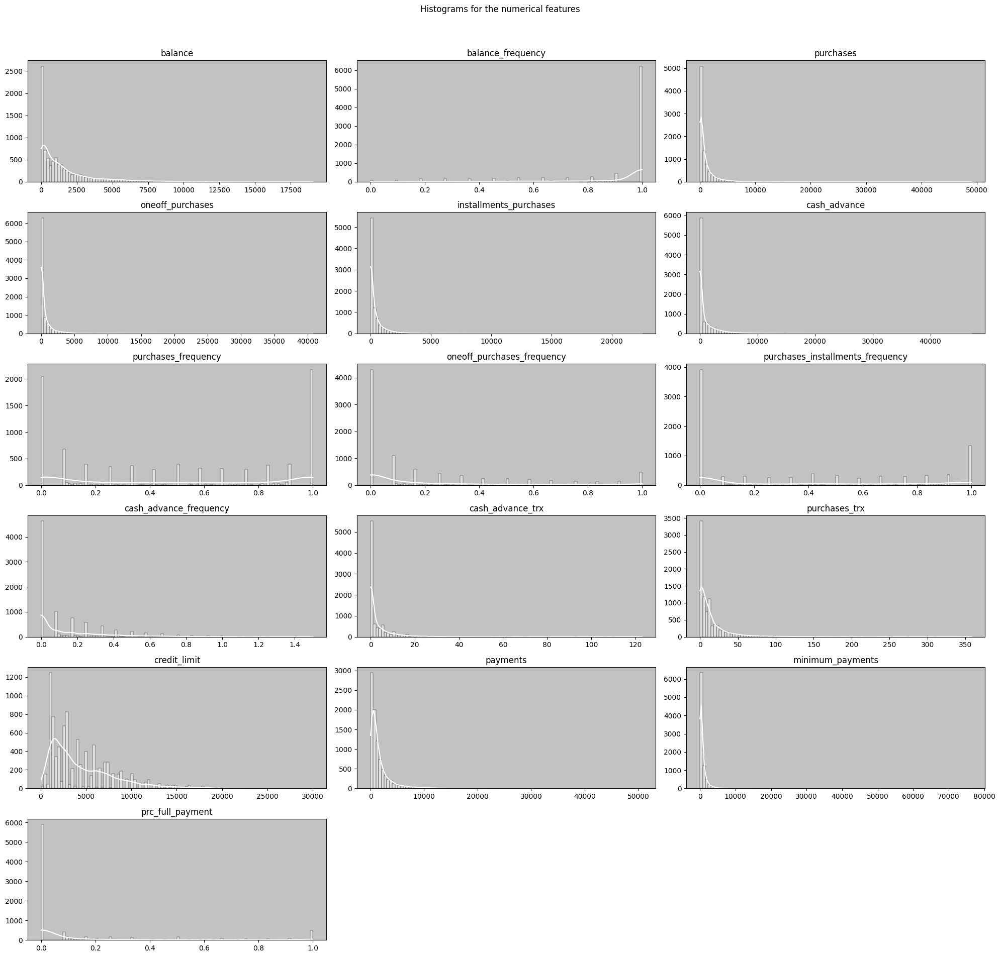

In [38]:
plt.figure(figsize=(20,20))

for i in range(len(df.drop('tenure', axis=1).columns)):
  axes = plt.subplot(6, 3, i+1)
  sns.histplot(data=df, x=df.columns[i], color='white', bins=100, kde=True)
  plt.xlabel('')
  plt.ylabel('')
  plt.title(df.columns[i])
  axes.set_facecolor('#c2c2c2')

plt.suptitle('Histograms for the numerical features')
plt.tight_layout(rect=[0, 0.03, 1, 0.96])
plt.subplots_adjust(hspace=0.25)

Skewness measure for each column

In [39]:
df.skew()

,0
balance,2.393386
balance_frequency,-2.023266
purchases,8.144269
oneoff_purchases,10.045083
installments_purchases,7.299120
cash_advance,5.166609
purchases_frequency,0.060164
oneoff_purchases_frequency,1.535613
purchases_installments_frequency,0.509201
cash_advance_frequency,1.828686


Using boxplots to check for potential outliers

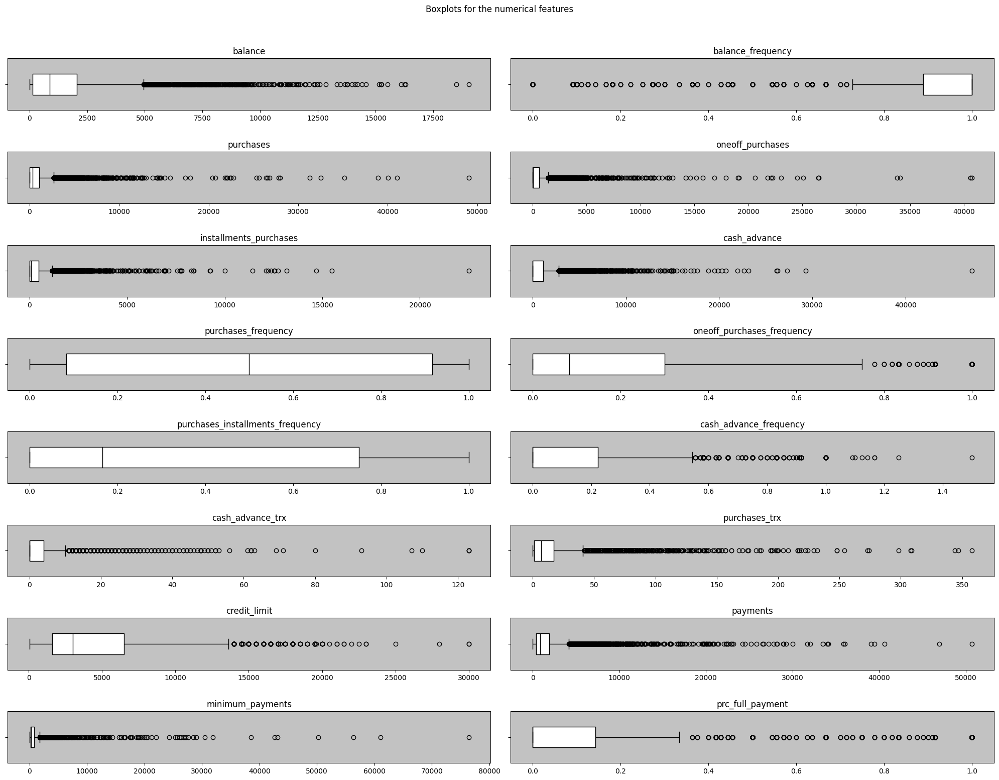

In [40]:
plt.figure(figsize=(20,18))

for i in range(len(df.drop('tenure', axis=1).columns)):
  axes = plt.subplot(9, 2, i+1)
  sns.boxplot(data=df, x=df.columns[i], color='white', linecolor='black', width=0.4)
  plt.xlabel('')
  plt.ylabel('')
  plt.title(df.columns[i])
  axes.set_facecolor('#c2c2c2')

plt.suptitle('Boxplots for the numerical features')
plt.tight_layout(rect=[0, 0.03, 1, 0.96])
plt.subplots_adjust(hspace=0.8)

## Further Data Preprocessing

### Outliers

Cleaning outliers

In [41]:
df.head()

,balance,balance_frequency,purchases,oneoff_purchases,installments_purchases,cash_advance,purchases_frequency,oneoff_purchases_frequency,purchases_installments_frequency,cash_advance_frequency,cash_advance_trx,purchases_trx,credit_limit,payments,minimum_payments,prc_full_payment,tenure
0,40.900749,0.818182,95.40,0.00,95.4,0.000000,0.166667,0.000000,0.083333,0.000000,0,2,1000.0,201.802084,139.509787,0.000000,12
1,3202.467416,0.909091,0.00,0.00,0.0,6442.945483,0.000000,0.000000,0.000000,0.250000,4,0,7000.0,4103.032597,1072.340217,0.222222,12
2,2495.148862,1.000000,773.17,773.17,0.0,0.000000,1.000000,1.000000,0.000000,0.000000,0,12,7500.0,622.066742,627.284787,0.000000,12
3,1666.670542,0.636364,1499.00,1499.00,0.0,205.788017,0.083333,0.083333,0.000000,0.083333,1,1,7500.0,0.000000,NaN,0.000000,12
4,817.714335,1.000000,16.00,16.00,0.0,0.000000,0.083333,0.083333,0.000000,0.000000,0,1,1200.0,678.334763,244.791237,0.000000,12


In [42]:
for column in df.columns:
  print(f'Column: {column}\nNumber of unique_values: {df[column].nunique()}')
  print()

Column: balance
Number of unique_values: 8871

Column: balance_frequency
Number of unique_values: 43

Column: purchases
Number of unique_values: 6203

Column: oneoff_purchases
Number of unique_values: 4014

Column: installments_purchases
Number of unique_values: 4452

Column: cash_advance
Number of unique_values: 4323

Column: purchases_frequency
Number of unique_values: 47

Column: oneoff_purchases_frequency
Number of unique_values: 47

Column: purchases_installments_frequency
Number of unique_values: 47

Column: cash_advance_frequency
Number of unique_values: 54

Column: cash_advance_trx
Number of unique_values: 65

Column: purchases_trx
Number of unique_values: 173

Column: credit_limit
Number of unique_values: 205

Column: payments
Number of unique_values: 8711

Column: minimum_payments
Number of unique_values: 8636

Column: prc_full_payment
Number of unique_values: 47

Column: tenure
Number of unique_values: 7



In [43]:
df_continuous = df[['balance', 'purchases', 'oneoff_purchases', 'installments_purchases', 'cash_advance',
                   'payments', 'minimum_payments', 'purchases_frequency', 'oneoff_purchases_frequency',
                   'purchases_installments_frequency']]

In [44]:
q1 = df_continuous.quantile(0.25)
q3 = df_continuous.quantile(0.75)
iqr = q3 - q1

outlier_count = df_continuous[(df_continuous <  (q1 - 1.5 * iqr)) | (df_continuous > (q3 + 1.5 * iqr))].count()

pd.DataFrame(outlier_count, columns=['outlier_count'])

,outlier_count
balance,695
purchases,808
oneoff_purchases,1013
installments_purchases,867
cash_advance,1030
payments,808
minimum_payments,841
purchases_frequency,0
oneoff_purchases_frequency,782
purchases_installments_frequency,0


Visualizing records with any outliers

In [45]:
outlier_mask = (df_continuous <  (q1 - 1.5 * iqr)) | (df_continuous > (q3 + 1.5 * iqr))
outlier_indices = df_continuous[outlier_mask.any(axis=1)].index

In [46]:
df_outliers = df.loc[outlier_indices]

In [47]:
print(f'Total number of records or rows with any outliers: {len(df_outliers)}')

Total number of records or rows with any outliers: 3289


### Null values

Checking for null values

In [48]:
df.isnull().sum()

,0
balance,0
balance_frequency,0
purchases,0
oneoff_purchases,0
installments_purchases,0
cash_advance,0
purchases_frequency,0
oneoff_purchases_frequency,0
purchases_installments_frequency,0
cash_advance_frequency,0


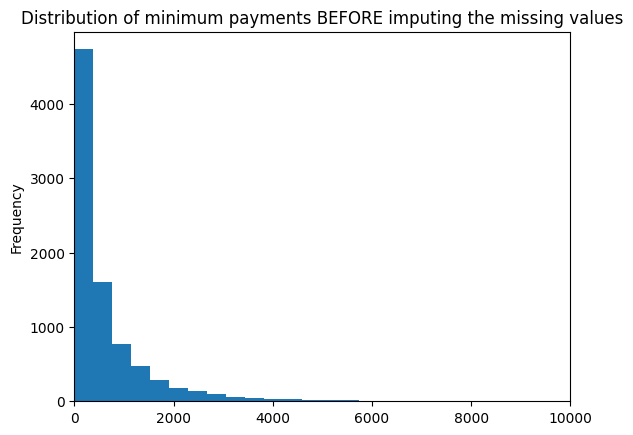

In [49]:
df['minimum_payments'].plot(kind='hist', bins=200)
plt.xlim(0, 10000) # A closer look at the distribution
plt.title('Distribution of minimum payments BEFORE imputing the missing values')
plt.show()

### Imputation of null values

In [50]:
# It is not suitable to impute missing values using simpler methods like mean, median, etc.
# Hence Iterative Imputer will be used, which will takes data from multiple columns into account which is more suitable in this domain space of credit card transactions.

Due to multicollinearity observed from the heatmap, 'BayesianRidge' will be used as the estimator which is the default.

In [51]:
imputer = IterativeImputer(max_iter=30,
                           random_state=13)
imputer.fit(df)

IterativeImputer(max_iter=30, random_state=13)

In [52]:
imputed_data = imputer.transform(df)

In [53]:
imputed_df = pd.DataFrame(imputed_data, columns=df.columns)

In [54]:
# Rechecking for any null values
imputed_df.isnull().sum()

,0
balance,0
balance_frequency,0
purchases,0
oneoff_purchases,0
installments_purchases,0
cash_advance,0
purchases_frequency,0
oneoff_purchases_frequency,0
purchases_installments_frequency,0
cash_advance_frequency,0


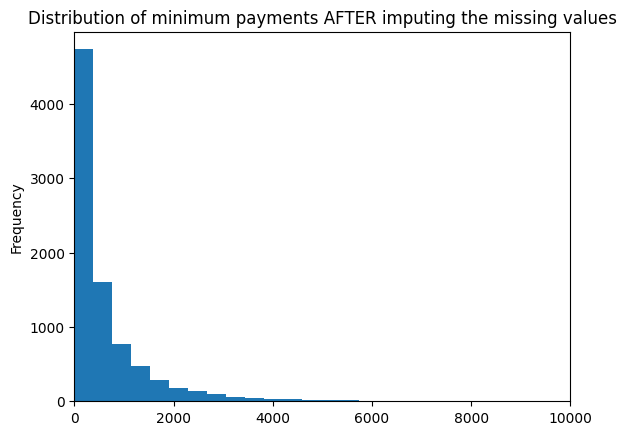

In [55]:
df['minimum_payments'].plot(kind='hist', bins=200)
plt.xlim(0, 10000)
plt.title('Distribution of minimum payments AFTER imputing the missing values')
plt.show()

Hence, the missing values have been imputed and the distribution has not changed

In [56]:
df.head()

,balance,balance_frequency,purchases,oneoff_purchases,installments_purchases,cash_advance,purchases_frequency,oneoff_purchases_frequency,purchases_installments_frequency,cash_advance_frequency,cash_advance_trx,purchases_trx,credit_limit,payments,minimum_payments,prc_full_payment,tenure
0,40.900749,0.818182,95.40,0.00,95.4,0.000000,0.166667,0.000000,0.083333,0.000000,0,2,1000.0,201.802084,139.509787,0.000000,12
1,3202.467416,0.909091,0.00,0.00,0.0,6442.945483,0.000000,0.000000,0.000000,0.250000,4,0,7000.0,4103.032597,1072.340217,0.222222,12
2,2495.148862,1.000000,773.17,773.17,0.0,0.000000,1.000000,1.000000,0.000000,0.000000,0,12,7500.0,622.066742,627.284787,0.000000,12
3,1666.670542,0.636364,1499.00,1499.00,0.0,205.788017,0.083333,0.083333,0.000000,0.083333,1,1,7500.0,0.000000,NaN,0.000000,12
4,817.714335,1.000000,16.00,16.00,0.0,0.000000,0.083333,0.083333,0.000000,0.000000,0,1,1200.0,678.334763,244.791237,0.000000,12


Transforming columns

Certain columns that are positively skewed and not in the range of 0-1 will be log transformed to reduce the effect from outliers.

In [57]:
cols_to_transform = ['balance', 'purchases', 'oneoff_purchases', 'installments_purchases', 'cash_advance', 'payments', 'minimum_payments', 'cash_advance_trx', 'purchases_trx']

In [58]:
for column in cols_to_transform:
  df[column] = np.log(df[column]+1) # Can be observed from descriptive statistics that alot of columns have a minimum value of 0.

The columns above have been log transformed

## Scaling data

In [59]:
scaler = StandardScaler()

In [60]:
scaled_data = scaler.fit_transform(imputed_df)

## PCA (Principal Component Analysis)

Finding the optimal number of componenets for PCA

In [61]:
for i in range(1, len(df.columns)+1):

  pca_model = PCA(n_components=i, random_state=13)
  pca_model.fit_transform(scaled_data)

  explained_variance_ratios = pca_model.explained_variance_ratio_

In [62]:
current_sum = 0
cumulative_sum = []
each_explained_variance = []

for value in explained_variance_ratios:
  each_explained_variance.append(value)
  current_sum += value
  cumulative_sum.append(current_sum)

In [63]:
cumulative_sum

[np.float64(0.27301039722536574),
 np.float64(0.47624499681528953),
 np.float64(0.5645453879647983),
 np.float64(0.6393799916860706),
 np.float64(0.701343953659535),
 np.float64(0.7587609116103086),
 np.float64(0.8075615846653423),
 np.float64(0.8507459213222983),
 np.float64(0.8885679098632983),
 np.float64(0.919367925976601),
 np.float64(0.9430910355680958),
 np.float64(0.9607886105500648),
 np.float64(0.9750358386778359),
 np.float64(0.987204015769683),
 np.float64(0.9973287366719983),
 np.float64(0.9999993147717028),
 np.float64(0.9999999999999999)]

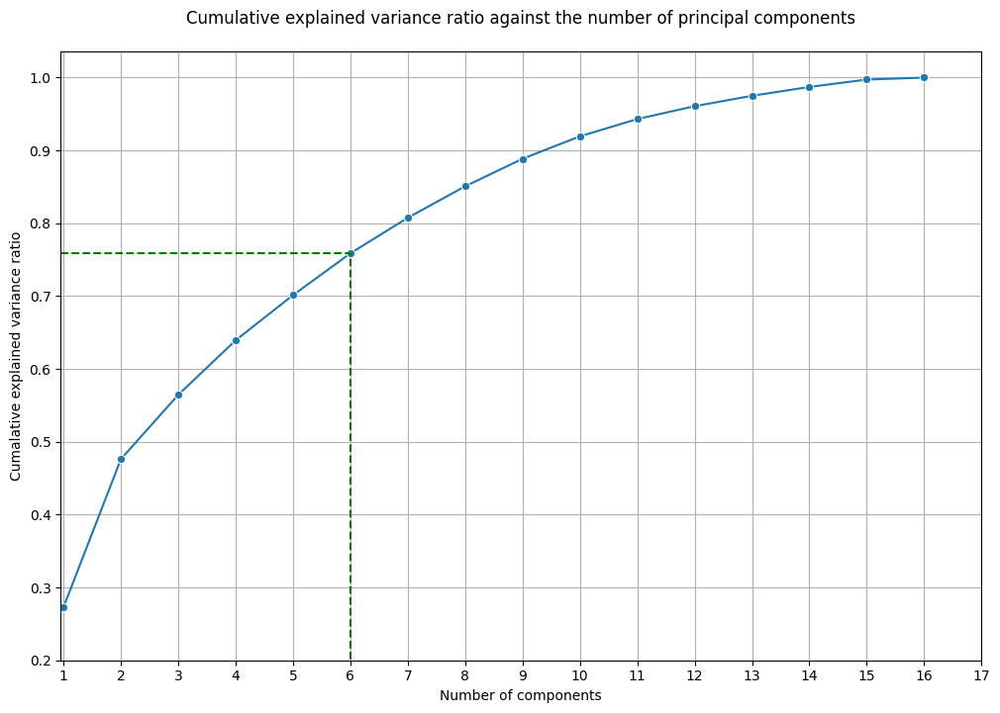

In [64]:
plt.figure(figsize=(12, 8))
sns.lineplot(x=range(1, 17), y=cumulative_sum[:16], marker='o')
plt.grid(True)
plt.xlabel('Number of components')
plt.ylabel('Cumalative explained variance ratio')
plt.title('Cumulative explained variance ratio against the number of principal components', pad=20)
plt.xticks(range(0, len(cumulative_sum) + 1, 1))
plt.xlim(0.95)
plt.ylim(0.2)

plt.plot([6,6], [0,cumulative_sum[5]], linestyle='dashed', color='green')
plt.plot([0,6], [cumulative_sum[5],cumulative_sum[5]], linestyle='dashed', color='green')

plt.show()

Can achieve 76% of the variance from 17 components using 6 pca components, which will be decided to be the optimal number

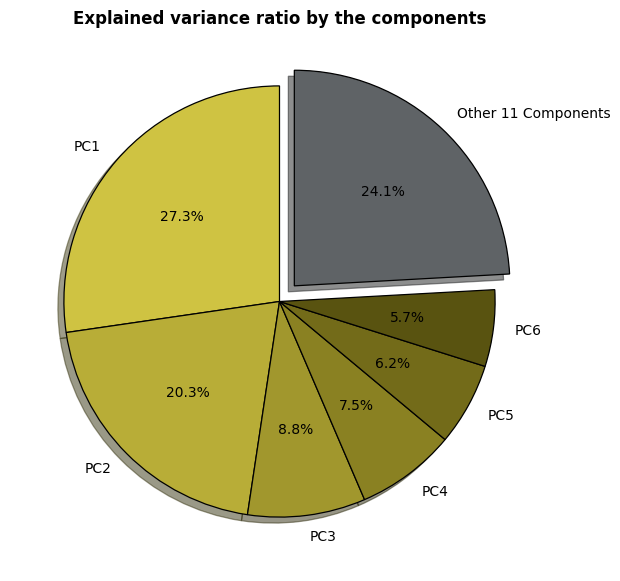

In [65]:
# A pie chart to represent the pca components usage on the explained variance

labels = ['PC1', 'PC2', 'PC3', 'PC4', 'PC5', 'PC6', 'Other 11 Components']
values = each_explained_variance[:6] + [sum(each_explained_variance[6:])]

explode=(0,0,0,0,0,0,0.1)

plt.figure(figsize=(7,7))

plt.pie(values,
        labels=labels,
        autopct='%1.1f%%',
        startangle=90,
        explode=explode,
        shadow=True,
        colors= ['#cfc342', '#b8ad37', '#a1972d', '#8a8122', '#736b19', '#595310', '#5f6366'],
        wedgeprops={'linewidth': 0.9, 'edgecolor': 'black'})

plt.title('Explained variance ratio by the components', fontweight='bold')

plt.show()

In [66]:
n_components = 6

In [67]:
pca_model = PCA(n_components=n_components)
pca_results = pca_model.fit_transform(scaled_data)

In [68]:
pca_results.shape

(8950, 6)

In [69]:
pca_columns=['PC1', 'PC2', 'PC3', 'PC4', 'PC5', 'PC6']

In [70]:
pca_results_df = pd.DataFrame(data=pca_results,
             columns=pca_columns)

Checking for the optimal number of k for KMeans (With PCA)

In [71]:
# Sum of squared errors
ssd = []
silhouette_scores_list = []

for k in range(2, 15):

  kmeans_model = KMeans(n_clusters=k)
  kmeans_model.fit(pca_results_df)

  ssd.append(kmeans_model.inertia_)
  labels = kmeans_model.labels_
  silhouette_scores_list.append(silhouette_score(pca_results_df, labels))

In [72]:
silhouette_scores_list

[np.float64(0.3027087343336503),
 np.float64(0.24141879014424564),
 np.float64(0.26509151549236526),
 np.float64(0.2574197208017132),
 np.float64(0.24835680349542447),
 np.float64(0.24884393712763792),
 np.float64(0.2394078540985589),
 np.float64(0.24366777726554661),
 np.float64(0.24173671851788636),
 np.float64(0.2657480691442725),
 np.float64(0.25112417447312196),
 np.float64(0.25397735280523553),
 np.float64(0.23660834619629117)]

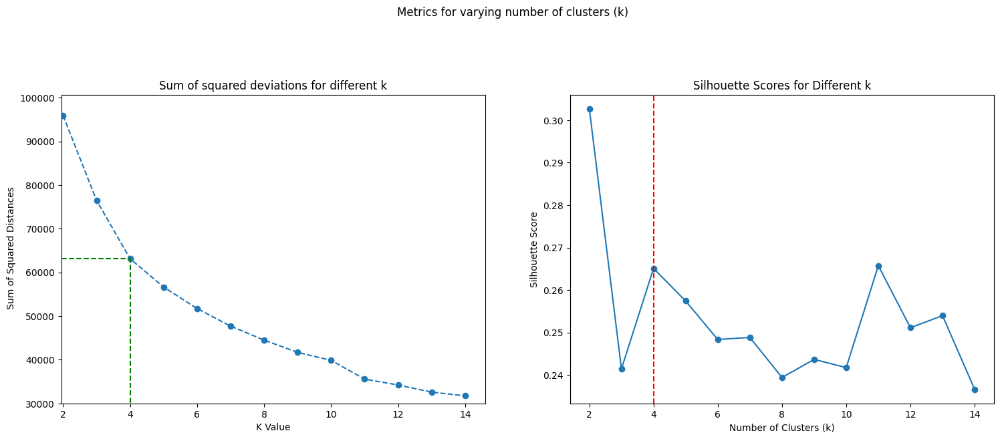

In [73]:
plt.figure(figsize=(18, 6))
k = range(2, 15)

plt.subplot(1, 2, 1)
plt.plot(k,ssd,'o--')
plt.xlabel("K Value")
plt.title('Sum of squared deviations for different k')
plt.ylabel(" Sum of Squared Distances")

plt.plot([4,4], [0, ssd[2]], linestyle='dashed', color='green')
plt.plot([1.95, 4], [ssd[2], ssd[2]], linestyle='dashed', color='green')
plt.xlim(1.95)
plt.ylim(30000)

plt.subplot(1, 2, 2)
plt.plot(k, silhouette_scores_list, marker='o', linestyle='-')
plt.xlabel("Number of Clusters (k)")
plt.ylabel("Silhouette Score")
plt.title("Silhouette Scores for Different k")

plt.axvline(4, color='red', linestyle='--')

plt.suptitle('Metrics for varying number of clusters (k)', y=1.1)

plt.show()

Looking at the elbow plot the number of clusters will be decided to be set at k=4.

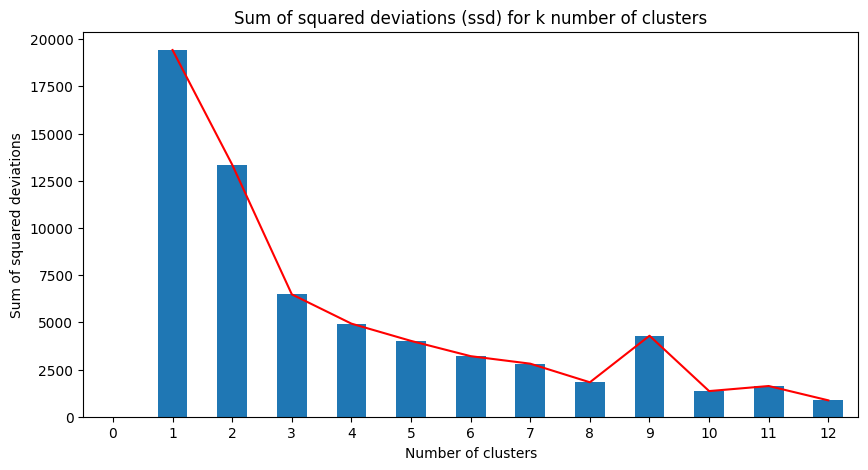

In [74]:
plt.figure(figsize=(10, 5))
np.abs(pd.Series(ssd).diff()).plot(kind='bar')
np.abs(pd.Series(ssd).diff()).plot(kind='line', color='red')
plt.ylabel('Sum of squared deviations')
plt.xlabel('Number of clusters')
plt.xticks(rotation=0)
plt.title('Sum of squared deviations (ssd) for k number of clusters')
plt.show()

## Model (KMeans with n_clusters=4)

In [75]:
model = KMeans(n_clusters=4, random_state=13)
model.fit(pca_results_df)

KMeans(n_clusters=4, random_state=13)

In [76]:
preds = model.predict(pca_results_df)

In [77]:
pca_results_df['cluster_labels'] = model.labels_ + 1

In [78]:
pca_results_df['cluster_labels'] = pca_results_df['cluster_labels'].astype(str)

colors = {
    '1' : 'black',
    '2' : 'blue',
    '3' : '#32CD32',
    '4' : 'gray'
}

<Figure size 1800x1200 with 0 Axes>

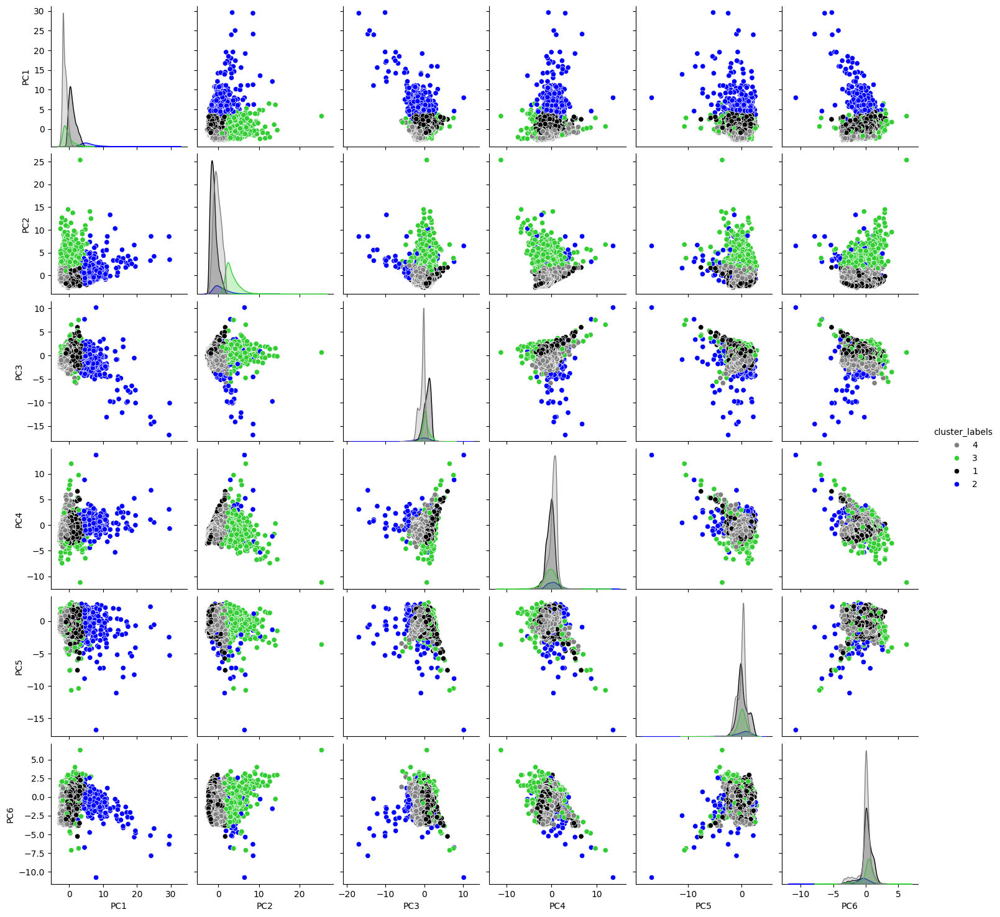

In [79]:
plt.figure(figsize=(18, 12))

sns.pairplot(data=pca_results_df,
             hue='cluster_labels',
             palette=colors)
plt.show()

Visulazing a 2D scatterplot of the clusters for the top 2 PCA components

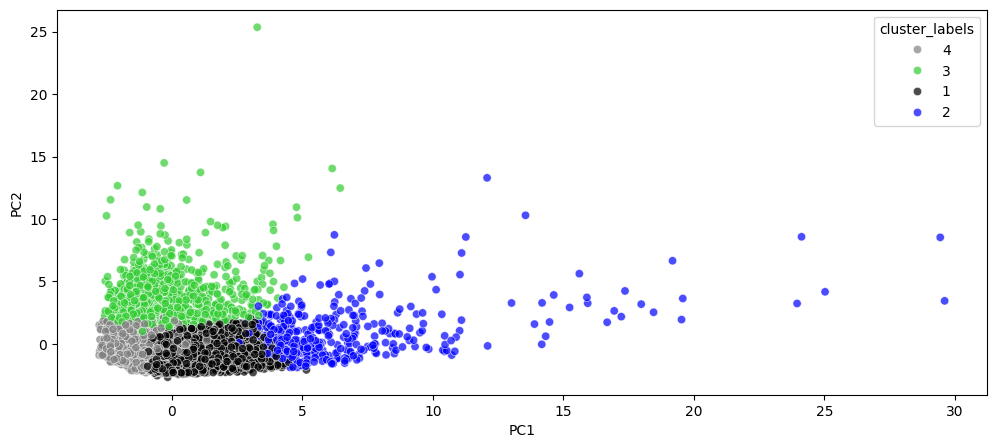

In [80]:
plt.figure(figsize=(12, 5))
sns.scatterplot(data=pca_results_df, x='PC1', y='PC2', hue='cluster_labels', palette=colors, alpha=0.7)
plt.show()

Visulazing a 3D scatterplot of the clusters for the top 3 PCA components

In [81]:
df_original['cluster_labels'] = model.labels_ + 1
df_original['cluster_labels'] = df_original['cluster_labels'].astype(str)

In [82]:
scatterplot_3d = px.scatter_3d(
    pca_results_df,
    x='PC1',
    y='PC2',
    z='PC3',
    color='cluster_labels',
    color_discrete_map=colors,
    title='3D Scatterplot of the Clusters for the Top 3 PCA Components'
)

scatterplot_3d.update_traces(
    marker=dict(
        size=5,
        symbol='circle',
        line=dict(width=1)
    )
)

scatterplot_3d.update_layout(
    autosize=True,
    width=1400,
    height=800,
    title_x = 0.5,
    margin=dict(l=0, r=0, t=50, b=0)
)

scatterplot_3d.show()

In [83]:
hover_data=['country', 'internet_users']

In [84]:
labels = model.labels_
pd.Series(labels).value_counts()

,count
3,4029
0,3273
2,1226
1,422


In [85]:
df.columns

Index(['balance', 'balance_frequency', 'purchases', 'oneoff_purchases',
       'installments_purchases', 'cash_advance', 'purchases_frequency',
       'oneoff_purchases_frequency', 'purchases_installments_frequency',
       'cash_advance_frequency', 'cash_advance_trx', 'purchases_trx',
       'credit_limit', 'payments', 'minimum_payments', 'prc_full_payment',
       'tenure'],
      dtype='object')

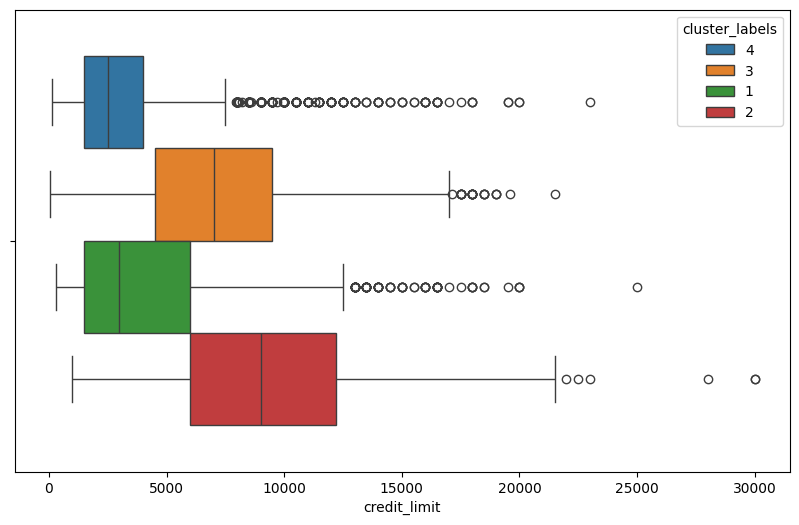

In [86]:
plt.figure(figsize=(10, 6))
sns.boxplot(data=df_original,
             x='credit_limit',
             hue='cluster_labels')
plt.show()

In [87]:
df_original.drop(['cust_id', 'limit_freq_category',
       'credit_utilization_ratio', 'late_payments',
       'cash_advance_to_credit_limit_ratio'], axis=1)

,balance,balance_frequency,purchases,oneoff_purchases,installments_purchases,cash_advance,purchases_frequency,oneoff_purchases_frequency,purchases_installments_frequency,cash_advance_frequency,cash_advance_trx,purchases_trx,credit_limit,payments,minimum_payments,prc_full_payment,tenure,cluster_labels
0,40.900749,0.818182,95.40,0.00,95.40,0.000000,0.166667,0.000000,0.083333,0.000000,0,2,1000.0,201.802084,139.509787,0.000000,12,4
1,3202.467416,0.909091,0.00,0.00,0.00,6442.945483,0.000000,0.000000,0.000000,0.250000,4,0,7000.0,4103.032597,1072.340217,0.222222,12,3
2,2495.148862,1.000000,773.17,773.17,0.00,0.000000,1.000000,1.000000,0.000000,0.000000,0,12,7500.0,622.066742,627.284787,0.000000,12,1
3,1666.670542,0.636364,1499.00,1499.00,0.00,205.788017,0.083333,0.083333,0.000000,0.083333,1,1,7500.0,0.000000,NaN,0.000000,12,4
4,817.714335,1.000000,16.00,16.00,0.00,0.000000,0.083333,0.083333,0.000000,0.000000,0,1,1200.0,678.334763,244.791237,0.000000,12,4
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
8945,28.493517,1.000000,291.12,0.00,291.12,0.000000,1.000000,0.000000,0.833333,0.000000,0,6,1000.0,325.594462,48.886365,0.500000,6,1
8946,19.183215,1.000000,300.00,0.00,300.00,0.000000,1.000000,0.000000,0.833333,0.000000,0,6,1000.0,275.861322,NaN,0.000000,6,1
8947,23.398673,0.833333,144.40,0.00,144.40,0.000000,0.833333,0.000000,0.666667,0.000000,0,5,1000.0,81.270775,82.418369,0.250000,6,1
8948,13.457564,0.833333,0.00,0.00,0.00,36.558778,0.000000,0.000000,0.000000,0.166667,2,0,500.0,52.549959,55.755628,0.250000,6,4


In [88]:
df_original = df_original.drop(['cust_id', 'limit_freq_category',
       'credit_utilization_ratio', 'late_payments',
       'cash_advance_to_credit_limit_ratio'], axis=1)

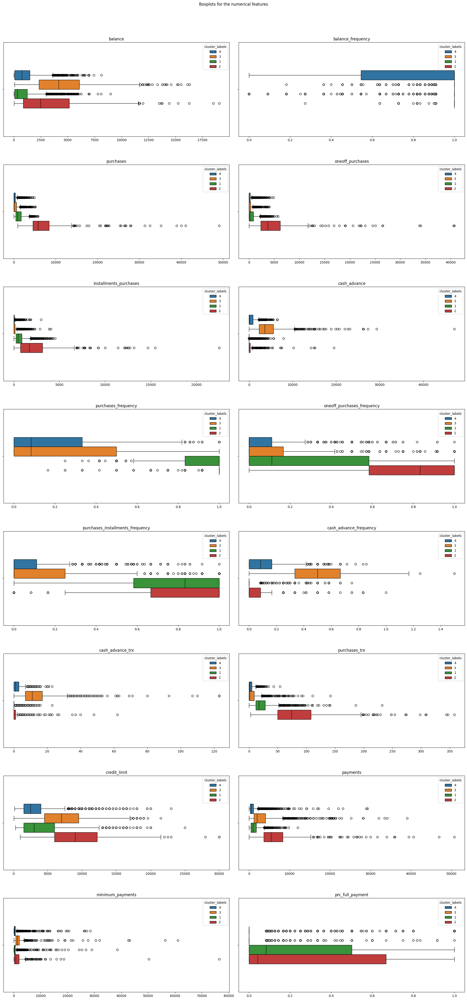

In [89]:
plt.figure(figsize=(20,50))

for i in range(len(df_original.columns)-2):
  axes = plt.subplot(9, 2, i+1)
  sns.boxplot(data=df_original, x=df_original.columns[i], linecolor='black', width=0.4, hue='cluster_labels')
  plt.xlabel('')
  plt.ylabel('')
  plt.title(df_original.columns[i])

plt.suptitle('Boxplots for the numerical features')
plt.tight_layout(rect=[0, 0.03, 1, 0.96])
plt.subplots_adjust(hspace=0.3)

In [90]:
df_original['cluster_labels'] = model.labels_ + 1

## Understanding the clusters

### Cluster profiling

In [91]:
cluster_profile_df = df_original.groupby('cluster_labels').describe().transpose()

In [92]:
cluster_profile_df[cluster_profile_df.index.get_level_values(1) == 'mean'].style.background_gradient(cmap='BuPu', axis=1)


,cluster_labels,1,2,3,4
balance,mean,892.832791,3532.141485,4512.579181,1006.905485
balance_frequency,mean,0.940730,0.985436,0.968393,0.786661
purchases,mean,1236.290684,7609.855664,476.479307,282.149697
oneoff_purchases,mean,580.526098,5106.647464,299.400832,218.461628
installments_purchases,mean,656.046676,2504.630000,177.161403,63.951579
cash_advance,mean,209.516159,691.341086,4477.685023,569.313053
purchases_frequency,mean,0.890692,0.945225,0.280309,0.181400
oneoff_purchases_frequency,mean,0.297179,0.742647,0.134747,0.089534
purchases_installments_frequency,mean,0.719847,0.781161,0.180355,0.088084
cash_advance_frequency,mean,0.042699,0.073241,0.483394,0.110757


# Conclusions via Observations



*   ***Cluster 1:*** - Frequent customers, mostly through installments, maintain a low balance and tends to pay the full amount at most times.

*   ***Cluster 2:*** - High spenders, frequent oneoff purchases, most number of transactions, highest credit limit and tends to pay the full amount.

*   ***Cluster 3:*** - High Cash Advances but Low spending customers, Makes few purchases, owes the bank high amounts, low full payment percentage.

*   ***Cluster 4:*** - Less frequent and Low Credit users, cluster containing almost the lowest values amongst all rows or columns.





------------------------------------------------------------------------------------------------------THE END----------------------------------------------------------------------------------------

# 02. Supervised Learning - Regression 

# Medical Cost Personal Datasets


https://www.kaggle.com/datasets/mirichoi0218/insurance

Importing the necessary libraries

In [ ]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
from sklearn.impute import SimpleImputer, KNNImputer
from sklearn.model_selection import train_test_split, GridSearchCV
from scipy import stats
from sklearn.pipeline import Pipeline
from sklearn.compose import ColumnTransformer
from sklearn.preprocessing import OneHotEncoder, StandardScaler, TargetEncoder
from sklearn.preprocessing import PowerTransformer
from sklearn.linear_model import LinearRegression, Ridge, Lasso
from sklearn.tree import DecisionTreeRegressor
from sklearn.ensemble import RandomForestRegressor, GradientBoostingRegressor
from xgboost import XGBRegressor
from sklearn.neighbors import KNeighborsRegressor
from sklearn.metrics import mean_absolute_error, root_mean_squared_error, r2_score, mean_squared_error
from IPython.display import Image

In [ ]:
df = pd.read_csv(r"D:\User\University\Year 3\Machine Learning\Coursework\Supervised learning\Regression\archive\insurance.csv")
pd.set_option('display.max_columns', None)
df.head()

,age,sex,bmi,children,smoker,region,charges
0,19,female,27.900,0,yes,southwest,16884.92400
1,18,male,33.770,1,no,southeast,1725.55230
2,28,male,33.000,3,no,southeast,4449.46200
3,33,male,22.705,0,no,northwest,21984.47061
4,32,male,28.880,0,no,northwest,3866.85520


In [3]:
# column names
df.columns

Index(['age', 'sex', 'bmi', 'children', 'smoker', 'region', 'charges'], dtype='object')

In [4]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 1338 entries, 0 to 1337
Data columns (total 7 columns):
 #   Column    Non-Null Count  Dtype  
---  ------    --------------  -----  
 0   age       1338 non-null   int64  
 1   sex       1338 non-null   object 
 2   bmi       1338 non-null   float64
 3   children  1338 non-null   int64  
 4   smoker    1338 non-null   object 
 5   region    1338 non-null   object 
 6   charges   1338 non-null   float64
dtypes: float64(2), int64(2), object(3)
memory usage: 73.3+ KB


In [5]:
df.describe().transpose()

,count,mean,std,min,25%,50%,75%,max
age,1338.0,39.207025,14.049960,18.0000,27.00000,39.000,51.000000,64.00000
bmi,1338.0,30.663397,6.098187,15.9600,26.29625,30.400,34.693750,53.13000
children,1338.0,1.094918,1.205493,0.0000,0.00000,1.000,2.000000,5.00000
charges,1338.0,13270.422265,12110.011237,1121.8739,4740.28715,9382.033,16639.912515,63770.42801


In [6]:
df.describe(include=['O'])

,sex,smoker,region
count,1338,1338,1338
unique,2,2,4
top,male,no,southeast
freq,676,1064,364


In [7]:
# checking for any null values

df.isnull().sum()

,0
age,0
sex,0
bmi,0
children,0
smoker,0
region,0
charges,0


In [8]:
# Checking for any duplicated rows
print(f" The number of duplicated rows: {sum(df.duplicated())}")

 The number of duplicated rows: 1


In [9]:
df[df.duplicated()]

,age,sex,bmi,children,smoker,region,charges
581,19,male,30.59,0,no,northwest,1639.5631


In [10]:
df[df['charges'] == 1639.5631]

,age,sex,bmi,children,smoker,region,charges
195,19,male,30.59,0,no,northwest,1639.5631
581,19,male,30.59,0,no,northwest,1639.5631


One of the rows will be removed

In [11]:
df = df.drop(index=[195])
# Rechecking for any duplicates to confirm
sum(df.duplicated())

0

There are no duplicated rows

## EDA (Exploratory Data Analysis)

In [12]:
pd.set_option('display.max_columns', None)
df.head()

,age,sex,bmi,children,smoker,region,charges
0,19,female,27.900,0,yes,southwest,16884.92400
1,18,male,33.770,1,no,southeast,1725.55230
2,28,male,33.000,3,no,southeast,4449.46200
3,33,male,22.705,0,no,northwest,21984.47061
4,32,male,28.880,0,no,northwest,3866.85520


<Figure size 1000x1000 with 0 Axes>

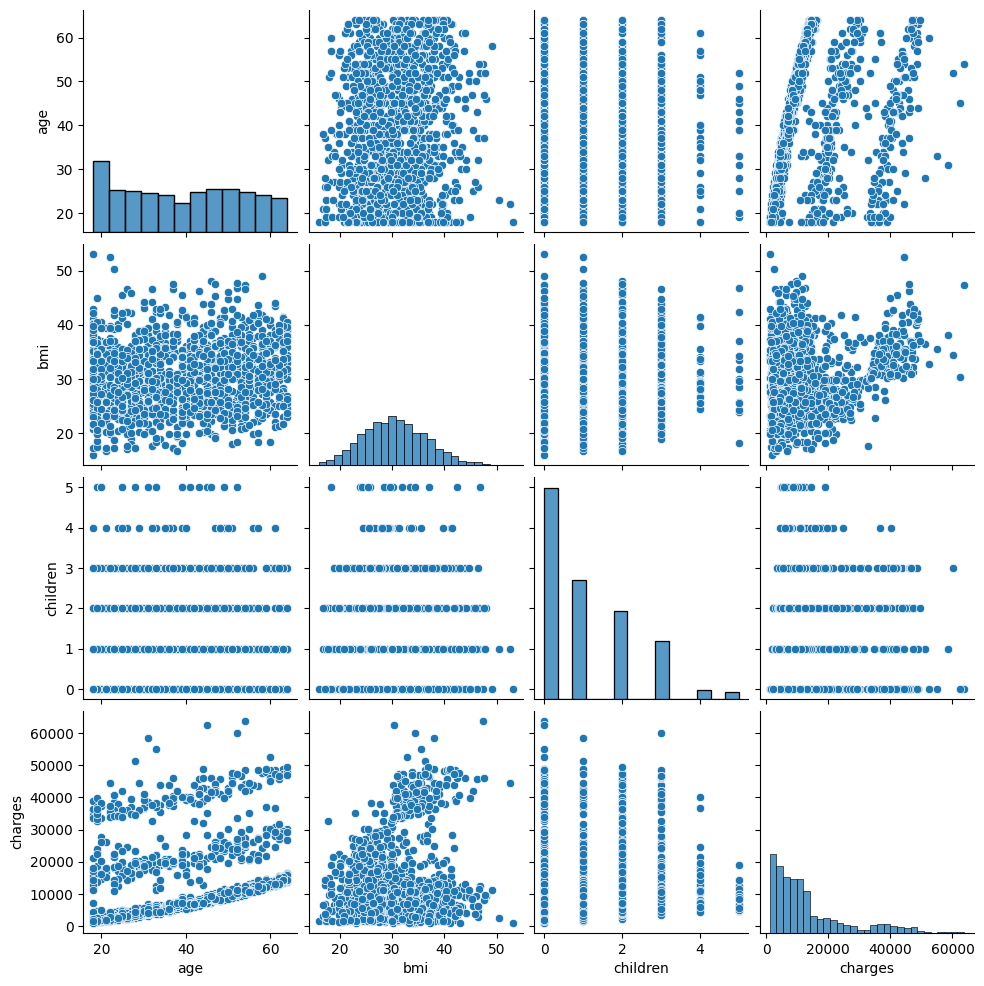

In [13]:
plt.figure(figsize=(10, 10))
sns.pairplot(data=df)
plt.show()

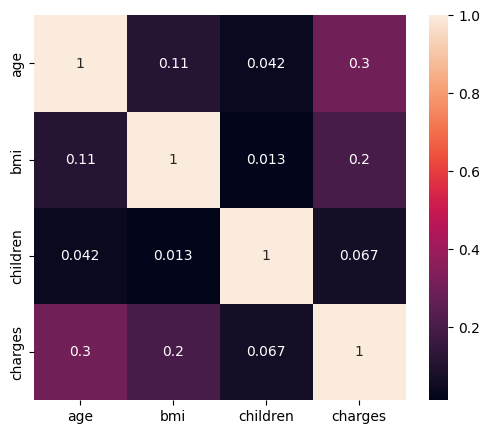

In [14]:
plt.figure(figsize=(6, 5))
sns.heatmap(data = df.corr(numeric_only=True), annot=True);

In [15]:
df['sex'].value_counts()

,count
sex,
male,675
female,662


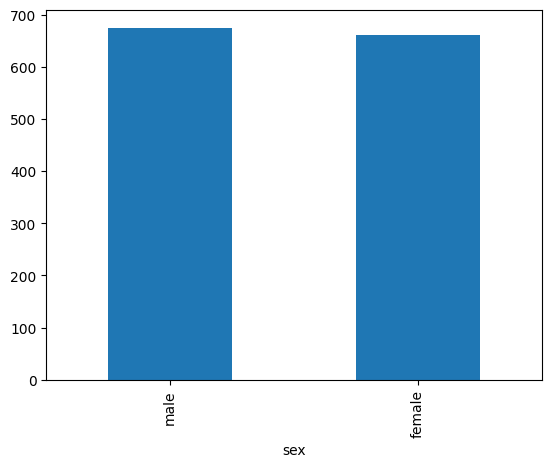

In [16]:
df['sex'].value_counts().plot(kind='bar');

The male to female ratio in this dataset is balanced overall.

In [17]:
df['region'].value_counts()

,count
region,
southeast,364
southwest,325
northwest,324
northeast,324


In [18]:
# Number of people that do smoke filtered by region
df[df['smoker']=='yes']['region'].value_counts()

,count
region,
southeast,91
northeast,67
southwest,58
northwest,58


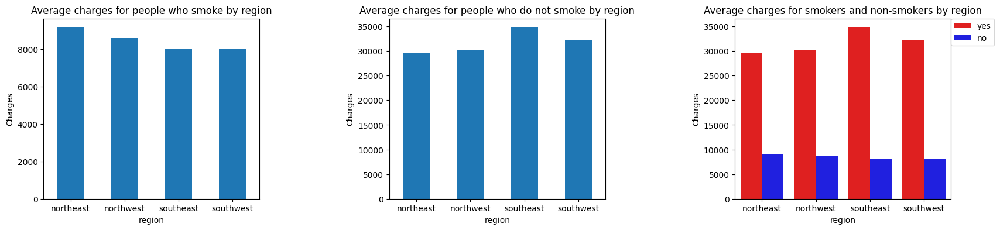

In [19]:
plt.figure(figsize=(20, 4))

smokers_df = df[df['smoker'] == 'yes']
non_smokers_df = df[df['smoker'] == 'no']

smokers_mean_charges_df = df[df['smoker'] == 'yes'].groupby('region')['charges'].mean().reset_index()
non_smokers_mean_charges_df = df[df['smoker'] == 'no'].groupby('region')['charges'].mean().reset_index()

smokers_mean_charges_df['smoker'] = 'yes'
non_smokers_mean_charges_df['smoker'] = 'no'
mean_charges_df = pd.concat([smokers_mean_charges_df, non_smokers_mean_charges_df])

plt.subplot(1, 3, 1)
non_smokers_df.groupby('region')['charges'].mean().plot(kind='bar')
plt.title('Average charges for people who smoke by region')
plt.ylabel('Charges')
plt.xticks(rotation=0)


plt.subplot(1, 3, 2)
smokers_df.groupby('region')['charges'].mean().plot(kind='bar')
plt.title('Average charges for people who do not smoke by region')
plt.ylabel('Charges')
plt.xticks(rotation=0)

plt.subplot(1, 3, 3)
sns.barplot(data=mean_charges_df, x='region', y='charges', hue='smoker', palette=['red', 'blue'])
plt.title('Average charges for smokers and non-smokers by region')
plt.ylabel('Charges')
plt.legend(loc=[1,0.85])

plt.subplots_adjust(wspace=0.6)
plt.show()

In [20]:
smokers_mean_charges_df['charges'].max()

34844.996823626374

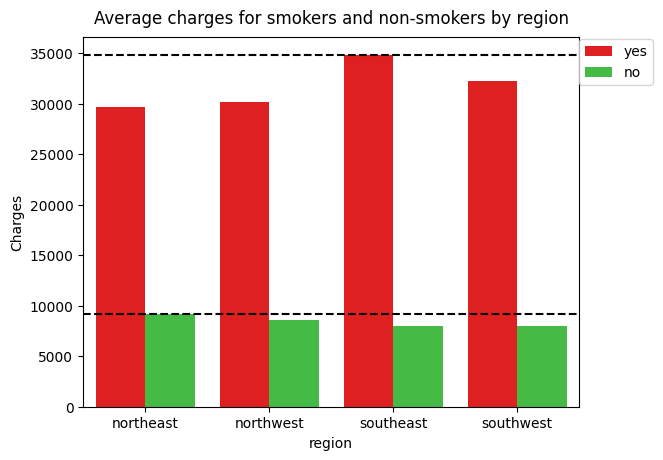

In [21]:
sns.barplot(data=mean_charges_df, x='region', y='charges', hue='smoker', palette=['red', 'limegreen'])
plt.title('Average charges for smokers and non-smokers by region', pad=10)
plt.ylabel('Charges')
plt.legend(loc=[1,0.87])

# To indicate the heights
plt.axhline(y=smokers_mean_charges_df['charges'].max(), color='black', linestyle='--')
plt.axhline(y=non_smokers_mean_charges_df['charges'].max(), color='black', linestyle='--')


plt.show()

In [22]:
print(f"Charges incurred by the smokers to non_smokers ratio: {smokers_df['charges'].mean() / non_smokers_df['charges'].mean():.2f}")

Charges incurred by the smokers to non_smokers ratio: 3.80


In [23]:
 # Counts of the regions

 total_by_region = df['region'].value_counts()
 total_by_region

,count
region,
southeast,364
southwest,325
northwest,324
northeast,324


In [24]:
# Number of people that smoke, filtered by region
count_of_smokers = df[df['smoker']=='yes']['region'].value_counts()
count_of_smokers

,count
region,
southeast,91
northeast,67
southwest,58
northwest,58


In [25]:
(count_of_smokers/total_by_region)*100

,count
region,
northeast,20.679012
northwest,17.901235
southeast,25.000000
southwest,17.846154


Observation: Similar number of people from all regions.

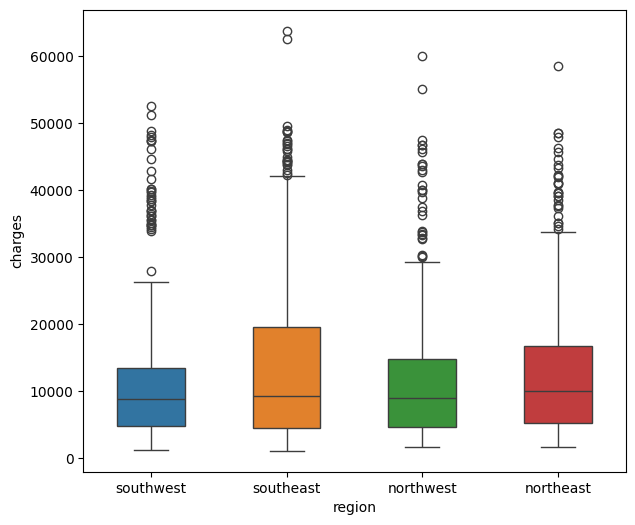

In [26]:
plt.figure(figsize=(7, 6))
sns.boxplot(data=df,
            y='charges',
            x='region',
            hue='region',
            width=0.5)

plt.show()

Observation: Median Charges are almost the same when filtered by region.

***It could be concluded that region does not have a significant effect on charges by looking at the boxplots and the previous scatter plots. ***

In [27]:
df['children'].value_counts()

,count
children,
0,573
1,324
2,240
3,157
4,25
5,18


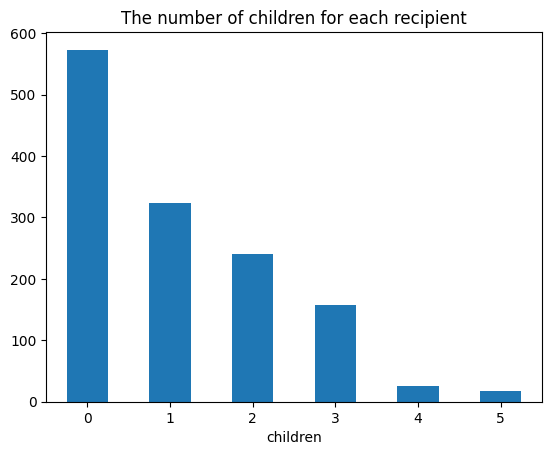

In [28]:
df['children'].value_counts().plot(kind='bar')
plt.title('The number of children for each recipient')
plt.xticks(rotation=0)
plt.show()

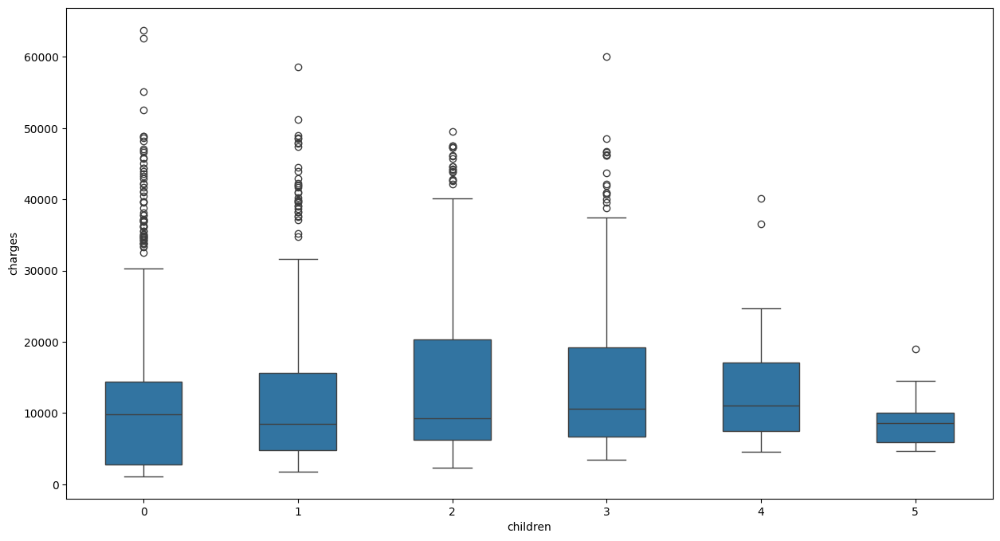

In [29]:
plt.figure(figsize=(15, 8))
sns.boxplot(data=df,
            y='charges',
            x='children',
            width=0.5)

plt.show()

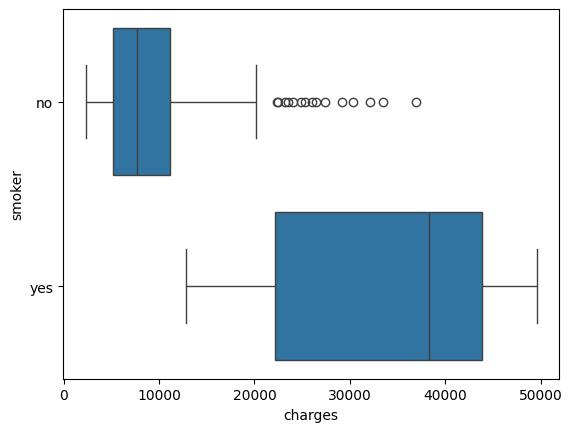

In [30]:
sns.boxplot(data=df[df['children'] == 2],
            x='charges',
            y='smoker')
plt.show()

In [31]:
df['bmi'].describe()

,bmi
count,1337.000000
mean,30.663452
std,6.100468
min,15.960000
25%,26.290000
50%,30.400000
75%,34.700000
max,53.130000


In [32]:
df.head()

,age,sex,bmi,children,smoker,region,charges
0,19,female,27.900,0,yes,southwest,16884.92400
1,18,male,33.770,1,no,southeast,1725.55230
2,28,male,33.000,3,no,southeast,4449.46200
3,33,male,22.705,0,no,northwest,21984.47061
4,32,male,28.880,0,no,northwest,3866.85520


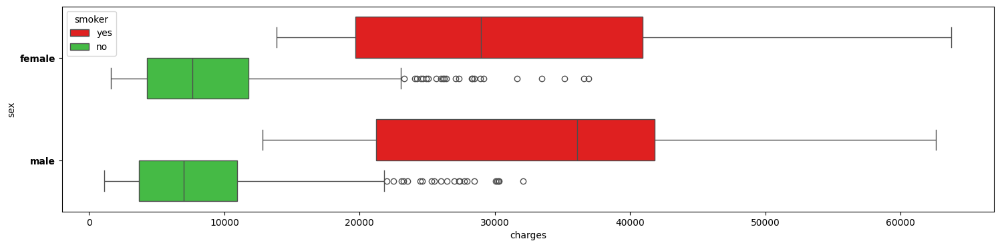

In [33]:
plt.figure(figsize=(18, 4))
sns.boxplot(data=df,
         y='sex',
         x='charges',
            hue='smoker',
            palette=['red', 'limegreen'])
plt.yticks(fontweight='bold')
plt.show()

In [34]:
df[df['sex'] == 'female']['charges'].describe()

,charges
count,662.000000
mean,12569.578844
std,11128.703801
min,1607.510100
25%,4885.158700
50%,9412.962500
75%,14454.691825
max,63770.428010


In [35]:
df[df['sex'] == 'male']['charges'].describe()

,charges
count,675.000000
mean,13974.998864
std,12971.958663
min,1121.873900
25%,4654.022675
50%,9377.904700
75%,19006.685500
max,62592.873090


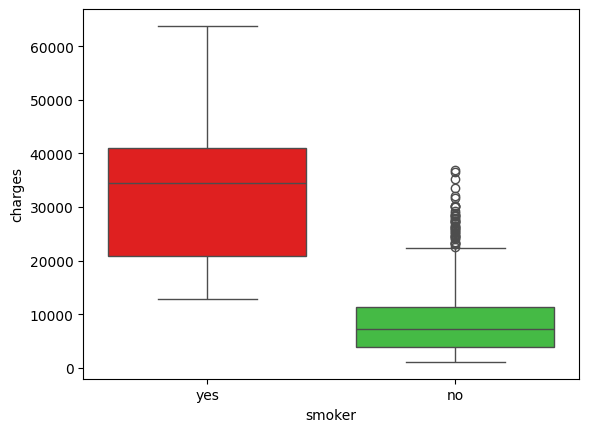

In [36]:
sns.boxplot(data=df,
            y = 'charges',
            x = 'smoker',
            hue='smoker',
            palette={'yes' : 'red',
                     'no' : 'limegreen'})
plt.show()

In [37]:
df['smoker'].value_counts()

,count
smoker,
no,1063
yes,274


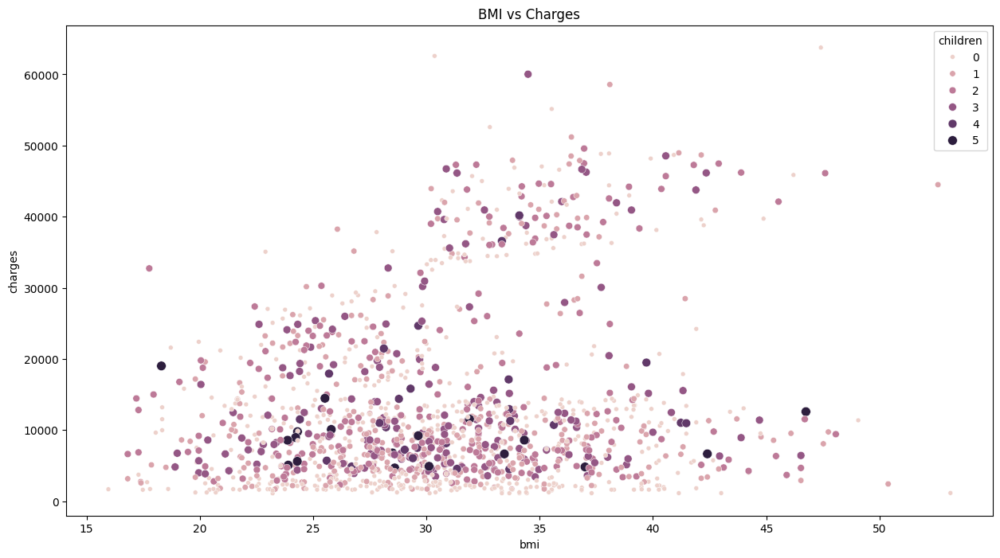

In [38]:
plt.figure(figsize=(15, 8))
sns.scatterplot(data=df,
                x='bmi',
                y='charges',
                size='children',
                hue='children')
plt.title('BMI vs Charges')
plt.show()

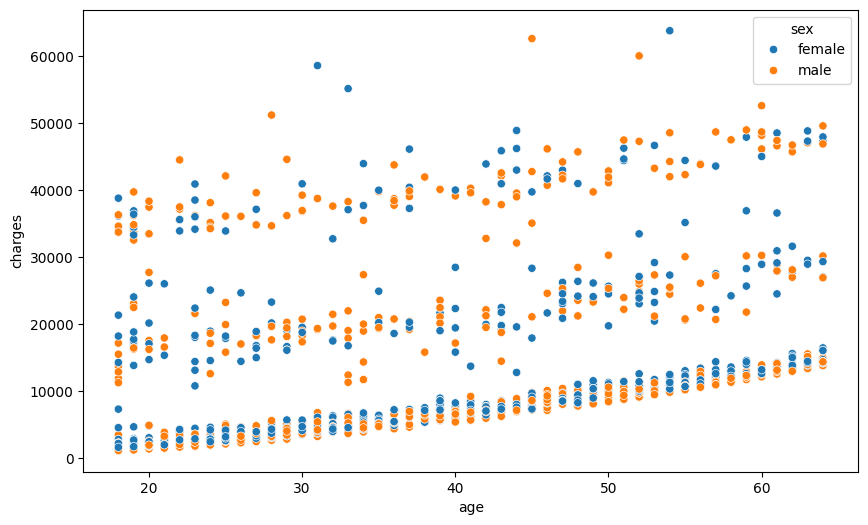

In [39]:
plt.figure(figsize=(10,6))
sns.scatterplot(data=df,
                y='charges',
                x='age',
                hue='sex')
plt.show()

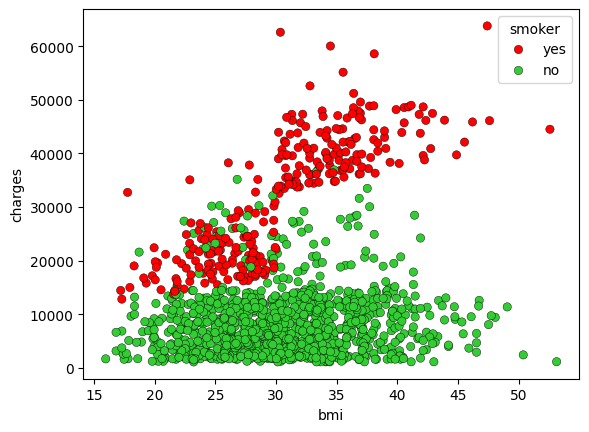

In [40]:
sns.scatterplot(data=df,
                x='bmi',
                y='charges',
                hue='smoker',
                palette=['red', 'limegreen'],
                edgecolor='black',
                linewidth=0.3)
plt.show()

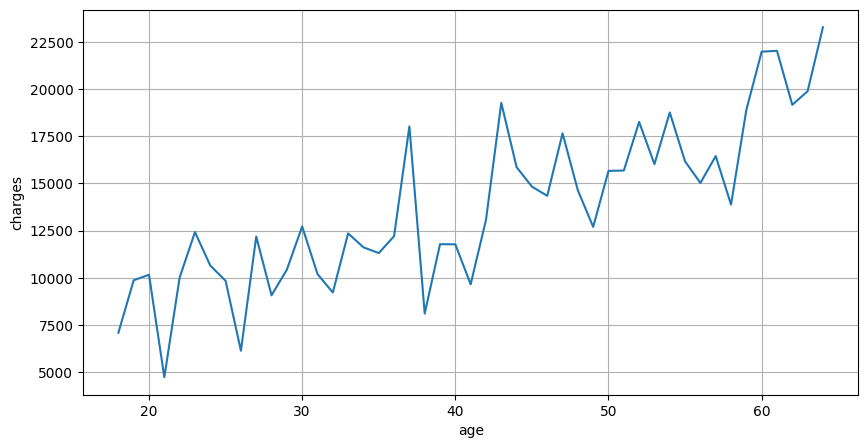

In [41]:
plt.figure(figsize=(10, 5))
sns.lineplot(data=df,
             x='age',
             y='charges',
             errorbar=None)
plt.grid(True)

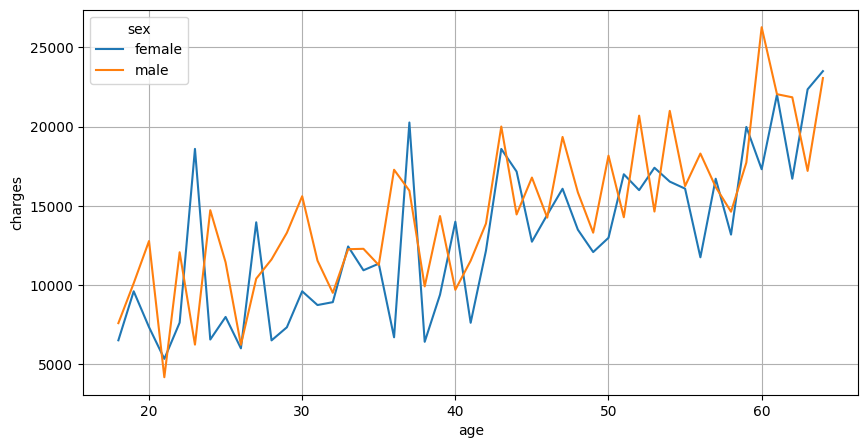

In [42]:
plt.figure(figsize=(10, 5))
sns.lineplot(data=df,
             x='age',
             y='charges',
             hue='sex',
             errorbar=None)

plt.grid(True)
plt.show()

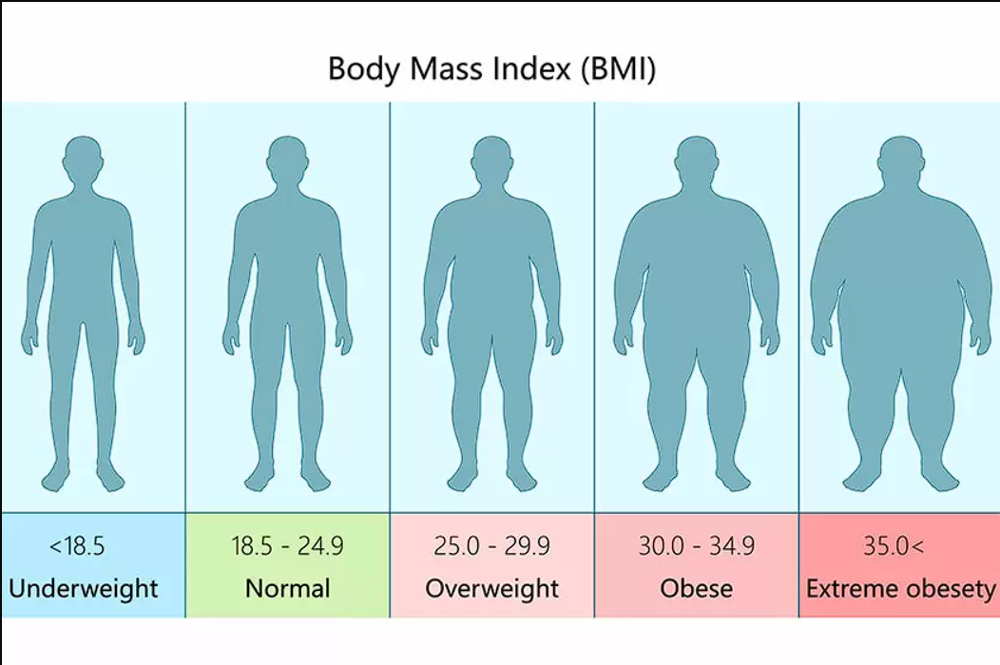

In [43]:
Image(filename='/content/BMI category picture.png')

In [44]:
df['bmi_category'] = 'Underweight'
df.loc[(df['bmi'] >= 18.5) & (df['bmi'] < 25), 'bmi_category'] = 'Normal'
df.loc[(df['bmi'] >= 25.0) & (df['bmi'] < 30), 'bmi_category'] = 'Overweight'
df.loc[(df['bmi'] >= 30.0) & (df['bmi'] < 35), 'bmi_category'] = 'Obese'
df.loc[df['bmi'] >= 35, 'bmi_category'] = 'Extreme Obesity'

In [45]:
df['bmi_category'].value_counts()

,count
bmi_category,
Obese,390
Overweight,386
Extreme Obesity,316
Normal,225
Underweight,20


In [46]:
df.columns

Index(['age', 'sex', 'bmi', 'children', 'smoker', 'region', 'charges',
       'bmi_category'],
      dtype='object')

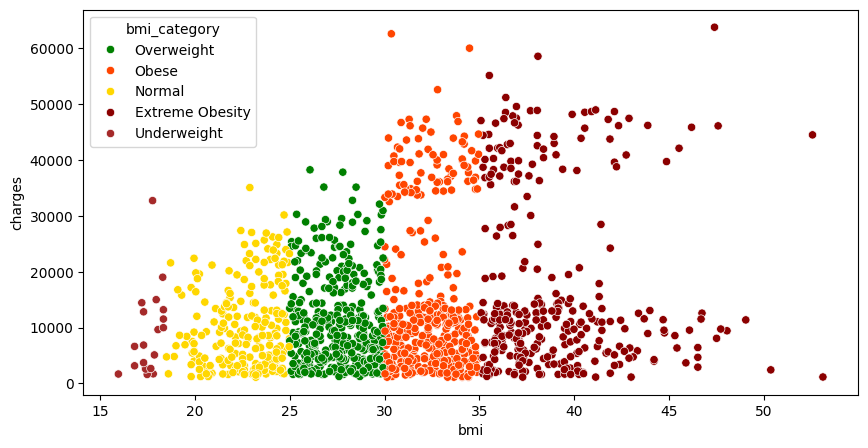

In [47]:
colors = {
    'Underweight': 'brown',
    'Normal': 'gold',
    'Overweight': 'green',
    'Obese': 'orangered',
    'Extreme Obesity': 'darkred'}

plt.figure(figsize=(10, 5))
sns.scatterplot(data=df,
                x='bmi',
                y='charges',
                hue='bmi_category',
                palette=colors)
plt.show()

In [48]:
df.columns

Index(['age', 'sex', 'bmi', 'children', 'smoker', 'region', 'charges',
       'bmi_category'],
      dtype='object')

<Axes: xlabel='bmi_category'>

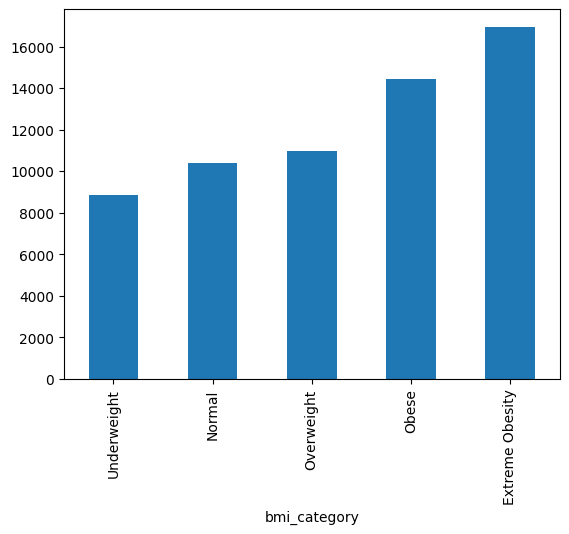

In [49]:
df.groupby('bmi_category')['charges'].mean().sort_values().plot(kind='bar')

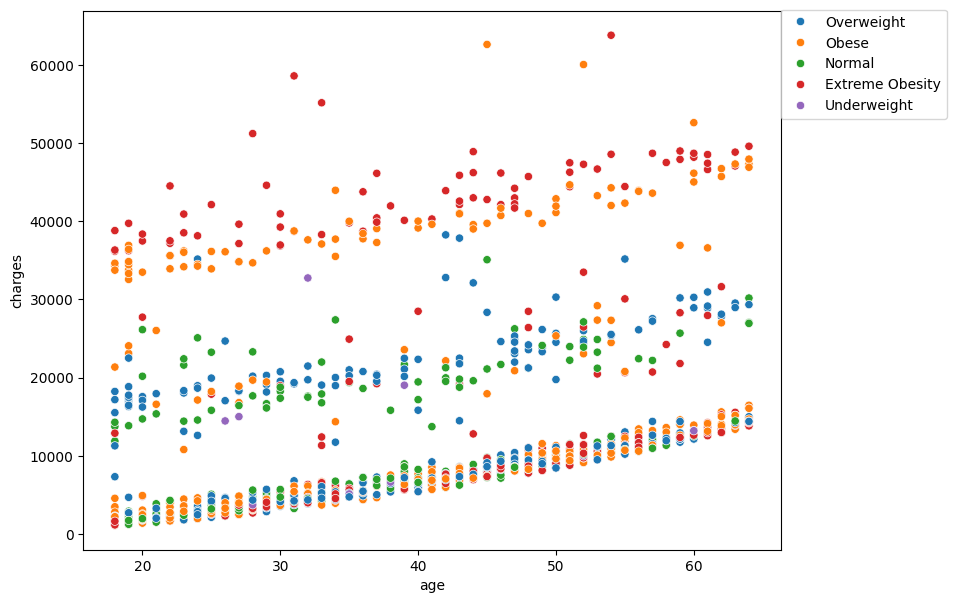

In [50]:
plt.figure(figsize=(9, 7))
sns.scatterplot(data=df,
            x='age',
             y='charges',
             hue='bmi_category')
plt.legend(loc=[1, 0.8])
plt.show()

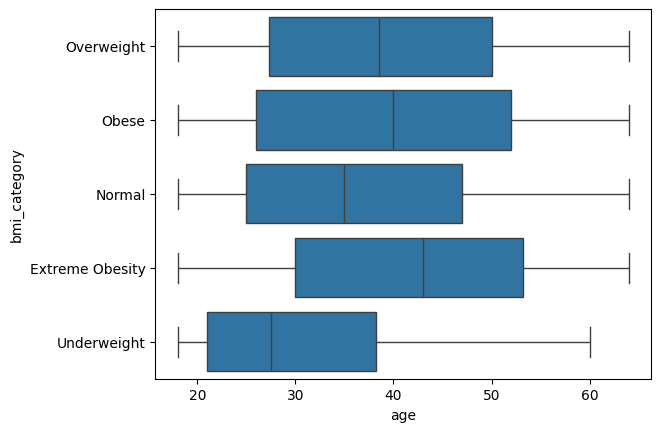

In [51]:
sns.boxplot(data=df,
             x='age',
             y='bmi_category')
plt.show()

In [52]:
df.columns

Index(['age', 'sex', 'bmi', 'children', 'smoker', 'region', 'charges',
       'bmi_category'],
      dtype='object')

In [53]:
import plotly.express as px

In [54]:
scatterplot_3d = px.scatter_3d(
    df,
    x='age',
    y='bmi',
    z='charges',
    color='smoker',
    # color_discrete_map=colors,
    title='3D Scatterplot of the Clusters for the Top 3 PCA Components'
)

scatterplot_3d.update_traces(
    marker=dict(
        size=5,
        symbol='circle',
        line=dict(width=1)
    )
)

scatterplot_3d.update_layout(
    autosize=True,
    width=1400,
    height=800,
    title_x = 0.5,
    margin=dict(l=0, r=0, t=50, b=0)
)

scatterplot_3d.show()

In [55]:
numerical_cols = ['bmi', 'charges', 'age']
categorical_cols = ['sex', 'smoker', 'region', 'children']

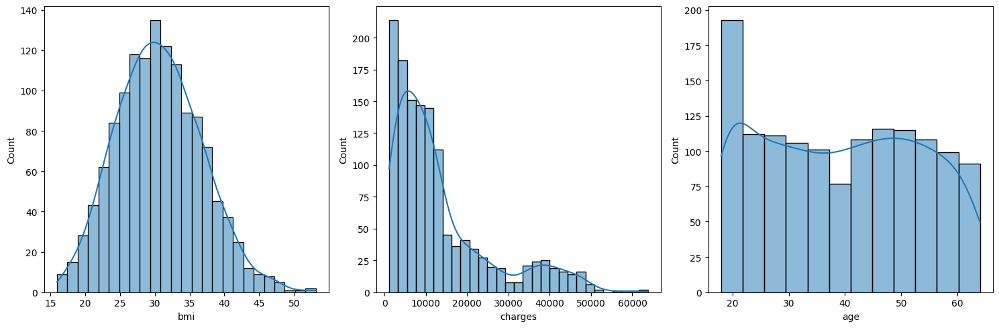

In [56]:
# Plotting histograms to check the distribution of each numerical feature

plt.figure(figsize=(15, 5))

i=0

for column in numerical_cols:
  plt.subplot(1, 3, i+1)
  sns.histplot(df[column], kde=True)
  plt.xlabel(column)
  plt.tight_layout()
  print()
  i+=1

In [57]:
# Checking for any skewness in the numerical columns
df[numerical_cols].skew()

,0
bmi,0.283914
charges,1.515391
age,0.054781


'Charges' is positively skewed

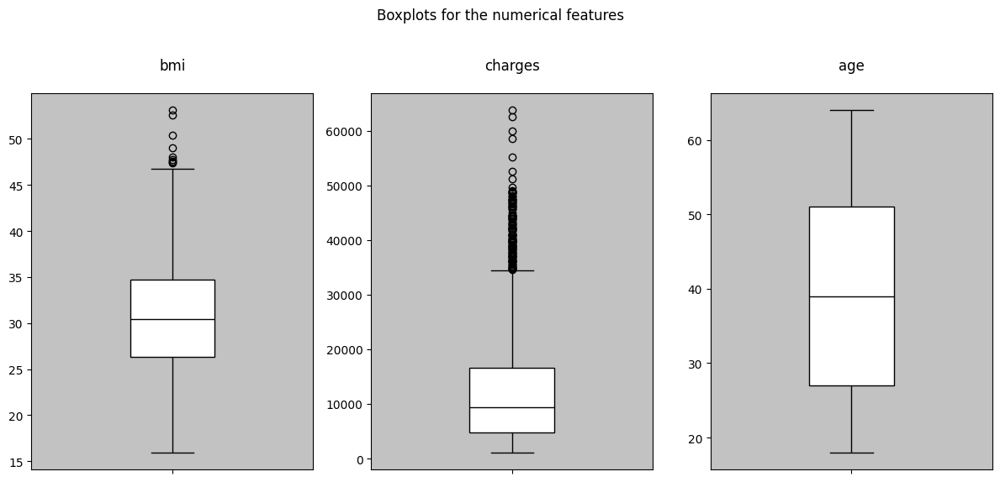

In [58]:
# Plotting boxplots for the numerical features

plt.figure(figsize=(12, 6))

df_for_boxplots = df[numerical_cols]

for i in range(len(df_for_boxplots.columns)):
  axes = plt.subplot(1, 3, i+1)
  sns.boxplot(data=df, y=df_for_boxplots.columns[i], color='white', linecolor='black', width=0.3)
  plt.xlabel('')
  plt.ylabel('')
  plt.title(df_for_boxplots.columns[i], pad=20)
  axes.set_facecolor('#c2c2c2')

plt.suptitle('Boxplots for the numerical features')
plt.tight_layout(rect=[0, 0.03, 1, 0.96])
plt.subplots_adjust(hspace=2)
plt.show()

## Data Cleaning

In [59]:
print(f'Number of rows: {len(df)}')

Number of rows: 1337


In [60]:
# Checking the number of missing values
df.isnull().sum()

,0
age,0
sex,0
bmi,0
children,0
smoker,0
region,0
charges,0
bmi_category,0


There are no missing values

In [61]:
print(f"Number of duplicate records: {sum(df.duplicated())}")

Number of duplicate records: 0


## Splitting the data into train and test sets

Will be predicting the medical cost charge, hence will be the target variable

In [62]:
# df['age_squared'] = df['age'] * df['age']

In [63]:
# X = df.drop(['charges', 'bmi_category', 'age'], axis=1)
# y = df.charges

In [64]:
X = df.drop(['charges', 'bmi_category'], axis=1)
y = df.charges

In [65]:
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=13)

In [66]:
X_train.shape, y_train.shape, X_test.shape, y_test.shape

((1069, 6), (1069,), (268, 6), (268,))

## Encoding the categorical features

Target encoding for the 'Country' feature and One hot Encoding for the 'Region' column

In [67]:
# Combining the train data and test data for the features before one hot encoding the 'Region' feature
X_data = pd.concat([X_train, X_test], axis=0)

In [68]:
df.head(2)

,age,sex,bmi,children,smoker,region,charges,bmi_category
0,19,female,27.90,0,yes,southwest,16884.9240,Overweight
1,18,male,33.77,1,no,southeast,1725.5523,Obese


In [69]:
X_data_encoded = pd.get_dummies(data=X_data,
               columns=['region', 'sex', 'smoker'],
               dtype='int',
               drop_first=True)

In [70]:
X_data_encoded.head()

,age,bmi,children,region_northwest,region_southeast,region_southwest,sex_male,smoker_yes
232,19,17.800,0,0,0,1,0,0
730,35,24.420,3,0,1,0,1,1
426,38,27.265,1,0,0,0,0,0
459,40,33.000,3,0,1,0,0,0
1108,26,30.000,1,0,0,1,1,0


In [71]:
# Split the data back to X_train and X_test after encoding

X_train = X_data_encoded.loc[X_train.index]
X_test = X_data_encoded.loc[X_test.index]

In [72]:
X_train.shape, y_train.shape, X_test.shape, y_test.shape

((1069, 8), (1069,), (268, 8), (268,))

In [73]:
train_df = pd.concat([X_train, y_train], axis=1)

In [74]:
test_df = pd.concat([X_test, y_test], axis=1)

## Outliers

### Identifying Outliers in the train set

In [75]:
train_df_outliers = train_df[['bmi', 'charges']]

In [76]:
q1 = train_df_outliers.quantile(0.25)
q3 = train_df_outliers.quantile(0.75)
iqr = q3 - q1

outlier_count_train = train_df_outliers[(train_df_outliers <  (q1 - 1.5 * iqr)) | (train_df_outliers > (q3 + 1.5 * iqr))].count()


pd.DataFrame(outlier_count_train, columns=['outlier_count_train'])

,outlier_count_train
bmi,7
charges,109


In [77]:
outlier_mask = (train_df_outliers <  (q1 - 1.5 * iqr)) | (train_df_outliers > (q3 + 1.5 * iqr))
train_outlier_indices = train_df_outliers[outlier_mask.any(axis=1)].index

In [78]:
train_outliers_df = train_df.loc[train_outlier_indices]

### Examining the rows with outliers

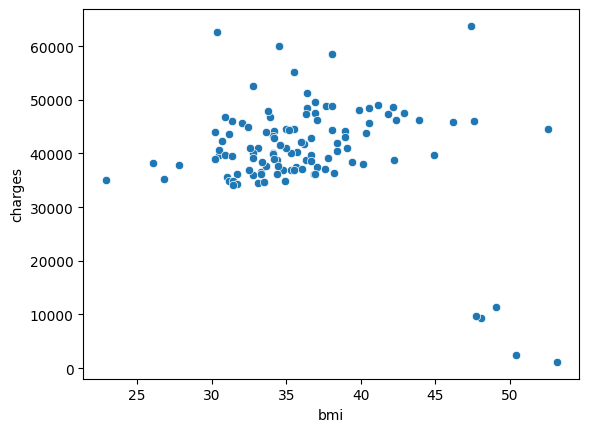

In [79]:
sns.scatterplot(data=train_outliers_df, x='bmi', y='charges');

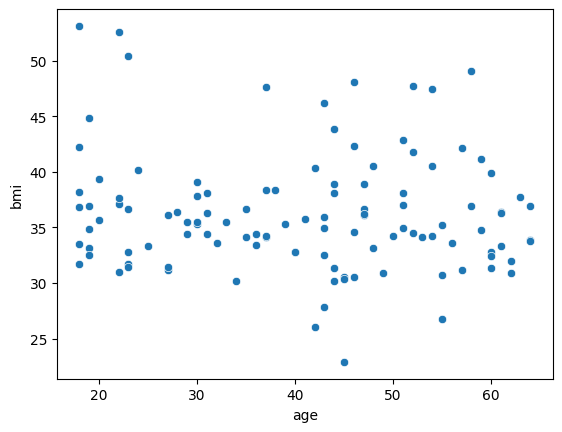

In [80]:
sns.scatterplot(data=train_outliers_df, x='age', y='bmi');

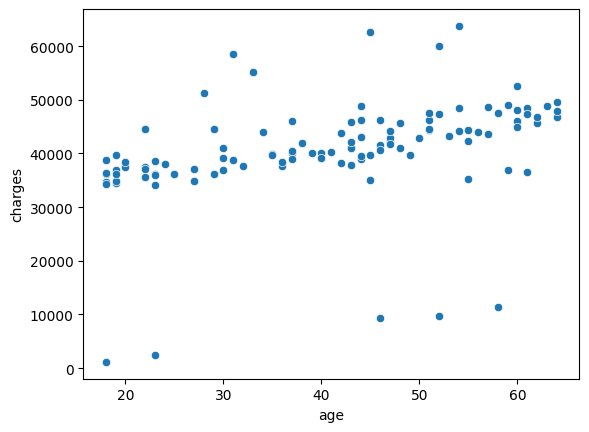

In [81]:
sns.scatterplot(data=train_outliers_df, x='age', y='charges');

Text(0.5, 1.0, 'Correlations between rows containing outliers')

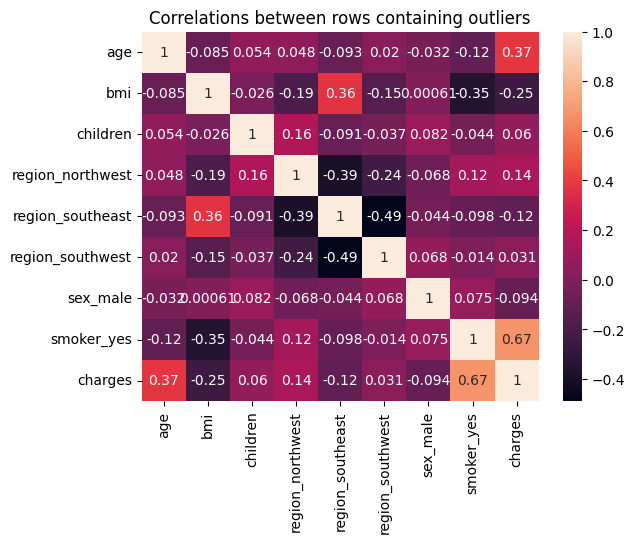

In [82]:
sns.heatmap(data=train_outliers_df.corr(),
            annot=True)
plt.title('Correlations between rows containing outliers')

### Removing Outliers from train data







In [83]:
def outlier_thresholds(df, col):

  # Calculate quantiles
  q1 = df[col].quantile(0.25)
  q3 = df[col].quantile(0.75)

  # Calculate IQR
  iqr = q3 - q1

  # Calculate outlier thresholds
  lower_threshold = q1 - 3 * iqr
  upper_threshold = q3 + 3 * iqr

  return lower_threshold, upper_threshold

In [84]:
outlier_thresholds(train_df, 'bmi')

(np.float64(0.5699999999999861), np.float64(60.420000000000016))

In [85]:
outlier_thresholds(train_df, 'charges')

(np.float64(-30276.107649999994), np.float64(51442.94619999999))

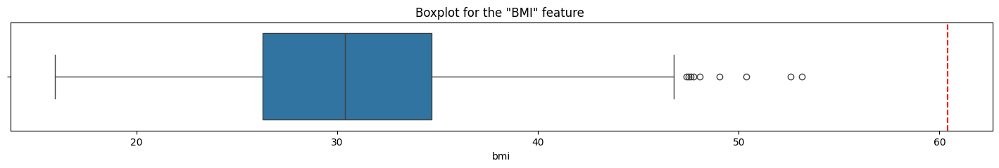

In [86]:
# Plotting boxplots for the numerical features to notice any outliers

plt.figure(figsize=(18, 2))
sns.boxplot(x=X_data['bmi'])
plt.title('Boxplot for the "BMI" feature ')

plt.axvline(x=outlier_thresholds(train_df, 'bmi')[1], color='red', linestyle='--')

plt.show()

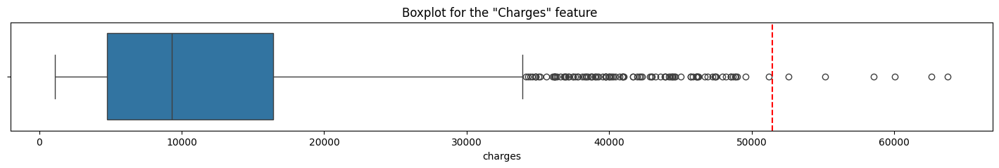

In [87]:
# Plotting boxplots for the numerical features to notice any outliers

plt.figure(figsize=(18, 2))
sns.boxplot(x=y_train)
plt.title('Boxplot for the "Charges" feature ')

plt.axvline(x=outlier_thresholds(train_df, 'charges')[1], color='red', linestyle='--')

plt.show()

**Outliers will be removed using interquatile range but with an increased multiplier of 3 due to the nature of the unexpected charges that could be encountered in the medical insurance domain.**

In [88]:
# Set of records to remove as a result of being outliers
outliers_df = train_df[train_df['charges'] > outlier_thresholds(train_df, 'charges')[1]]
outliers_df

,age,bmi,children,region_northwest,region_southeast,region_southwest,sex_male,smoker_yes,charges
819,33,35.530,0,1,0,0,0,1,55135.40209
577,31,38.095,1,0,0,0,0,1,58571.07448
543,54,47.410,0,0,1,0,0,1,63770.42801
1146,60,32.800,0,0,0,1,1,1,52590.82939
1300,45,30.360,0,0,1,0,1,1,62592.87309
1230,52,34.485,3,1,0,0,1,1,60021.39897


In [89]:
indices_to_remove = outliers_df.index
indices_to_remove

Index([819, 577, 543, 1146, 1300, 1230], dtype='int64')

In [90]:
train_df.shape

(1069, 9)

In [91]:
train_df = train_df.drop(indices_to_remove)

In [92]:
train_df.shape

(1063, 9)

In [93]:
# Removing from train and test sets
X_train = X_train.drop(indices_to_remove)
y_train = y_train.drop(indices_to_remove)

In [94]:
X_train.shape, y_train.shape

((1063, 8), (1063,))

### Identifying Outliers in the test set

In [95]:
test_df_outliers = df[['bmi', 'charges']].copy()

In [96]:
outlier_count_test = test_df_outliers[(test_df_outliers <  (q1 - 1.5 * iqr)) | (test_df_outliers > (q3 + 1.5 * iqr))].count()

pd.DataFrame(outlier_count_test, columns=['outlier_count_test'])

,outlier_count_test
bmi,7
charges,144


Using the quartiles calculated from the train data, there are 35 outliers for 'charges' and None for 'bmi' but no action will be taken against these since it's from the test set.

## Heatmaps to visualize the correlations of the train data

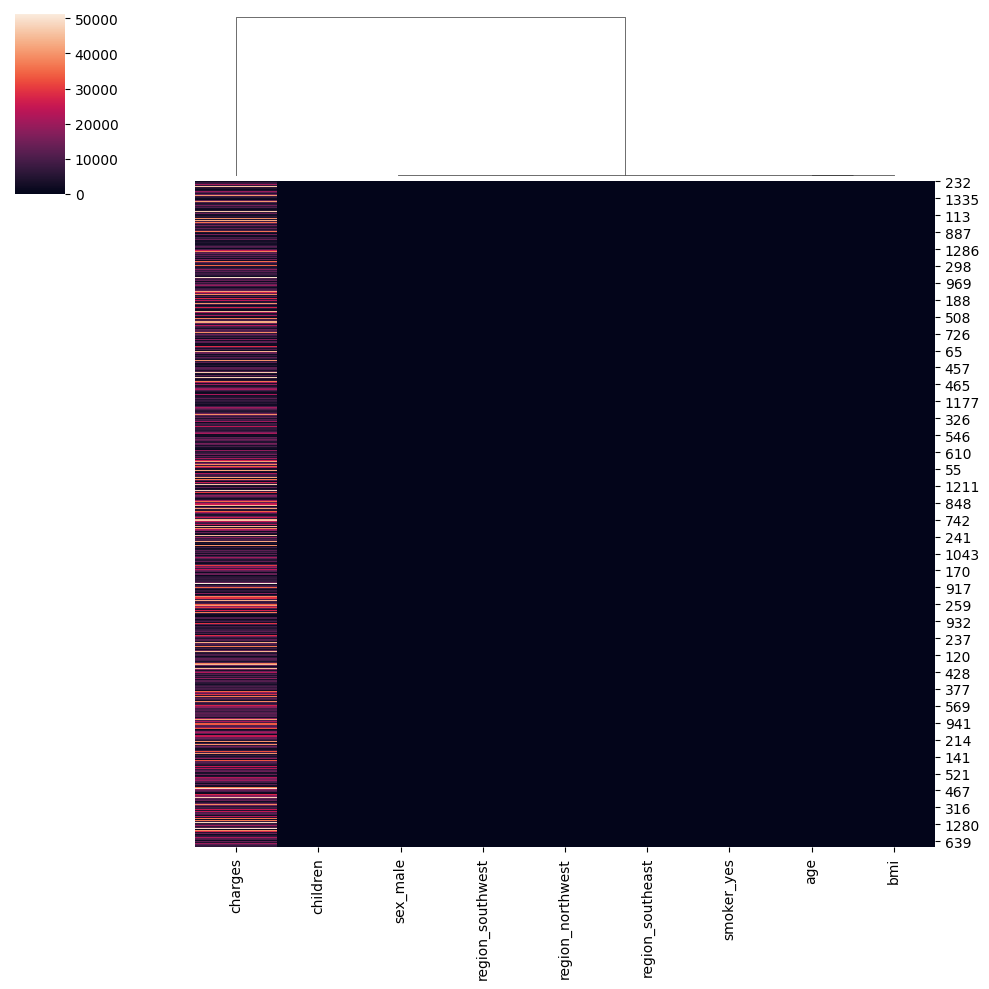

In [97]:
sns.clustermap(data=train_df, row_cluster=False);

<Axes: >

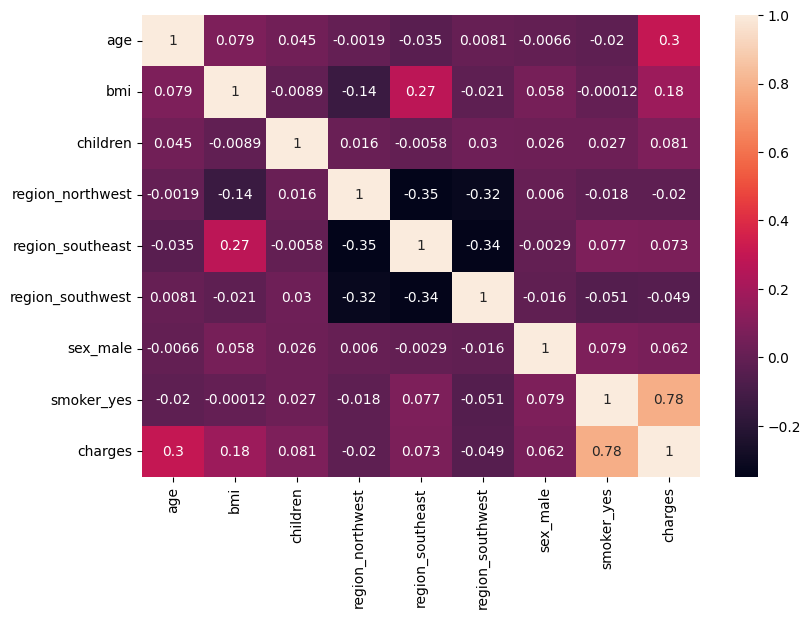

In [98]:
plt.figure(figsize=(9, 6))

sns.heatmap(train_df.corr(numeric_only=True),
            annot=True)

In [99]:
# Dropping the following features
X_train = X_train.drop(['region_southeast', 'region_northwest'], axis=1)
X_test = X_test.drop(['region_southeast', 'region_northwest'], axis=1)

In [100]:
X_train.shape, X_test.shape

((1063, 6), (268, 6))

## Feature Engineering

Pair 1 : age * children


*   Age and children combined can have a significant effect on the cost.

Pair 2 : bmi * smoker_yes


*   As bmi increases (getting unhealthy after a point), could increase the effect when combined with smoking.





In [101]:
# X_train['age*children'] = X_train['age'] * X_train['children']
# X_test['age*children'] = X_test['age'] * X_test['children']

# X_train['bmi*smoker_yes'] = X_train['bmi'] * X_train['smoker_yes']
# X_test['bmi*smoker_yes'] = X_test['bmi'] * X_test['smoker_yes']

Feature engineering introduced multicollinearity on residual plots to the linear regression problem and introduced a large negative regression coefficient contradicting the expectation of charges having to increase if a person smoking, Hence wasn't included

## Model Building

### Metrics

In [102]:
def metrics_table(model, y_test=y_test):

  '''
  Provides a summary of the metrics for the model's performance.

  model: Enter the name of the model
  y_test: y_test
  '''

  y_preds= model.predict(X_test)

  r2 = r2_score(y_test, y_preds)
  mae = mean_absolute_error(y_preds, y_test)
  mse = mean_squared_error(y_preds, y_test)
  rmse = root_mean_squared_error(y_preds, y_test)

  metrics_df = pd.DataFrame({
      "R squared": [r2],
      "MAE": [mae],
      "RMSE": [rmse],
      "MSE": [mse]
  }, index=[model.name])

  # print(f"Model: {model.name}")
  return metrics_df

### Scaling Data

In [103]:
x_scaler = StandardScaler()
x_scaler.fit(X_train)

StandardScaler()

In [104]:
X_train_scaled = x_scaler.transform(X_train)
X_test_scaled = x_scaler.transform(X_test)

## Models

In [105]:
def evaluate_model(model, model_name, X_train=X_train_scaled, y_train=y_train, X_test=X_test_scaled, y_test=y_test):

  '''
  model : Model's name
  model_name : Desired name to label the model
  Fits the model and trains to ouput the metrics of the model.
  '''

  print(f"Model: {model_name}")
  print()

  # Fitting the model to the train data

  model.fit(X_train, y_train)
  model.name = model_name

  # Evaluating the model's predictions against the train data

  y_preds_train= model.predict(X_train)

  r2_train = r2_score(y_train, y_preds_train)
  mae_train = mean_absolute_error(y_train, y_preds_train)
  mse_train = mean_squared_error(y_train, y_preds_train)
  rmse_train = root_mean_squared_error(y_train, y_preds_train)

  train_metrics = pd.DataFrame({
       "R squared": [r2_train],
       "MAE": [mae_train],
       "RMSE": [rmse_train],
       "MSE": [mse_train]
   }, index=[f'{model.name} (Train Data)'])

  # Evaluating the model's predictions against the test data

  y_preds_test= model.predict(X_test)

  r2_test = r2_score(y_test, y_preds_test)
  mae_test = mean_absolute_error(y_test, y_preds_test)
  mse_test = mean_squared_error(y_test, y_preds_test)
  rmse_test = root_mean_squared_error(y_test, y_preds_test)

  test_metrics = pd.DataFrame({
      "R squared": [r2_test],
      "MAE": [mae_test],
      "RMSE": [rmse_test],
      "MSE": [mse_test]
  }, index=[f'{model.name} (Test Data)'])

  model_results = pd.concat([train_metrics, test_metrics])

  # print(f"Model: {model.name}")
  return model_results

### Model_0 (Multiple Linear Regression)

In [106]:
model_0 = LinearRegression()

model_0_results = evaluate_model(model=model_0,
                         model_name='Multiple Linear Regression')
model_0_results

Model: Multiple Linear Regression



,R squared,MAE,RMSE,MSE
Multiple Linear Regression (Train Data),0.741623,4043.127482,5889.819366,3.468997e+07
Multiple Linear Regression (Test Data),0.783782,4115.924278,5715.758776,3.266990e+07


### Model_1 (K-Nearest Neighbors Regression)

In [107]:
model_1 = KNeighborsRegressor()
model_1_results = evaluate_model(model=model_1,
               model_name='KNN Regresssor')
model_1_results

Model: KNN Regresssor



,R squared,MAE,RMSE,MSE
KNN Regresssor (Train Data),0.864319,2527.189306,4268.104169,1.821671e+07
KNN Regresssor (Test Data),0.835738,3156.917868,4981.924651,2.481957e+07


### Model_2 (Random Forest Regression)

In [108]:
model_2 = RandomForestRegressor()

model_2_results = evaluate_model(model=model_2,
               model_name='Random Forest Regressor')
model_2_results

Model: Random Forest Regressor



,R squared,MAE,RMSE,MSE
Random Forest Regressor (Train Data),0.975040,1005.221299,1830.629361,3.351204e+06
Random Forest Regressor (Test Data),0.866256,2522.983572,4495.363506,2.020829e+07


### Model_3 (Gradient Boosting Regressor)

In [109]:
model_3 = GradientBoostingRegressor(random_state=13)
model_3_results = evaluate_model(model=model_3,
               model_name='Gradient Boosting Regressor')
model_3_results

Model: Gradient Boosting Regressor



,R squared,MAE,RMSE,MSE
Gradient Boosting Regressor (Train Data),0.897475,2009.464080,3710.143624,1.376517e+07
Gradient Boosting Regressor (Test Data),0.884673,2331.982134,4174.399750,1.742561e+07


### Model_4 (XGBoost Regressor)

In [110]:
model_4 = XGBRegressor()
model_4_results = evaluate_model(model=model_4,
               model_name='XGBoost Regressor')
model_4_results

Model: XGBoost Regressor



,R squared,MAE,RMSE,MSE
XGBoost Regressor (Train Data),0.993562,490.447870,929.747376,8.644302e+05
XGBoost Regressor (Test Data),0.851404,2654.379446,4738.400701,2.245244e+07


## Hyper tuning Parameters for each model

### Model_0 (HT)

In [111]:
model_0.get_params()

{'copy_X': True, 'fit_intercept': True, 'n_jobs': None, 'positive': False}

In [112]:
param_grid = {'copy_X' : [True, False],
              'fit_intercept' : [True, False],
              'positive' : [True, False]}

grid_search_0 = GridSearchCV(estimator=model_0,
                             param_grid=param_grid,
                             scoring='r2',
                             verbose=0)

grid_search_0.fit(X_train, y_train)

GridSearchCV(estimator=LinearRegression(),
             param_grid={'copy_X': [True, False],
                         'fit_intercept': [True, False],
                         'positive': [True, False]},
             scoring='r2')

In [113]:
print(grid_search_0.best_params_)

{'copy_X': True, 'fit_intercept': True, 'positive': True}


In [114]:
regression_coefficients_df = pd.DataFrame(grid_search_0.best_estimator_.coef_,
             index=X_train.columns,
             columns=['Regression Coefficient'])
regression_coefficients_df

,Regression Coefficient
age,251.106657
bmi,288.597780
children,453.579052
region_southwest,0.000000
sex_male,0.000000
smoker_yes,23228.702072


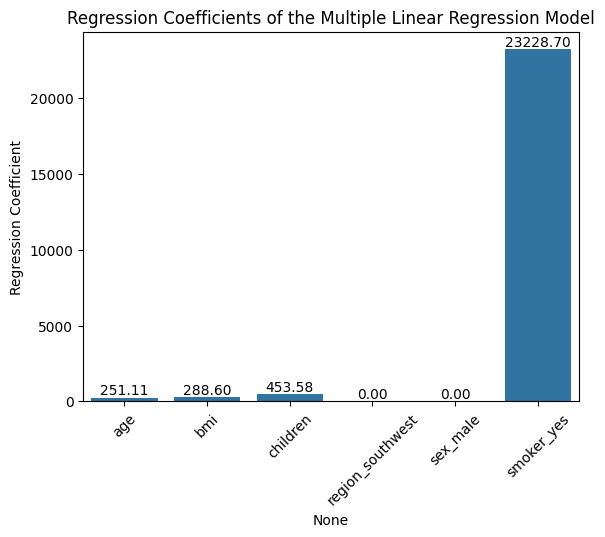

In [115]:
sns.barplot(x=regression_coefficients_df.index, y=regression_coefficients_df['Regression Coefficient'])
plt.xticks(rotation=45)
plt.title('Regression Coefficients of the Multiple Linear Regression Model')
for bar in plt.gca().patches:
    height = bar.get_height()

    # Marking the values of the coefficients on top of the bars
    plt.gca().text(bar.get_x() + bar.get_width() / 2,\
                   height, f'{height:.2f}',
                   ha='center',
                   va='bottom')
plt.show()

Plotting a residual plot

In [116]:
observed = model_0.predict(X_test)
actual = y_test
residuals = observed - actual

/usr/local/lib/python3.11/dist-packages/sklearn/utils/validation.py:2732: UserWarning:

X has feature names, but LinearRegression was fitted without feature names



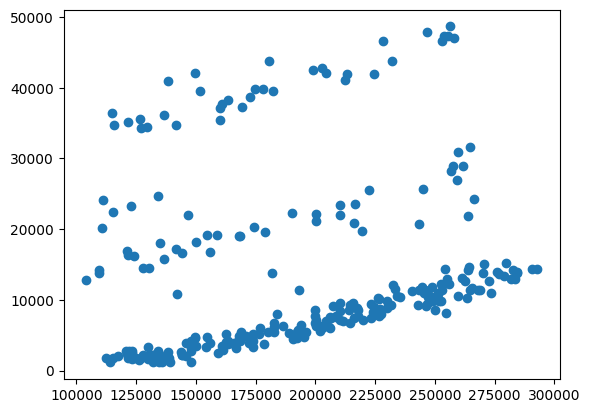

In [117]:
plt.scatter(residuals, actual)
plt.show()

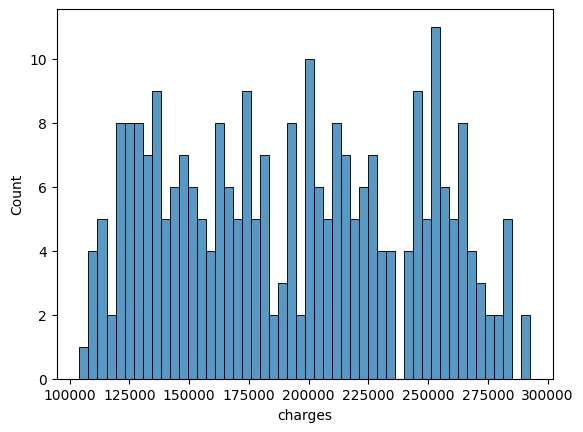

In [118]:
sns.histplot(residuals,
             bins=50);

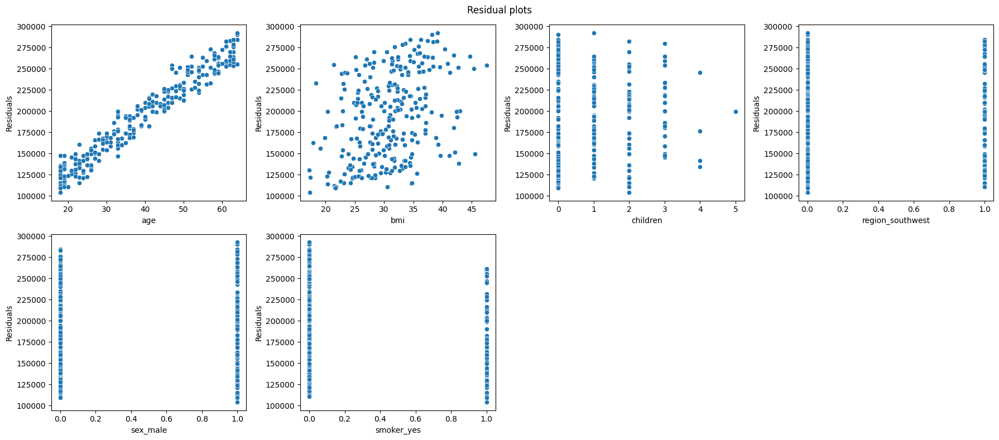

In [119]:
plt.figure(figsize=(18, 8))

i=0

for column in X_test.columns:

  plt.subplot(2, 4, i+1)
  sns.scatterplot(y=residuals, x=X_test[column])
  plt.xlabel(column)
  plt.ylabel('Residuals')
  plt.tight_layout()
  print()
  plt.suptitle('Residual plots')
  i+=1

In [120]:
model_0_results_ht = evaluate_model(model=grid_search_0.best_estimator_,
               model_name='Linear Regression HT')
model_0_results_ht

Model: Linear Regression HT



,R squared,MAE,RMSE,MSE
Linear Regression HT (Train Data),0.741466,4046.406669,5891.609043,3.471106e+07
Linear Regression HT (Test Data),0.783476,4119.986520,5719.802634,3.271614e+07


### Model_1 (HT)

In [121]:
model_1.get_params()

{'algorithm': 'auto',
 'leaf_size': 30,
 'metric': 'minkowski',
 'metric_params': None,
 'n_jobs': None,
 'n_neighbors': 5,
 'p': 2,
 'weights': 'uniform'}

In [122]:
param_grid_1 = {'n_neighbors' : [8, 9, 10, 11, 12, 13, 14, 15]}

grid_search_1 = GridSearchCV(estimator=model_1,
                             param_grid=param_grid_1,
                             scoring='r2',
                             verbose=0)

grid_search_1.fit(X_train, y_train)

GridSearchCV(estimator=KNeighborsRegressor(),
             param_grid={'n_neighbors': [8, 9, 10, 11, 12, 13, 14, 15]},
             scoring='r2')

In [123]:
print(grid_search_1.best_params_)

{'n_neighbors': 15}


In [124]:
model_1_results_ht = evaluate_model(model=grid_search_1.best_estimator_,
               model_name='K-Nearest Neighbors HT')
model_1_results_ht

Model: K-Nearest Neighbors HT



,R squared,MAE,RMSE,MSE
K-Nearest Neighbors HT (Train Data),0.827740,3015.256372,4809.136279,2.312779e+07
K-Nearest Neighbors HT (Test Data),0.841352,3230.570452,4896.041709,2.397122e+07


### Model_2 (HT)

In [125]:
model_2.get_params()

{'bootstrap': True,
 'ccp_alpha': 0.0,
 'criterion': 'squared_error',
 'max_depth': None,
 'max_features': 1.0,
 'max_leaf_nodes': None,
 'max_samples': None,
 'min_impurity_decrease': 0.0,
 'min_samples_leaf': 1,
 'min_samples_split': 2,
 'min_weight_fraction_leaf': 0.0,
 'monotonic_cst': None,
 'n_estimators': 100,
 'n_jobs': None,
 'oob_score': False,
 'random_state': None,
 'verbose': 0,
 'warm_start': False}

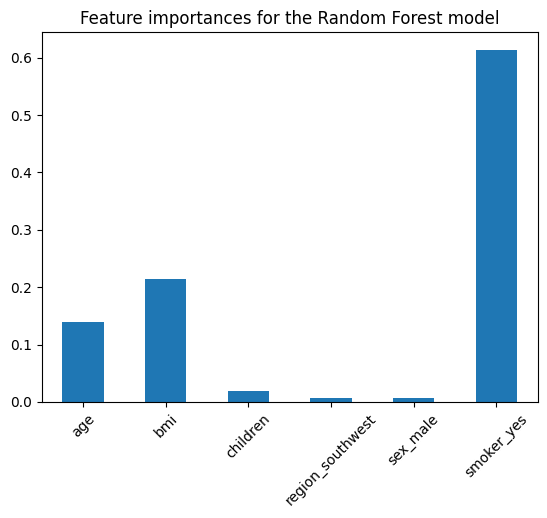

In [126]:
model_2_feature_importances = pd.DataFrame(model_2.feature_importances_, index=X_train.columns)
model_2_feature_importances.plot(kind='bar')
plt.title('Feature importances for the Random Forest model')
plt.xticks(rotation=45)
plt.legend().remove()
plt.show()

In [127]:
param_grid_2 = {
    'n_estimators': [300, 400],
    'max_depth': [4, 5, 6],
    'min_samples_split': [5, 10, 15],
    'min_samples_leaf': [3, 5],
    'max_features': [2, 3, 4],
    'criterion': ['squared_error']
    }

grid_search_2 = GridSearchCV(estimator=model_2,
                             param_grid=param_grid_2,
                             scoring='r2',
                             verbose=0)

grid_search_2.fit(X_train, y_train)

GridSearchCV(estimator=RandomForestRegressor(),
             param_grid={'criterion': ['squared_error'], 'max_depth': [4, 5, 6],
                         'max_features': [2, 3, 4], 'min_samples_leaf': [3, 5],
                         'min_samples_split': [5, 10, 15],
                         'n_estimators': [300, 400]},
             scoring='r2')

In [128]:
print(grid_search_2.best_params_)

{'criterion': 'squared_error', 'max_depth': 5, 'max_features': 4, 'min_samples_leaf': 5, 'min_samples_split': 5, 'n_estimators': 400}


In [129]:
model_2_results_ht = evaluate_model(model=grid_search_2.best_estimator_,
               model_name='Random Forest Regressor HT')
model_2_results_ht

Model: Random Forest Regressor HT



,R squared,MAE,RMSE,MSE
Random Forest Regressor HT (Train Data),0.871369,2314.950164,4155.733338,1.727012e+07
Random Forest Regressor HT (Test Data),0.893255,2337.444355,4016.066841,1.612879e+07


### Model_3 (HT)

In [130]:
model_3.get_params()

{'alpha': 0.9,
 'ccp_alpha': 0.0,
 'criterion': 'friedman_mse',
 'init': None,
 'learning_rate': 0.1,
 'loss': 'squared_error',
 'max_depth': 3,
 'max_features': None,
 'max_leaf_nodes': None,
 'min_impurity_decrease': 0.0,
 'min_samples_leaf': 1,
 'min_samples_split': 2,
 'min_weight_fraction_leaf': 0.0,
 'n_estimators': 100,
 'n_iter_no_change': None,
 'random_state': 13,
 'subsample': 1.0,
 'tol': 0.0001,
 'validation_fraction': 0.1,
 'verbose': 0,
 'warm_start': False}

In [131]:
param_grid_3 = {'max_depth' : [2, 3, 4],
                'min_samples_leaf' : [10, 11, 12],
                'n_estimators' : [50, 75, 100],
                'max_features' : [3, 4, 5],
                'max_leaf_nodes': [10, 20],
                'min_samples_split' : [2, 3]
                }

grid_search_3 = GridSearchCV(estimator=model_3,
                             param_grid=param_grid_3,
                             scoring='r2',
                             verbose=0)

grid_search_3.fit(X_train, y_train)

GridSearchCV(estimator=GradientBoostingRegressor(random_state=13),
             param_grid={'max_depth': [2, 3, 4], 'max_features': [3, 4, 5],
                         'max_leaf_nodes': [10, 20],
                         'min_samples_leaf': [10, 11, 12],
                         'min_samples_split': [2, 3],
                         'n_estimators': [50, 75, 100]},
             scoring='r2')

In [132]:
grid_search_3.best_params_

{'max_depth': 3,
 'max_features': 5,
 'max_leaf_nodes': 10,
 'min_samples_leaf': 12,
 'min_samples_split': 2,
 'n_estimators': 50}

In [133]:
model_3_results_ht = evaluate_model(model=grid_search_3.best_estimator_,
               model_name='Gradient Boosting Regressor HT')
model_3_results_ht

Model: Gradient Boosting Regressor HT



,R squared,MAE,RMSE,MSE
Gradient Boosting Regressor HT (Train Data),0.871413,2266.344994,4155.019784,1.726419e+07
Gradient Boosting Regressor HT (Test Data),0.894421,2286.873258,3994.074025,1.595263e+07


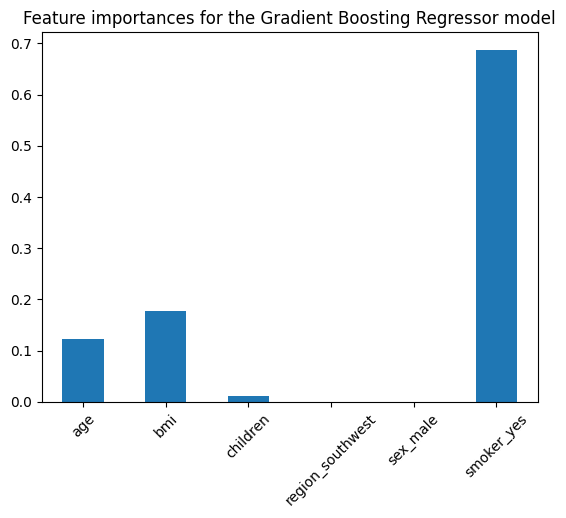

In [134]:
model_3_feature_importances = pd.DataFrame(model_3.feature_importances_, index=X_train.columns)
model_3_feature_importances.plot(kind='bar')
plt.title('Feature importances for the Gradient Boosting Regressor model')
plt.xticks(rotation=45)
plt.legend().remove()
plt.show()

### Model_4 (HT)

In [135]:
model_4.get_params()

{'objective': 'reg:squarederror',
 'base_score': None,
 'booster': None,
 'callbacks': None,
 'colsample_bylevel': None,
 'colsample_bynode': None,
 'colsample_bytree': None,
 'device': None,
 'early_stopping_rounds': None,
 'enable_categorical': False,
 'eval_metric': None,
 'feature_types': None,
 'gamma': None,
 'grow_policy': None,
 'importance_type': None,
 'interaction_constraints': None,
 'learning_rate': None,
 'max_bin': None,
 'max_cat_threshold': None,
 'max_cat_to_onehot': None,
 'max_delta_step': None,
 'max_depth': None,
 'max_leaves': None,
 'min_child_weight': None,
 'missing': nan,
 'monotone_constraints': None,
 'multi_strategy': None,
 'n_estimators': None,
 'n_jobs': None,
 'num_parallel_tree': None,
 'random_state': None,
 'reg_alpha': None,
 'reg_lambda': None,
 'sampling_method': None,
 'scale_pos_weight': None,
 'subsample': None,
 'tree_method': None,
 'validate_parameters': None,
 'verbosity': None}

In [136]:
param_grid_4 = {'learning_rate' : [0.01, 0.03, 0.05, 0.1],
                'max_depth' : [2, 3, 4],
                'n_estimators' : [300, 400, 500]
                }

grid_search_4 = GridSearchCV(estimator=model_4,
                             param_grid=param_grid_4,
                             scoring='r2',
                             verbose=0)

grid_search_4.fit(X_train, y_train)

GridSearchCV(estimator=XGBRegressor(base_score=None, booster=None,
                                    callbacks=None, colsample_bylevel=None,
                                    colsample_bynode=None,
                                    colsample_bytree=None, device=None,
                                    early_stopping_rounds=None,
                                    enable_categorical=False, eval_metric=None,
                                    feature_types=None, gamma=None,
                                    grow_policy=None, importance_type=None,
                                    interaction_constraints=None,
                                    learning_rate=None, max_bi...
                                    max_cat_threshold=None,
                                    max_cat_to_onehot=None, max_delta_step=None,
                                    max_depth=None, max_leaves=None,
                                    min_child_weight=None, missing=nan,
                                    monotone_constraints=None,
                                    multi_strategy=None, n_estimators=None,
                                    n_jobs=None, num_parallel_tree=None,
                                    random_state=None, ...),
             param_grid={'learning_rate': [0.01, 0.03, 0.05, 0.1],
                         'max_depth': [2, 3, 4],
                         'n_estimators': [300, 400, 500]},
             scoring='r2')

In [137]:
grid_search_4.best_params_

{'learning_rate': 0.01, 'max_depth': 3, 'n_estimators': 400}

In [138]:
model_4_results_ht = evaluate_model(model=grid_search_4.best_estimator_,
               model_name='Gradient Boosting Regressor HT')
model_4_results_ht

Model: Gradient Boosting Regressor HT



,R squared,MAE,RMSE,MSE
Gradient Boosting Regressor HT (Train Data),0.868249,2356.730395,4205.825503,1.768897e+07
Gradient Boosting Regressor HT (Test Data),0.893427,2354.459536,4012.840608,1.610289e+07


------------------------------------------------------------------------------------------------------THE END----------------------------------------------------------------------------------------

# 03. Supervised Learning - Classification

# Financial Sentiment Analysis

https://www.kaggle.com/datasets/sbhatti/financial-sentiment-analysis

Importing the necessary libraries

In [1]:
import numpy as np
import pandas as pd
import random
from sklearn.model_selection import train_test_split, GridSearchCV
import tensorflow as tf
from tensorflow.keras.layers import TextVectorization
from tensorflow.keras.layers import Embedding
from tensorflow.keras import layers
import matplotlib.pyplot as plt
import seaborn as sns
import nltk
from nltk.corpus import stopwords
import re
from wordcloud import WordCloud
from sklearn.preprocessing import LabelEncoder
from sklearn.pipeline import Pipeline
from sklearn.feature_extraction.text import TfidfVectorizer
from sklearn.naive_bayes import MultinomialNB
from sklearn.linear_model import LogisticRegression
from sklearn.ensemble import GradientBoostingClassifier
from sklearn.svm import LinearSVC
from sklearn.metrics import classification_report, confusion_matrix, ConfusionMatrixDisplay
import tensorflow_hub as hub
import tensorflow_text as text
import tf_keras
from imblearn.under_sampling import RandomUnderSampler
from imblearn.over_sampling import SMOTE

In [2]:
# Keeping the results reproducable
tf.random.set_seed(13)

Importing the dataset

In [ ]:
df = pd.read_csv(r"D:\User\University\Year 3\Machine Learning\Coursework\Supervised learning\Classification\archive\data.csv")
df.head()

,Sentence,Sentiment
0,The GeoSolutions technology will leverage Bene...,positive
1,"$ESI on lows, down $1.50 to $2.50 BK a real po...",negative
2,"For the last quarter of 2010 , Componenta 's n...",positive
3,According to the Finnish-Russian Chamber of Co...,neutral
4,The Swedish buyout firm has sold its remaining...,neutral


# EDA (Exploratory Data Analysis)

In [4]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 5842 entries, 0 to 5841
Data columns (total 2 columns):
 #   Column     Non-Null Count  Dtype 
---  ------     --------------  ----- 
 0   Sentence   5842 non-null   object
 1   Sentiment  5842 non-null   object
dtypes: object(2)
memory usage: 91.4+ KB


No null values can be seen

In [5]:
# Checking for any duplicate rows
df.duplicated().sum()

np.int64(6)

In [6]:
# removing the duplicate rows
df = df.drop_duplicates()

In [7]:
df.info()

<class 'pandas.core.frame.DataFrame'>
Index: 5836 entries, 0 to 5841
Data columns (total 2 columns):
 #   Column     Non-Null Count  Dtype 
---  ------     --------------  ----- 
 0   Sentence   5836 non-null   object
 1   Sentiment  5836 non-null   object
dtypes: object(2)
memory usage: 136.8+ KB


6 duplicate rows were removed

In [8]:
label_counts = df['Sentiment'].value_counts()
label_counts

,count
Sentiment,
neutral,3124
positive,1852
negative,860


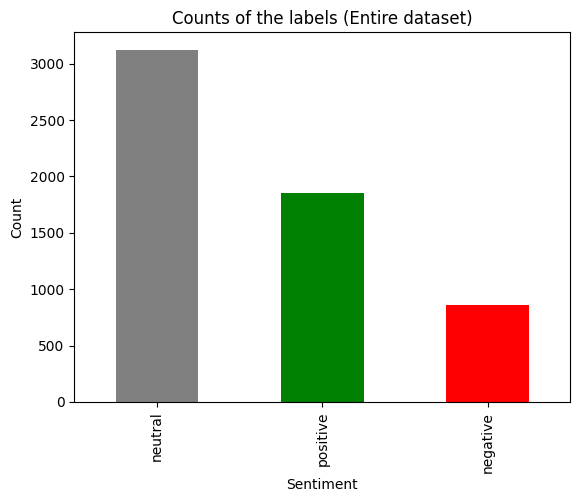

In [9]:
colors = ['gray', 'green', 'red']
label_counts.plot(kind='bar', title='Counts of the labels (Entire dataset)', ylabel='Count', color=colors);

Can observe a strong case of imbalance.

1.   Downsampling the labels in the train set to the the negative class count, as done in
     previous case studies.
2.   Dropping the neutral class to address the imbalance and focus more the sentiment polarity between the positive and the negative class labels.

**Approach will be decided by taking a baseline model for each.**


In [10]:
# The sentiment breakdown in percentages
100*(label_counts/len(df))

,count
Sentiment,
neutral,53.529815
positive,31.734064
negative,14.736121


In [11]:
# Checking a few random tweets and its labels

for i in range(10):
  row = random.randint(0,len(df))

  print(f"Sentence: {df['Sentence'][row]}")
  print(f"Sentiment: {df['Sentiment'][row]}")
  print()

Sentence: Both operating profit and net sales for the six-month period increased , respectively from EUR7 .5 m and EUR655 .5 m , as compared to the corresponding period in 2005 .
Sentiment: positive

Sentence: Finnish Raute Precision that supplies weighing and dosing systems and plants is changing its name to Lahti Precision .
Sentiment: neutral

Sentence: The EPS outlook was increased by 5.6 pct for 2007 and 7.0 pct for 2008 .
Sentiment: positive

Sentence: The building will house , for example , Respecta Oy 's Jyvaskyla premises , as well as other companies to be announced later , says Samuel Koivisto , Director of Technopolis operations in Jyvaskyla .
Sentiment: neutral

Sentence: Last year , the firm also acquired Realprojekti Oy , a real estate development company , to advise CapMan on its property activities .
Sentiment: neutral

Sentence: The order consists of capacity expansion , maintenance services and new charging functionality , the company said .
Sentiment: neutral

Senten

In [12]:
# Splitting data into train and test sets before further analysis

X_train, X_test, y_train, y_test = train_test_split(df['Sentence'].to_numpy(),
                                                    df['Sentiment'].to_numpy(),
                                                    test_size=0.2,
                                                    shuffle=True,
                                                    stratify=df['Sentiment'],
                                                    random_state=13)

# Data Preprocessing and Visualizing

### Removing Stopwords

Removing the stopwords from the train_data and test data seperately

2 versions of datasets,

1.   Without stopwords for machine learning algortihms and for producing wordclouds.
2.   Including stopwords for the deep learning model.

In [13]:
# Importing the stopwords
nltk.download('stopwords')
print(stopwords.words('english'))

stop_words = set(stopwords.words('english'))

['a', 'about', 'above', 'after', 'again', 'against', 'ain', 'all', 'am', 'an', 'and', 'any', 'are', 'aren', "aren't", 'as', 'at', 'be', 'because', 'been', 'before', 'being', 'below', 'between', 'both', 'but', 'by', 'can', 'couldn', "couldn't", 'd', 'did', 'didn', "didn't", 'do', 'does', 'doesn', "doesn't", 'doing', 'don', "don't", 'down', 'during', 'each', 'few', 'for', 'from', 'further', 'had', 'hadn', "hadn't", 'has', 'hasn', "hasn't", 'have', 'haven', "haven't", 'having', 'he', "he'd", "he'll", 'her', 'here', 'hers', 'herself', "he's", 'him', 'himself', 'his', 'how', 'i', "i'd", 'if', "i'll", "i'm", 'in', 'into', 'is', 'isn', "isn't", 'it', "it'd", "it'll", "it's", 'its', 'itself', "i've", 'just', 'll', 'm', 'ma', 'me', 'mightn', "mightn't", 'more', 'most', 'mustn', "mustn't", 'my', 'myself', 'needn', "needn't", 'no', 'nor', 'not', 'now', 'o', 'of', 'off', 'on', 'once', 'only', 'or', 'other', 'our', 'ours', 'ourselves', 'out', 'over', 'own', 're', 's', 'same', 'shan', "shan't", 'she

[nltk_data] Downloading package stopwords to /root/nltk_data...
[nltk_data]   Package stopwords is already up-to-date!


In [14]:
# removing any links or urls
def remove_urls(df):
  for i in range(len(df)):
    df['Sentence'][i] = str(re.compile(r'https?://\S+|www\.\S+').sub(r'', df['Sentence'][i].replace(r'\s*https?://\S+(\s+|$)', ' ').strip()))

  return df


# For further data cleaning
def data_cleaning(df):

  # converting all words to lowercase
  df['Sentence'] = df['Sentence'].str.lower()

  # Removing any punctuation
  df['Sentence'] = df['Sentence'].str.replace(r'[^\w\s]', '', regex=True)

  # Removing extra spacing
  df['Sentence'] = df['Sentence'].str.replace(r'\s+', ' ', regex=True)
  df['Sentence'] = df['Sentence'].str.replace(r'\s([.,!?])', r'\1', regex=True)
  df['Sentence'] = df['Sentence'].str.replace(r'\s*-\s*', '-', regex=True)
  df['Sentence'] = df['Sentence'].str.strip()

  return df


# Define a function to remove the stopwords

def remove_stopwords(text):
  tokens = text.split()
  tokens_no_stopwords = [word for word in tokens if word not in stop_words]
  return ' '.join(tokens_no_stopwords)

## Data Preparation on train data

Will be using only the train data to avoid any data leakage

## No changes in the train data (For visualizations)

In [15]:
train_df = pd.concat([pd.DataFrame(X_train), pd.Series(y_train)], axis=1)
train_df.columns = ["Sentence", "Sentiment"]
train_df['Sentence'] = train_df['Sentence'].astype(str)   # Making sure the sentences are in string format
train_df.head()

,Sentence,Sentiment
0,Operating loss before non-recurring items was ...,negative
1,Blyk is launching first in the UK market in mi...,neutral
2,The order was valued at USD12 .2 m.,neutral
3,Glaston 's net profit for the third quarter of...,neutral
4,Cash flow from operating activities is estimat...,positive


In [16]:
ml_train_df = remove_urls(train_df)
ml_train_df = data_cleaning(ml_train_df)

Streaming output truncated to the last 5000 lines.

Use `df.loc[row_indexer, "col"] = values` instead, to perform the assignment in a single step and ensure this keeps updating the original `df`.

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy

  df['Sentence'][i] = str(re.compile(r'https?://\S+|www\.\S+').sub(r'', df['Sentence'][i].replace(r'\s*https?://\S+(\s+|$)', ' ').strip()))
<ipython-input-14-07bd21b1374a>:4: FutureWarning: ChainedAssignmentError: behaviour will change in pandas 3.0!
You are setting values through chained assignment. Currently this works in certain cases, but when using Copy-on-Write (which will become the default behaviour in pandas 3.0) this will never work to update the original DataFrame or Series, because the intermediate object on which we are setting values will behave as a copy.
A typical example is when you are setting values in a column of a DataFrame, like:

df

## 01. Downsampling the train data

Downsampling all three class labels to equal the negative class label counts (minimum)

In [17]:
# ds: Downsampled

downsampler = RandomUnderSampler(random_state=13)
X_train_ds, y_train_ds = downsampler.fit_resample(X_train.reshape(-1,1), y_train)
X_train_ds = np.squeeze(X_train_ds)

# Creating a dataframe to combine the downsampled train data
train_df_ds = pd.concat([pd.DataFrame(X_train_ds), pd.Series(y_train_ds)], axis=1)

# Adding the column names
train_df_ds.columns = ['Sentence', 'Sentiment']
train_df_ds.head()

,Sentence,Sentiment
0,Operating loss before non-recurring items was ...,negative
1,As a result of the negotiations the employment...,negative
2,"$SLV POS, been saying it for 2 years. Going lo...",negative
3,Finnish electronics contract manufacturer Scan...,negative
4,EPS dropped to EUR0 .2 from EUR0 .3 .,negative


In [18]:
label_counts_ds = train_df_ds['Sentiment'].value_counts()
label_counts_ds

,count
Sentiment,
negative,688
neutral,688
positive,688


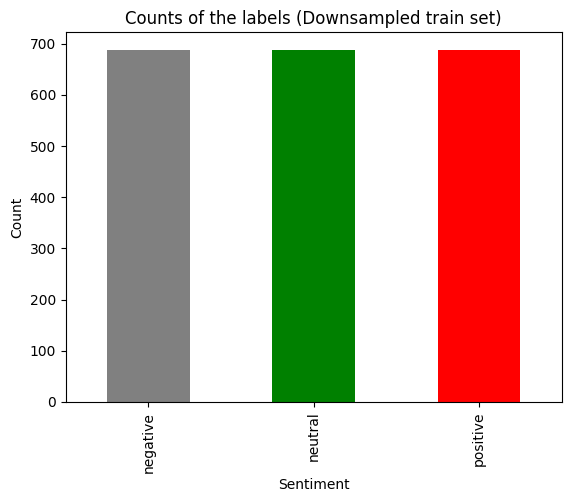

In [19]:
label_counts_ds.plot(kind='bar', title='Counts of the labels (Downsampled train set)', ylabel='Count', color=colors);

## 02. Dropping the 'Neutral' column (**Binary** Classification Problem)

**Dropping the neutral column from the entire dataset**

df_binary: 2 classes

In [20]:
df_binary = df[df['Sentiment'] != 'neutral']
print(f'Total number of new rows in the dataset with 2 classes in absence of the "neutral" class: {len(df_binary)}')

Total number of new rows in the dataset with 2 classes in absence of the "neutral" class: 2712


In [21]:
label_counts_binary = df_binary['Sentiment'].value_counts()
label_counts_binary

,count
Sentiment,
positive,1852
negative,860


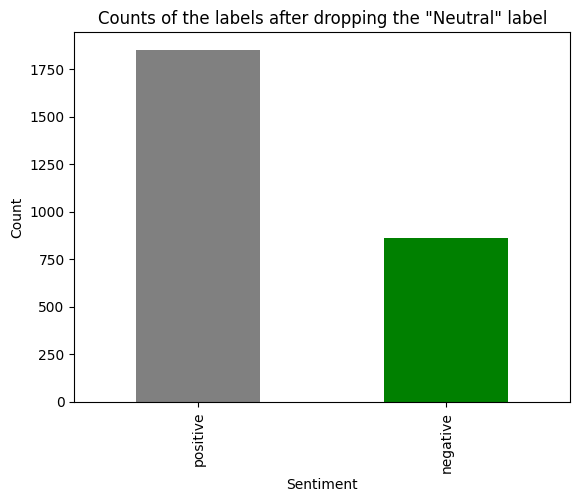

In [22]:
label_counts_binary.plot(kind='bar', title='Counts of the labels after dropping the "Neutral" label', ylabel='Count', color=colors);

A significant imbalance can still be seen

The data will be **oversampled** using **SMOTE** in this case, since downsampling could result in alot of loss data.

In [23]:
X_train_b, X_test_b, y_train_b, y_test_b = train_test_split(df_binary['Sentence'].to_numpy(),
                                                    df_binary['Sentiment'].to_numpy(),
                                                    test_size=0.2,
                                                    shuffle=True,
                                                    stratify=df_binary['Sentiment'],
                                                    random_state=13)

# Train data preparation
train_df_b = pd.concat([pd.DataFrame(X_train_b), pd.Series(y_train_b)], axis=1)
train_df_b.columns = ["Sentence", "Sentiment"]
train_df_b['Sentence'] = train_df_b['Sentence'].astype(str)
train_df_b.head()

,Sentence,Sentiment
0,easyJet expects resilient demand to withstand ...,positive
1,The company 's market share is continued to in...,positive
2,Intertek swings to Â£347 mln loss on oil's slump,negative
3,The third order awarded to Outokumpu Technolog...,positive
4,$NUGT longer term bullish,positive


In [24]:
# Url removal and further data cleaning
ml_train_df_b = remove_urls(train_df_b)
ml_train_df_b = data_cleaning(ml_train_df_b)

# To remove stopwords
ml_train_df_b['Sentence'] = ml_train_df_b['Sentence'].apply(remove_stopwords)

Streaming output truncated to the last 5000 lines.

Use `df.loc[row_indexer, "col"] = values` instead, to perform the assignment in a single step and ensure this keeps updating the original `df`.

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy

  df['Sentence'][i] = str(re.compile(r'https?://\S+|www\.\S+').sub(r'', df['Sentence'][i].replace(r'\s*https?://\S+(\s+|$)', ' ').strip()))
<ipython-input-14-07bd21b1374a>:4: FutureWarning: ChainedAssignmentError: behaviour will change in pandas 3.0!
You are setting values through chained assignment. Currently this works in certain cases, but when using Copy-on-Write (which will become the default behaviour in pandas 3.0) this will never work to update the original DataFrame or Series, because the intermediate object on which we are setting values will behave as a copy.
A typical example is when you are setting values in a column of a DataFrame, like:

df

In [25]:
# Test data preparation

test_df_b = pd.concat([pd.DataFrame(X_test_b), pd.Series(y_test_b)], axis=1)
test_df_b.columns = ["Sentence", "Sentiment"]
test_df_b.head()

,Sentence,Sentiment
0,"At the end of March 2007 , the group 's order ...",positive
1,$CDTI bounce here on support or H&S setup this...,positive
2,$RCON some upside today. This thing is severe ...,positive
3,UPDATE 1-Dairy Crest loses a third of Morrison...,negative
4,"Kiosk and cinema operations have suffered , in...",negative


In [26]:
test_df_b['Sentence'] = test_df_b['Sentence'].astype(str)

# Removes any urls and for further data cleaning
ml_test_df_b = remove_urls(test_df_b)
ml_test_df_b = data_cleaning(ml_test_df_b)

Streaming output truncated to the last 5000 lines.

Use `df.loc[row_indexer, "col"] = values` instead, to perform the assignment in a single step and ensure this keeps updating the original `df`.

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy

  df['Sentence'][i] = str(re.compile(r'https?://\S+|www\.\S+').sub(r'', df['Sentence'][i].replace(r'\s*https?://\S+(\s+|$)', ' ').strip()))
<ipython-input-14-07bd21b1374a>:4: FutureWarning: ChainedAssignmentError: behaviour will change in pandas 3.0!
You are setting values through chained assignment. Currently this works in certain cases, but when using Copy-on-Write (which will become the default behaviour in pandas 3.0) this will never work to update the original DataFrame or Series, because the intermediate object on which we are setting values will behave as a copy.
A typical example is when you are setting values in a column of a DataFrame, like:

df

In [27]:
# counting the number of words in the train set
all_words_count = 0
ml_X_train_b = ml_train_df_b['Sentence'].to_numpy()

for i in range(len(ml_X_train_b)):
  all_words_count += len(ml_X_train_b[i].split(' '))
print(f'Number of total words in the train set: {all_words_count}')

Number of total words in the train set: 26248


In [28]:
# Average number of words in a sentence
print(f'Average number of words in any sentence: {all_words_count/len(X_train_b)}')

Average number of words in any sentence: 12.101429230059935


In [29]:
# Label encoding the target variable of train data
label_encoder_2 = LabelEncoder()
ml_train_df_b['Sentiment'] = label_encoder_2.fit_transform(ml_train_df_b['Sentiment'])
train_df_b.head()

,Sentence,Sentiment
0,easyjet expects resilient demand withstand sec...,1
1,company market share continued increase,1
2,intertek swings â347 mln loss oils slump,0
3,third order awarded outokumpu technology shalk...,1
4,nugt longer term bullish,1


In [30]:
# Label encoding the target variable of test data
ml_test_df_b['Sentiment'] = label_encoder_2.transform(ml_test_df_b['Sentiment'])
ml_test_df_b.head()

,Sentence,Sentiment
0,at the end of march 2007 the group s order boo...,1
1,cdti bounce here on support or hs setup this a...,1
2,rcon some upside today this thing is severe lo...,1
3,update 1dairy crest loses a third of morrisons...,0
4,kiosk and cinema operations have suffered in p...,0


In [31]:
# Creating the labels after encoding
ml_y_train_b = ml_train_df_b['Sentiment'].to_numpy()
ml_y_test_b = ml_test_df_b['Sentiment'].to_numpy()

Vectorization and Oversampling using SMOTE

In [32]:
tfidf_2 = TfidfVectorizer(stop_words='english')

# Converting the sentences in ml_train_df to an array after preprocessing
ml_X_test_b = ml_test_df_b['Sentence'].to_numpy()

# Fitting and transforming the sentences into tokens
ml_X_train_b = tfidf_2.fit_transform(ml_X_train_b)
ml_X_test_b = tfidf_2.transform(ml_X_test_b)

# Oversampling the train data
smote = SMOTE(random_state=13)
ml_X_train_b, ml_y_train_b = smote.fit_resample(ml_X_train_b, ml_y_train_b)

## Data Preperation on test data

### 01. No changes

In [33]:
test_df = pd.concat([pd.DataFrame(X_test), pd.Series(y_test)], axis=1)
test_df.columns = ["Sentence", "Sentiment"]
test_df.head()

,Sentence,Sentiment
0,services supplier Efore Plc to streamline oper...,positive
1,"$AAPL bounces off support, it seems",positive
2,AstraZeneca chases Acerta to secure next cance...,positive
3,The dividend will come on top of the 0.45 eur ...,neutral
4,Aldata Solution Oyj Thomas Hoyer CFO More info...,neutral


In [34]:
test_df['Sentence'] = test_df['Sentence'].astype(str)

ml_test_df = remove_urls(test_df)
ml_test_df = data_cleaning(ml_test_df)

Streaming output truncated to the last 5000 lines.

Use `df.loc[row_indexer, "col"] = values` instead, to perform the assignment in a single step and ensure this keeps updating the original `df`.

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy

  df['Sentence'][i] = str(re.compile(r'https?://\S+|www\.\S+').sub(r'', df['Sentence'][i].replace(r'\s*https?://\S+(\s+|$)', ' ').strip()))
<ipython-input-14-07bd21b1374a>:4: FutureWarning: ChainedAssignmentError: behaviour will change in pandas 3.0!
You are setting values through chained assignment. Currently this works in certain cases, but when using Copy-on-Write (which will become the default behaviour in pandas 3.0) this will never work to update the original DataFrame or Series, because the intermediate object on which we are setting values will behave as a copy.
A typical example is when you are setting values in a column of a DataFrame, like:

df

In [35]:
ml_test_df = remove_urls(test_df)
ml_test_df = data_cleaning(ml_test_df)

Streaming output truncated to the last 5000 lines.

Use `df.loc[row_indexer, "col"] = values` instead, to perform the assignment in a single step and ensure this keeps updating the original `df`.

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy

  df['Sentence'][i] = str(re.compile(r'https?://\S+|www\.\S+').sub(r'', df['Sentence'][i].replace(r'\s*https?://\S+(\s+|$)', ' ').strip()))
<ipython-input-14-07bd21b1374a>:4: FutureWarning: ChainedAssignmentError: behaviour will change in pandas 3.0!
You are setting values through chained assignment. Currently this works in certain cases, but when using Copy-on-Write (which will become the default behaviour in pandas 3.0) this will never work to update the original DataFrame or Series, because the intermediate object on which we are setting values will behave as a copy.
A typical example is when you are setting values in a column of a DataFrame, like:

df

In [36]:
ml_train_df_ds = remove_urls(train_df_ds)
ml_train_df_ds = data_cleaning(ml_train_df_ds)

Streaming output truncated to the last 5000 lines.

Use `df.loc[row_indexer, "col"] = values` instead, to perform the assignment in a single step and ensure this keeps updating the original `df`.

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy

  df['Sentence'][i] = str(re.compile(r'https?://\S+|www\.\S+').sub(r'', df['Sentence'][i].replace(r'\s*https?://\S+(\s+|$)', ' ').strip()))
<ipython-input-14-07bd21b1374a>:4: FutureWarning: ChainedAssignmentError: behaviour will change in pandas 3.0!
You are setting values through chained assignment. Currently this works in certain cases, but when using Copy-on-Write (which will become the default behaviour in pandas 3.0) this will never work to update the original DataFrame or Series, because the intermediate object on which we are setting values will behave as a copy.
A typical example is when you are setting values in a column of a DataFrame, like:

df

In [37]:
ml_train_df['Sentence'] = ml_train_df['Sentence'].apply(remove_stopwords)
train_df.head()

,Sentence,Sentiment
0,operating loss nonrecurring items eur 09 mn co...,negative
1,blyk launching first uk market mid2007 markets...,neutral
2,order valued usd12 2,neutral
3,glaston net profit third quarter 2007 dropped ...,neutral
4,cash flow operating activities estimated positive,positive


In [38]:
ml_test_df['Sentence'] = ml_test_df['Sentence'].apply(remove_stopwords)
ml_test_df.head()

,Sentence,Sentiment
0,services supplier efore plc streamline operati...,positive
1,aapl bounces support seems,positive
2,astrazeneca chases acerta secure next cancer d...,positive
3,dividend come top 045 eur shares 043 k shares ...,neutral
4,aldata solution oyj thomas hoyer cfo informati...,neutral


Word counts for train data set versions

In [39]:
# counting the number of words in the train set

all_words_count = 0
ml_X_train = ml_train_df['Sentence'].to_numpy()

for i in range(len(ml_X_train)):
  all_words_count += len(ml_X_train[i].split(' '))
print(all_words_count)

57893


In [40]:
# Average number of words in a sentence

print(f'Average number of words in any sentence: {all_words_count/len(X_train)}')

Average number of words in any sentence: 12.40209940017138


In [41]:
# counting the number of words in the train set

all_words_count = 0
ml_X_train_b = ml_train_df_b['Sentence'].to_numpy()

for i in range(len(ml_X_train_b)):
  all_words_count += len(ml_X_train_b[i].split(' '))
print(all_words_count)

26248


In [42]:
# Average number of words in a sentence

print(f'Average number of words in any sentence: {all_words_count/len(X_train_b)}')

Average number of words in any sentence: 12.101429230059935


## Word Clouds

Creating word clouds to visualize the importance of words for each sentiment class

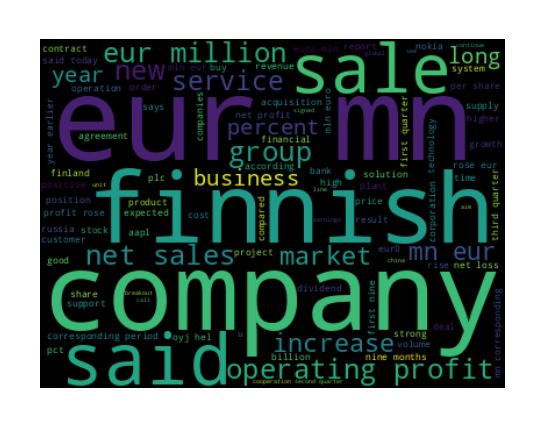

In [43]:
# Word cloud for the 'positive' class

plt.figure(figsize=(1.5, 1.5), dpi=400)
positive_sentiments = ' '.join(ml_train_df[ml_train_df['Sentiment']=='positive']['Sentence'])
positive_wordcloud = WordCloud(height=300,
                               max_words=100,
                               background_color='black').generate(positive_sentiments)

plt.imshow(positive_wordcloud, interpolation='bilinear')
plt.axis('off');

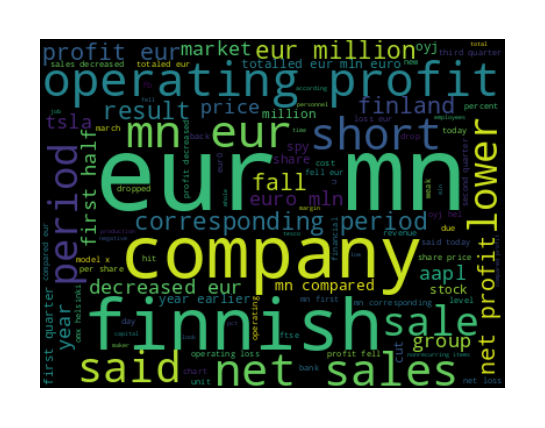

In [44]:
# Word cloud for the 'negative' class

negative_sentiments = ' '.join(ml_train_df[ml_train_df['Sentiment']=='negative']['Sentence'])
negative_wordcloud = WordCloud(height=300,
                               max_words=100,
                               background_color='black').generate(negative_sentiments)

plt.figure(figsize=(1.5, 1.5), dpi=400)
plt.imshow(negative_wordcloud, interpolation='bilinear')
plt.axis('off');

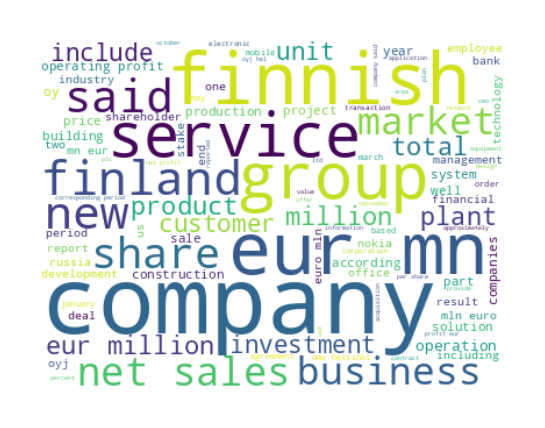

In [45]:
# Word cloud for the 'neutral' class

neutral_sentiments = ' '.join(ml_train_df[ml_train_df['Sentiment']=='neutral']['Sentence'])
neutral_wordcloud = WordCloud(height=300,
                               max_words=100,
                              background_color='white').generate(neutral_sentiments)

plt.figure(figsize=(1.5, 1.5), dpi=400)
plt.imshow(neutral_wordcloud, interpolation='bilinear')
plt.axis('off');

## Label encoding the target variable

Multi-class

*   Negative: 0
*   Neutral: 1
*   Positive: 2

In [46]:
ml_train_df_ds = remove_urls(train_df_ds)
ml_train_df_ds = data_cleaning(ml_train_df_ds)

Streaming output truncated to the last 5000 lines.

Use `df.loc[row_indexer, "col"] = values` instead, to perform the assignment in a single step and ensure this keeps updating the original `df`.

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy

  df['Sentence'][i] = str(re.compile(r'https?://\S+|www\.\S+').sub(r'', df['Sentence'][i].replace(r'\s*https?://\S+(\s+|$)', ' ').strip()))
<ipython-input-14-07bd21b1374a>:4: FutureWarning: ChainedAssignmentError: behaviour will change in pandas 3.0!
You are setting values through chained assignment. Currently this works in certain cases, but when using Copy-on-Write (which will become the default behaviour in pandas 3.0) this will never work to update the original DataFrame or Series, because the intermediate object on which we are setting values will behave as a copy.
A typical example is when you are setting values in a column of a DataFrame, like:

df

In [47]:
# For the Downsampled set

# Label encoding the target variable of train data
label_encoder_1 = LabelEncoder()
ml_train_df_ds['Sentiment'] = label_encoder_1.fit_transform(ml_train_df_ds['Sentiment'])
train_df_ds.head()

# Label encoding the target variable of test data
ml_test_df['Sentiment'] = label_encoder_1.transform(ml_test_df['Sentiment'])
test_df.head()

,Sentence,Sentiment
0,services supplier efore plc streamline operati...,2
1,aapl bounces support seems,2
2,astrazeneca chases acerta secure next cancer d...,2
3,dividend come top 045 eur shares 043 k shares ...,1
4,aldata solution oyj thomas hoyer cfo informati...,1


In [48]:
# Creating the labels after encoding
ml_y_train = ml_train_df['Sentiment'].to_numpy()
ml_y_test = ml_test_df['Sentiment'].to_numpy()

# Model Buidling

# For Machine Learning Algorithms

### **1st Implementation**

In [49]:
# Naive Bayes Model (3 classes)

tfidf_1 = TfidfVectorizer(stop_words='english')

ml_X_train_ds = ml_train_df_ds['Sentence'].to_numpy()
ml_X_train_ds = tfidf_1.fit_transform(ml_X_train_ds)

# Converting the sentences in ml_train_df to an array after preprocessing
ml_X_test = ml_test_df['Sentence'].to_numpy()

# Transforming the original test set (No resampling for the test set)
ml_X_test_ds = tfidf_1.transform(ml_X_test)

# Encoding

ml_train_df_ds['Sentiment'] = label_encoder_1.fit_transform(ml_train_df_ds['Sentiment'])
ml_y_train_ds = ml_train_df_ds['Sentiment'].to_numpy()

baseline_model_1 = MultinomialNB()
baseline_model_1.fit(ml_X_train_ds, ml_y_train_ds)

baseline_model_1_preds = baseline_model_1.predict(ml_X_test_ds)
print(classification_report(ml_y_test, baseline_model_1_preds))

              precision    recall  f1-score   support

           0       0.31      0.61      0.41       172
           1       0.77      0.61      0.68       625
           2       0.66      0.58      0.62       371

    accuracy                           0.60      1168
   macro avg       0.58      0.60      0.57      1168
weighted avg       0.67      0.60      0.62      1168



### **2nd Implementation**

In [50]:
# Naive Bayes Model (2 classes)

tfidf_2 = TfidfVectorizer(stop_words='english')

ml_X_train_b = ml_train_df_b['Sentence'].to_numpy()
ml_X_train_b = tfidf_2.fit_transform(ml_X_train_b)

# Converting the sentences in ml_train_df to an array after preprocessing
ml_X_test_b = ml_test_df_b['Sentence'].to_numpy()

# Transforming the original test set (No resampling for the test set)
ml_X_test_b = tfidf_2.transform(ml_X_test_b)

# Encoding

ml_train_df_b['Sentiment'] = label_encoder_1.fit_transform(ml_train_df_b['Sentiment'])
ml_y_train_b = ml_train_df_b['Sentiment'].to_numpy()

baseline_model_2 = MultinomialNB()
baseline_model_2.fit(ml_X_train_b, ml_y_train_b)

baseline_model_2_preds = baseline_model_2.predict(ml_X_test_b)
print(classification_report(ml_y_test_b, baseline_model_2_preds, target_names=['Negative', 'Positive']))

              precision    recall  f1-score   support

    Negative       0.83      0.12      0.20       172
    Positive       0.71      0.99      0.82       371

    accuracy                           0.71       543
   macro avg       0.77      0.55      0.51       543
weighted avg       0.75      0.71      0.63       543



**Hence, we will be dropping the neutral column and making it a Binary Classification problem.**

Hyper tuning parameters in the Baseline Model

In [51]:
model_0 = baseline_model_2

In [52]:
model_0.get_params()

{'alpha': 1.0, 'class_prior': None, 'fit_prior': True, 'force_alpha': True}

In [53]:
param_grid_0 = {'alpha' : [0.01, 0.1, 0.5, 1, 5, 10],
                'fit_prior' : [True, False]}

grid_search_0 = GridSearchCV(estimator=model_0,
                           param_grid=param_grid_0,
                           verbose=0,
                           cv=5)

grid_search_0.fit(ml_X_train_b, ml_y_train_b)

GridSearchCV(cv=5, estimator=MultinomialNB(),
             param_grid={'alpha': [0.01, 0.1, 0.5, 1, 5, 10],
                         'fit_prior': [True, False]})

In [54]:
print(f"Selected parameters: {grid_search_0.best_params_}")
print(f"Best score: {grid_search_0.best_score_}")

Selected parameters: {'alpha': 1, 'fit_prior': False}
Best score: 0.7934621811176978


In [55]:
tuned_model_0 = grid_search_0.best_estimator_
tuned_model_0

MultinomialNB(alpha=1, fit_prior=False)

In [56]:
tuned_model_0_preds = tuned_model_0.predict(ml_X_test_b)
print(classification_report(ml_y_test_b, tuned_model_0_preds, target_names=['Negative', 'Positive']))

              precision    recall  f1-score   support

    Negative       0.74      0.56      0.64       172
    Positive       0.82      0.91      0.86       371

    accuracy                           0.80       543
   macro avg       0.78      0.73      0.75       543
weighted avg       0.79      0.80      0.79       543



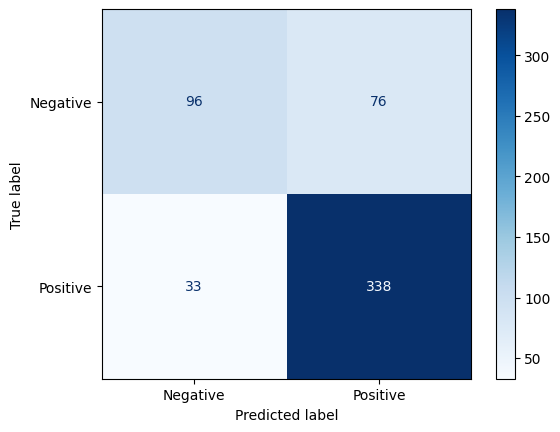

In [57]:
cm = confusion_matrix(ml_y_test_b, tuned_model_0_preds)
ConfusionMatrixDisplay(cm,
                       display_labels=['Negative', 'Positive']).plot(cmap='Blues');

### Model 1 (Logisitic Regression Model)

In [58]:
model_1 = LogisticRegression()
model_1.fit(ml_X_train_b, ml_y_train_b)

LogisticRegression()

In [59]:
model_1_preds = model_1.predict(ml_X_test_b)
print(classification_report(ml_y_test_b, model_1_preds, target_names=['Negative', 'Positive']))

              precision    recall  f1-score   support

    Negative       0.87      0.27      0.42       172
    Positive       0.74      0.98      0.85       371

    accuracy                           0.76       543
   macro avg       0.81      0.63      0.63       543
weighted avg       0.78      0.76      0.71       543



Hyper tuning parameters in Model 1

In [60]:
model_1.get_params()

{'C': 1.0,
 'class_weight': None,
 'dual': False,
 'fit_intercept': True,
 'intercept_scaling': 1,
 'l1_ratio': None,
 'max_iter': 100,
 'multi_class': 'deprecated',
 'n_jobs': None,
 'penalty': 'l2',
 'random_state': None,
 'solver': 'lbfgs',
 'tol': 0.0001,
 'verbose': 0,
 'warm_start': False}

In [61]:
param_grid_1 = {'C' : [0.01, 0.1, 1, 10, 100],
              }

grid_search_1 = GridSearchCV(estimator=model_1,
                           param_grid=param_grid_1,
                           verbose=0,
                           cv=5)

grid_search_1.fit(ml_X_train_b, ml_y_train_b)

GridSearchCV(cv=5, estimator=LogisticRegression(),
             param_grid={'C': [0.01, 0.1, 1, 10, 100]})

In [62]:
print(f"Selected parameters: {grid_search_1.best_params_}")
print(f"Best score: {grid_search_1.best_score_}")

Selected parameters: {'C': 100}
Best score: 0.8045082534242931


In [63]:
tuned_model_1 = grid_search_1.best_estimator_
tuned_model_1

LogisticRegression(C=100)

In [64]:
tuned_model_1_preds = tuned_model_1.predict(ml_X_test_b)
print(classification_report(ml_y_test_b, tuned_model_1_preds, target_names=['Negative', 'Positive']))

              precision    recall  f1-score   support

    Negative       0.74      0.55      0.63       172
    Positive       0.81      0.91      0.86       371

    accuracy                           0.80       543
   macro avg       0.78      0.73      0.75       543
weighted avg       0.79      0.80      0.79       543



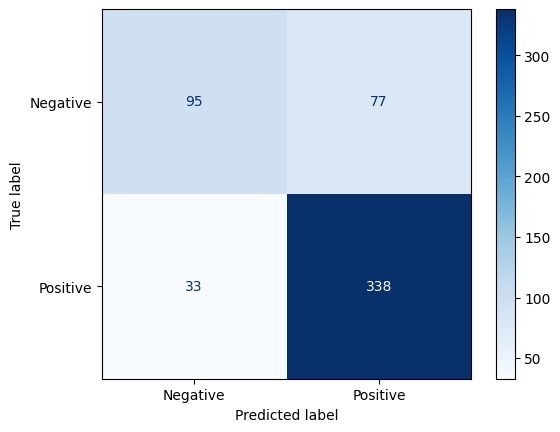

In [65]:
cm = confusion_matrix(ml_y_test_b, tuned_model_1_preds)
ConfusionMatrixDisplay(cm,
                       display_labels=['Negative', 'Positive']).plot(cmap='Blues');





### Model 2 (Gradient Boosting Classifier)

In [66]:
model_2 = GradientBoostingClassifier()
model_2.fit(ml_X_train_b, ml_y_train_b)

GradientBoostingClassifier()

In [67]:
model_2_preds = model_2.predict(ml_X_test_b)
print(classification_report(ml_y_test_b, model_2_preds, target_names=['Negative', 'Positive']))

              precision    recall  f1-score   support

    Negative       0.87      0.31      0.46       172
    Positive       0.75      0.98      0.85       371

    accuracy                           0.77       543
   macro avg       0.81      0.65      0.66       543
weighted avg       0.79      0.77      0.73       543



Hyper tuning parameters in Model 2

In [68]:
model_2.get_params()

{'ccp_alpha': 0.0,
 'criterion': 'friedman_mse',
 'init': None,
 'learning_rate': 0.1,
 'loss': 'log_loss',
 'max_depth': 3,
 'max_features': None,
 'max_leaf_nodes': None,
 'min_impurity_decrease': 0.0,
 'min_samples_leaf': 1,
 'min_samples_split': 2,
 'min_weight_fraction_leaf': 0.0,
 'n_estimators': 100,
 'n_iter_no_change': None,
 'random_state': None,
 'subsample': 1.0,
 'tol': 0.0001,
 'validation_fraction': 0.1,
 'verbose': 0,
 'warm_start': False}

In [69]:
param_grid_2 = {'learning_rate' : [0.1, 0.2],
                'n_estimators' : [300, 400],
                'max_depth' : [2, 3, 5]
              }

grid_search_2 = GridSearchCV(estimator=model_2,
                           param_grid=param_grid_2,
                           verbose=0,
                           cv=5)

grid_search_2.fit(ml_X_train_b, ml_y_train_b)

GridSearchCV(cv=5, estimator=GradientBoostingClassifier(),
             param_grid={'learning_rate': [0.1, 0.2], 'max_depth': [2, 3, 5],
                         'n_estimators': [300, 400]})

In [70]:
print(f"Selected parameters: {grid_search_2.best_params_}")
print(f"Best score: {grid_search_2.best_score_}")

Selected parameters: {'learning_rate': 0.2, 'max_depth': 2, 'n_estimators': 400}
Best score: 0.8003682378859314


In [71]:
tuned_model_2 = grid_search_2.best_estimator_
tuned_model_2

GradientBoostingClassifier(learning_rate=0.2, max_depth=2, n_estimators=400)

In [73]:
tuned_model_2_preds = tuned_model_2.predict(ml_X_test_b)
print(classification_report(ml_y_test_b, tuned_model_2_preds, target_names=['Negative', 'Positive']))

              precision    recall  f1-score   support

    Negative       0.78      0.48      0.59       172
    Positive       0.79      0.94      0.86       371

    accuracy                           0.79       543
   macro avg       0.79      0.71      0.73       543
weighted avg       0.79      0.79      0.78       543



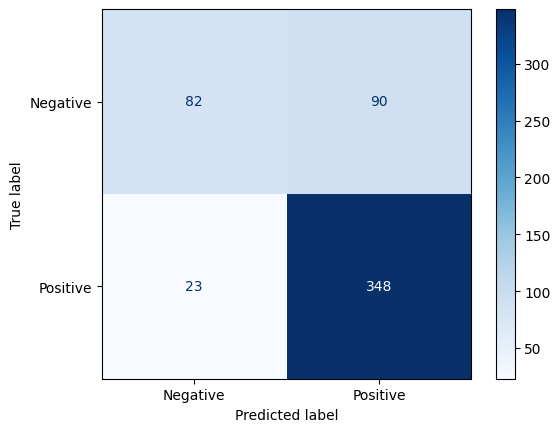

In [74]:
cm = confusion_matrix(ml_y_test_b, tuned_model_2_preds)
ConfusionMatrixDisplay(cm,
                       display_labels=['Negative', 'Positive']).plot(cmap='Blues');

## Running the Deep Learning Model

## Tokenizing the words

In [75]:
# X_train_b, X_test_b, y_train_b, y_test_b

In [76]:
dl_train_df = pd.concat([pd.DataFrame(X_train_b), pd.Series(y_train_b)], axis=1)
dl_train_df.columns = ["Sentence", "Sentiment"]
train_df_b['Sentence'] = train_df_b['Sentence'].astype(str)
dl_train_df.head()

,Sentence,Sentiment
0,easyJet expects resilient demand to withstand ...,positive
1,The company 's market share is continued to in...,positive
2,Intertek swings to Â£347 mln loss on oil's slump,negative
3,The third order awarded to Outokumpu Technolog...,positive
4,$NUGT longer term bullish,positive


In [77]:
dl_train_df = remove_urls(dl_train_df)

Streaming output truncated to the last 5000 lines.

Use `df.loc[row_indexer, "col"] = values` instead, to perform the assignment in a single step and ensure this keeps updating the original `df`.

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy

  df['Sentence'][i] = str(re.compile(r'https?://\S+|www\.\S+').sub(r'', df['Sentence'][i].replace(r'\s*https?://\S+(\s+|$)', ' ').strip()))
<ipython-input-14-07bd21b1374a>:4: FutureWarning: ChainedAssignmentError: behaviour will change in pandas 3.0!
You are setting values through chained assignment. Currently this works in certain cases, but when using Copy-on-Write (which will become the default behaviour in pandas 3.0) this will never work to update the original DataFrame or Series, because the intermediate object on which we are setting values will behave as a copy.
A typical example is when you are setting values in a column of a DataFrame, like:

df

In [78]:
dl_train_df.head()

,Sentence,Sentiment
0,easyJet expects resilient demand to withstand ...,positive
1,The company 's market share is continued to in...,positive
2,Intertek swings to Â£347 mln loss on oil's slump,negative
3,The third order awarded to Outokumpu Technolog...,positive
4,$NUGT longer term bullish,positive


In [79]:
# counting the number of words in the train set

all_words_count = 0
dl_X_train = dl_train_df['Sentence'].to_numpy()

for i in range(len(dl_X_train)):
  all_words_count += len(dl_X_train[i].split(' '))
print(all_words_count)

42792


In [80]:
# Average number of words in a sentence

print(f'Average number of words in any sentence: {all_words_count/len(X_train_b)}')

Average number of words in any sentence: 19.728907330567083


In [81]:
label_encoder_3 = LabelEncoder()
dl_train_df['Sentiment'] = label_encoder_3.fit_transform(dl_train_df['Sentiment'])
dl_train_df.head()

,Sentence,Sentiment
0,easyJet expects resilient demand to withstand ...,1
1,The company 's market share is continued to in...,1
2,Intertek swings to Â£347 mln loss on oil's slump,0
3,The third order awarded to Outokumpu Technolog...,1
4,$NUGT longer term bullish,1


In [82]:
dl_test_df = pd.concat([pd.DataFrame(X_test_b), pd.Series(y_test_b)], axis=1)
dl_test_df.columns = ["Sentence", "Sentiment"]
dl_test_df['Sentence'] = dl_test_df['Sentence'].astype(str)
dl_test_df.head()

,Sentence,Sentiment
0,"At the end of March 2007 , the group 's order ...",positive
1,$CDTI bounce here on support or H&S setup this...,positive
2,$RCON some upside today. This thing is severe ...,positive
3,UPDATE 1-Dairy Crest loses a third of Morrison...,negative
4,"Kiosk and cinema operations have suffered , in...",negative


In [83]:
dl_test_df = remove_urls(dl_test_df)

Streaming output truncated to the last 5000 lines.

Use `df.loc[row_indexer, "col"] = values` instead, to perform the assignment in a single step and ensure this keeps updating the original `df`.

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy

  df['Sentence'][i] = str(re.compile(r'https?://\S+|www\.\S+').sub(r'', df['Sentence'][i].replace(r'\s*https?://\S+(\s+|$)', ' ').strip()))
<ipython-input-14-07bd21b1374a>:4: FutureWarning: ChainedAssignmentError: behaviour will change in pandas 3.0!
You are setting values through chained assignment. Currently this works in certain cases, but when using Copy-on-Write (which will become the default behaviour in pandas 3.0) this will never work to update the original DataFrame or Series, because the intermediate object on which we are setting values will behave as a copy.
A typical example is when you are setting values in a column of a DataFrame, like:

df

In [84]:
# Label encoding the target variable of test data
dl_test_df['Sentiment'] = label_encoder_3.transform(dl_test_df['Sentiment'])
dl_test_df.head()

,Sentence,Sentiment
0,"At the end of March 2007 , the group 's order ...",1
1,$CDTI bounce here on support or H&S setup this...,1
2,$RCON some upside today. This thing is severe ...,1
3,UPDATE 1-Dairy Crest loses a third of Morrison...,0
4,"Kiosk and cinema operations have suffered , in...",0


In [85]:
# Will take the upper bound of the average number of words
max_tokens = 10000
output_sequence_length = 20

text_vectorizer = TextVectorization(max_tokens=max_tokens,
                                    standardize='lower_and_strip_punctuation',
                                    split='whitespace',
                                    output_mode='int',
                                    output_sequence_length=output_sequence_length,
                                    pad_to_max_tokens=True)


text_vectorizer.adapt(dl_X_train)

# Embedding
embedding = Embedding(input_dim=max_tokens,
                             output_dim=128,
                            #  input_length=output_sequence_length,
                      name='embedding_3')

In [86]:
dl_X_train = dl_train_df['Sentence'].to_numpy()
dl_y_train = dl_train_df['Sentiment'].to_numpy()

dl_X_test = dl_test_df['Sentence'].to_numpy()
dl_y_test = dl_test_df['Sentiment'].to_numpy()

In [87]:
dl_X_train = text_vectorizer(dl_X_train).numpy()
dl_X_test = text_vectorizer(dl_X_test).numpy()

## Model 3 (Neural Network Architecture)

In [88]:
inputs = layers.Input(shape=(1, ), dtype='int32')
x = embedding(inputs)
x = layers.Dense(64, activation='relu')(x)
x = layers.Dropout(0.5)(x)
x = layers.GlobalAveragePooling1D()(x)
outputs = layers.Dense(1, activation='sigmoid')(x)
model_3 = tf.keras.Model(inputs, outputs, name='model_3_dense')

In [89]:
model_3.compile(loss=tf.keras.losses.BinaryCrossentropy(),
                optimizer=tf.keras.optimizers.Adam(),
                metrics=['accuracy'])

In [90]:
model_3.summary()

Model: "model_3_dense"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━┓
┃ Layer (type)                         ┃ Output Shape                ┃         Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━┩
│ input_layer (InputLayer)             │ (None, 1)                   │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ embedding_3 (Embedding)              │ (None, 1, 128)              │       1,280,000 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense (Dense)                        │ (None, 1, 64)               │           8,256 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dropout (Dropout)                    │ (None, 1, 64)               │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ global_average_pooling1d             │ (None, 64)                  │               0 │
│ (GlobalAveragePooling1D)             │                             │                 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_1 (Dense)                      │ (None, 1)                   │              65 │
└──────────────────────────────────────┴─────────────────────────────┴─────────────────┘

 Total params: 1,288,321 (4.91 MB)

 Trainable params: 1,288,321 (4.91 MB)

 Non-trainable params: 0 (0.00 B)

In [91]:
model_3_history = model_3.fit(dl_X_train,
                              dl_y_train,
                              epochs=5,
                              validation_data=(dl_X_test, dl_y_test))

Epoch 1/5
68/68 ━━━━━━━━━━━━━━━━━━━━ 4s 30ms/step - accuracy: 0.6581 - loss: 0.6624 - val_accuracy: 0.6832 - val_loss: 0.6061
Epoch 2/5
68/68 ━━━━━━━━━━━━━━━━━━━━ 2s 6ms/step - accuracy: 0.6718 - loss: 0.5975 - val_accuracy: 0.7109 - val_loss: 0.5396
Epoch 3/5
68/68 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - accuracy: 0.7795 - loss: 0.4400 - val_accuracy: 0.8103 - val_loss: 0.4215
Epoch 4/5
68/68 ━━━━━━━━━━━━━━━━━━━━ 1s 5ms/step - accuracy: 0.9408 - loss: 0.2072 - val_accuracy: 0.8306 - val_loss: 0.3855
Epoch 5/5
68/68 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - accuracy: 0.9829 - loss: 0.0933 - val_accuracy: 0.8269 - val_loss: 0.3903


In [92]:
# predicting against the test set to get the probabilites
model_3_pred_probs = model_3.predict(dl_X_test)

17/17 ━━━━━━━━━━━━━━━━━━━━ 0s 12ms/step


In [93]:
# Getting the classes predicted by the model
model_3_preds = tf.round(tf.squeeze(model_3_pred_probs))

In [94]:
print(classification_report(dl_y_test, model_3_preds, target_names=['Negative', 'Positive']))

              precision    recall  f1-score   support

    Negative       0.77      0.64      0.70       172
    Positive       0.85      0.91      0.88       371

    accuracy                           0.83       543
   macro avg       0.81      0.78      0.79       543
weighted avg       0.82      0.83      0.82       543



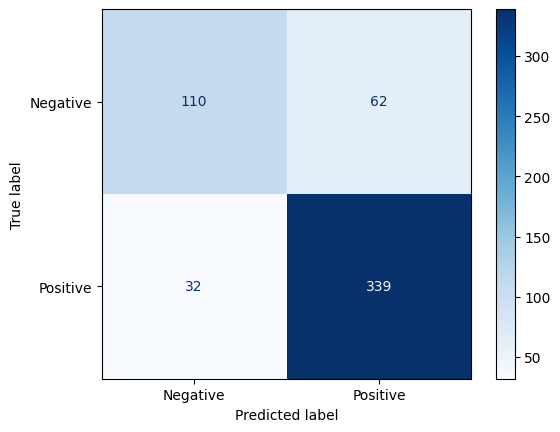

In [95]:
cm = confusion_matrix(dl_y_test, model_3_preds)
ConfusionMatrixDisplay(cm,
                       display_labels=['Negative', 'Positive']).plot(cmap='Blues');

## Model 4 (Pretrained model): Non-trainable

### Using USE (Universal Sentence Encoder)

In [96]:
loaded_model = hub.load("https://www.kaggle.com/models/google/universal-sentence-encoder/TensorFlow2/universal-sentence-encoder/2")

In [97]:
encoder_layer = hub.KerasLayer("https://www.kaggle.com/models/google/universal-sentence-encoder/TensorFlow2/universal-sentence-encoder/2",
                               input_shape=(),
                               dtype=tf.string,
                               trainable=False)

In [98]:
model_4 = tf_keras.Sequential([
    encoder_layer,
    tf_keras.layers.Dense(128, activation='relu'),
    tf_keras.layers.Dense(128, activation='relu'),
    tf_keras.layers.Reshape((1, 128)),
    tf_keras.layers.GlobalAveragePooling1D(),
    tf_keras.layers.Dense(1, activation='sigmoid'),
], name='non_trainable_USE_model' )

In [99]:
model_4.compile(loss=tf_keras.losses.BinaryCrossentropy(),
                optimizer=tf_keras.optimizers.Adam(),
                metrics=['accuracy'])

In [100]:
model_4.summary()

Model: "non_trainable_USE_model"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 keras_layer (KerasLayer)    (None, 512)               256797824 
                                                                 
 dense (Dense)               (None, 128)               65664     
                                                                 
 dense_1 (Dense)             (None, 128)               16512     
                                                                 
 reshape (Reshape)           (None, 1, 128)            0         
                                                                 
 global_average_pooling1d (  (None, 128)               0         
 GlobalAveragePooling1D)                                         
                                                                 
 dense_2 (Dense)             (None, 1)                 129       
                                           

In [101]:
dl_y_train_b = ml_train_df_b['Sentiment'].to_numpy()
dl_y_test_b = ml_test_df_b['Sentiment'].to_numpy()

In [102]:
model_4_history = model_4.fit(X_train_b,
                              dl_y_train_b,
                              epochs=5,
                              validation_data=(X_test_b, dl_y_test_b))

Epoch 1/5
68/68 [==============================] - 6s 22ms/step - loss: 0.5590 - accuracy: 0.7008 - val_loss: 0.4776 - val_accuracy: 0.7790
Epoch 2/5
68/68 [==============================] - 1s 15ms/step - loss: 0.3976 - accuracy: 0.8124 - val_loss: 0.4472 - val_accuracy: 0.7845
Epoch 3/5
68/68 [==============================] - 2s 23ms/step - loss: 0.3378 - accuracy: 0.8529 - val_loss: 0.4779 - val_accuracy: 0.7882
Epoch 4/5
68/68 [==============================] - 1s 20ms/step - loss: 0.3013 - accuracy: 0.8704 - val_loss: 0.4546 - val_accuracy: 0.7864
Epoch 5/5
68/68 [==============================] - 1s 12ms/step - loss: 0.2482 - accuracy: 0.9046 - val_loss: 0.4962 - val_accuracy: 0.7790


In [103]:
model_4_pred_probs = model_4.predict(X_test_b)
model_4_preds = tf.round(model_4_pred_probs)

17/17 [==============================] - 1s 9ms/step


In [104]:
print(classification_report(dl_y_test_b, model_4_preds, target_names=['Negative', 'Positive']))

              precision    recall  f1-score   support

    Negative       0.68      0.58      0.62       172
    Positive       0.82      0.87      0.84       371

    accuracy                           0.78       543
   macro avg       0.75      0.72      0.73       543
weighted avg       0.77      0.78      0.77       543



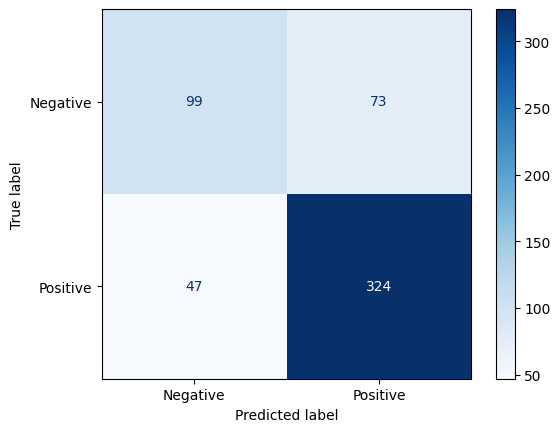

In [105]:
cm = confusion_matrix(dl_y_test_b, model_4_preds)
ConfusionMatrixDisplay(cm,
                       display_labels=['Negative', 'Positive']).plot(cmap='Blues');

## Model 5 (Pretrained model): Non-Trainable

### Using BERT (Bidirectional Encoder representations from Transformers)

In [106]:
preprocess_url = 'https://tfhub.dev/tensorflow/bert_en_uncased_preprocess/3'
encoder_url = 'https://tfhub.dev/tensorflow/small_bert/bert_en_uncased_L-4_H-512_A-8/1'

In [107]:
preprocesser = hub.KerasLayer(preprocess_url)
encoder = hub.KerasLayer(encoder_url,
                         trainable=False)

In [108]:
input = tf_keras.layers.Input(shape=(),
                              dtype=tf.string,
                              name='input_layer')

preprocessed_data = preprocesser(input)

output = encoder(preprocessed_data)

pooled_output = output['pooled_output']   # For sentence level tasks

In [109]:
# Using the functional API

x = tf_keras.layers.Dense(128, activation='relu')(pooled_output)
x = tf_keras.layers.Dense(128, activation='relu')(x)
x = tf_keras.layers.Reshape((1, 128))(x)
x = tf_keras.layers.GlobalMaxPool1D()(x)
x = tf_keras.layers.Dense(1, activation='sigmoid',
                          name='non_trainable_bert_model')(x)

model_5 = tf_keras.Model(inputs=[input], outputs=[x])

In [110]:
model_5.compile(loss=tf_keras.losses.BinaryCrossentropy(),
                optimizer=tf_keras.optimizers.Adam(),
                metrics=['accuracy'])

In [111]:
model_5.summary()

Model: "model"
__________________________________________________________________________________________________
 Layer (type)                Output Shape                 Param #   Connected to                  
 input_layer (InputLayer)    [(None,)]                    0         []                            
                                                                                                  
 keras_layer_1 (KerasLayer)  {'input_type_ids': (None,    0         ['input_layer[0][0]']         
                             128),                                                                
                              'input_mask': (None, 128)                                           
                             , 'input_word_ids': (None,                                           
                              128)}                                                               
                                                                                              

In [112]:
dl_y_train_b = ml_train_df_b['Sentiment'].to_numpy()
dl_y_test_b = ml_test_df_b['Sentiment'].to_numpy()

In [113]:
model_5_history = model_5.fit(X_train_b,
                              dl_y_train_b,
                              epochs=5,
                              validation_data=(X_test_b, dl_y_test_b))

Epoch 1/5
68/68 [==============================] - 13s 91ms/step - loss: 0.5854 - accuracy: 0.6851 - val_loss: 0.5996 - val_accuracy: 0.6851
Epoch 2/5
68/68 [==============================] - 7s 105ms/step - loss: 0.5335 - accuracy: 0.7183 - val_loss: 0.5099 - val_accuracy: 0.7385
Epoch 3/5
68/68 [==============================] - 6s 83ms/step - loss: 0.4803 - accuracy: 0.7612 - val_loss: 0.4944 - val_accuracy: 0.7440
Epoch 4/5
68/68 [==============================] - 7s 105ms/step - loss: 0.4518 - accuracy: 0.7713 - val_loss: 0.5205 - val_accuracy: 0.7274
Epoch 5/5
68/68 [==============================] - 6s 83ms/step - loss: 0.4504 - accuracy: 0.7713 - val_loss: 0.4734 - val_accuracy: 0.7587


In [114]:
model_5_pred_probs = model_5.predict(X_test_b)
model_5_preds = tf.round(model_5_pred_probs)

17/17 [==============================] - 1s 63ms/step


In [115]:
print(classification_report(dl_y_test_b, model_5_preds, target_names=['Negative', 'Positive']))

              precision    recall  f1-score   support

    Negative       0.61      0.66      0.64       172
    Positive       0.84      0.80      0.82       371

    accuracy                           0.76       543
   macro avg       0.72      0.73      0.73       543
weighted avg       0.77      0.76      0.76       543



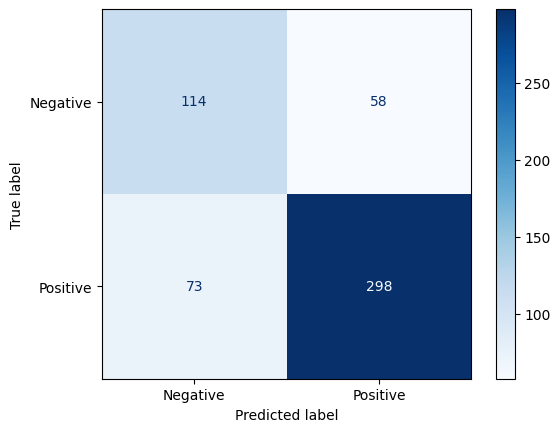

In [116]:
cm = confusion_matrix(dl_y_test_b, model_5_preds)
ConfusionMatrixDisplay(cm,
                       display_labels=['Negative', 'Positive']).plot(cmap='Blues');

**Since, USE encoder outperformed BERT, we will be training the weights of USE encoder to our problem ot better fit with our data.**

## Model 6 (Pretrained model): Trainable

In [117]:
encoder_layer = hub.KerasLayer("https://www.kaggle.com/models/google/universal-sentence-encoder/TensorFlow2/universal-sentence-encoder/2",
                               input_shape=(),
                               dtype=tf.string,
                               trainable=True)

In [118]:
model_6 = tf_keras.Sequential([
    encoder_layer,
    tf_keras.layers.Dense(128, activation='relu'),
    tf_keras.layers.Dense(128, activation='relu'),
    tf_keras.layers.Reshape((1, 128)),
    tf_keras.layers.GlobalAveragePooling1D(),
    tf_keras.layers.Dense(1, activation='sigmoid'),
], name='trainable_USE_model' )

In [119]:
model_6.compile(loss=tf_keras.losses.BinaryCrossentropy(),
                optimizer=tf_keras.optimizers.Adam(),
                metrics=['accuracy'])

In [120]:
model_6_history = model_6.fit(X_train_b,
                              dl_y_train_b,
                              epochs=5,
                              validation_data=(X_test_b, dl_y_test_b))

Epoch 1/5
68/68 [==============================] - 91s 955ms/step - loss: 0.5332 - accuracy: 0.7331 - val_loss: 0.4308 - val_accuracy: 0.8011
Epoch 2/5
68/68 [==============================] - 14s 200ms/step - loss: 0.2132 - accuracy: 0.9207 - val_loss: 0.3814 - val_accuracy: 0.8306
Epoch 3/5
68/68 [==============================] - 10s 144ms/step - loss: 0.0407 - accuracy: 0.9894 - val_loss: 0.6577 - val_accuracy: 0.8269
Epoch 4/5
68/68 [==============================] - 8s 125ms/step - loss: 0.0094 - accuracy: 0.9972 - val_loss: 0.5727 - val_accuracy: 0.8416
Epoch 5/5
68/68 [==============================] - 7s 107ms/step - loss: 0.0019 - accuracy: 1.0000 - val_loss: 0.6091 - val_accuracy: 0.8453


In [121]:
model_6_pred_probs = model_6.predict(X_test_b)
model_6_preds = tf.round(model_6_pred_probs)

17/17 [==============================] - 1s 9ms/step


In [122]:
print(classification_report(dl_y_test_b, model_6_preds, target_names=['Negative', 'Positive']))

              precision    recall  f1-score   support

    Negative       0.75      0.77      0.76       172
    Positive       0.89      0.88      0.89       371

    accuracy                           0.85       543
   macro avg       0.82      0.83      0.82       543
weighted avg       0.85      0.85      0.85       543



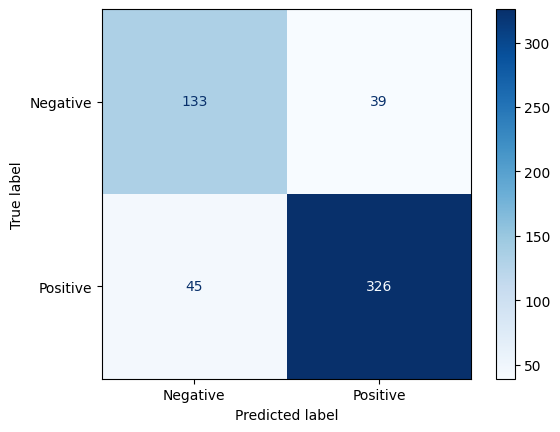

In [123]:
cm = confusion_matrix(dl_y_test_b, model_6_preds)
ConfusionMatrixDisplay(cm,
                       display_labels=['Negative', 'Positive']).plot(cmap='Blues');

------------------------------------------------------------------------------------------------------THE END----------------------------------------------------------------------------------------